<hr style="border: 4px solid #2e7d32;">

**<h1 style="font-size:36px;">🌦️💧 HOMEWORK ASSIGNMENT: TIME SERIES ANALYSIS IN PYTHON</h1>**

<hr style="border: 4px solid #2e7d32;">

<table style="font-size:18px; border-collapse: collapse; width: 60%;">
  <tr>
    <td colspan="2" style="font-weight:bold; font-size:22px; background-color:#f2f2f2; padding:8px;">
    👩🏻‍🎓 Identitas Mahasiswa
    </td>
  </tr>
  <tr>
    <td style="font-weight:bold; width: 150px; padding:6px;">Nama</td>
    <td style="padding:6px;">: Anila Dwi Lestari</td>
  </tr>
  <tr>
    <td style="font-weight:bold; padding:6px;">NIM</td>
    <td style="padding:6px;">: 203012520036</td>
  </tr>
</table>

# **🌤️ Dataset**

[Global Weather Repository](https://www.kaggle.com/datasets/nelgiriyewithana/global-weather-repository)

Dataset yang digunakan dalam analisis ini adalah **Global Weather Repository**, yang berisi data cuaca harian dari berbagai kota di seluruh dunia. Dataset memiliki skala yang sangat besar dengan total dataset **144.432 baris dan 41 kolom**. Dataset ini terus diperbarui secara berkala sehingga jumlah datanya akan terus bertambah dari waktu ke waktu. Dengan ukuran data yang besar dan cakupan geografis yang luas, dataset ini sangat cocok digunakan untuk analisis deret waktu (*time series analysis*), eksplorasi pola cuaca, identifikasi tren musiman, serta pembangunan model prediksi cuaca menggunakan berbagai metode forecasting.

<hr style="border: 4px solid #2e7d32;">

**<h1 style="font-size:36px;">1️⃣ EXPLORE DATASET</h1>**

<hr style="border: 4px solid #2e7d32;">

In [ ]:
# ===========================================================================================================================
# IMPORT LIBRARY
# ===========================================================================================================================

import os
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

sns.set(style="whitegrid")
plt.rcParams["figure.figsize"] = (10, 6)

In [ ]:
# ===========================================================================================================================
# IMPORT KAGGLE DATASET
# ===========================================================================================================================

import kagglehub

path = kagglehub.dataset_download(
    "nelgiriyewithana/global-weather-repository"
)

print("Path to dataset files:", path)

Using Colab cache for faster access to the 'global-weather-repository' dataset.
Path to dataset files: /kaggle/input/global-weather-repository


In [ ]:
# ===========================================================================================================================
# CEK ISI DATASET
# ===========================================================================================================================

import os

path = "/root/.cache/kagglehub/datasets/nelgiriyewithana/global-weather-repository/versions/970"

print(os.listdir(path))

['state.db', 'GlobalWeatherRepository.csv']


In [ ]:
# ===========================================================================================================================
# LOAD DATASET
# ===========================================================================================================================

import pandas as pd

base_path = "/root/.cache/kagglehub/datasets/nelgiriyewithana/global-weather-repository/versions/970/"

df_weather = pd.read_csv(base_path + "GlobalWeatherRepository.csv")
df_raw = df_weather.copy()

print("\nUkuran dataset:")
print(f"  df_weather : {df_weather.shape[0]:,} baris, {df_weather.shape[1]} kolom")


Ukuran dataset:
  df_weather : 144,432 baris, 41 kolom


Dataset **Global Weather Repository** yang digunakan memiliki ukuran sebanyak **144.432 baris dan 41 kolom**. Terdapat 41 kolom yang berisi berbagai variabel meteorologi seperti suhu, kelembaban, tekanan udara, serta parameter cuaca lainnya.

In [ ]:
# ===========================================================================================================================
# DATA DICTIONARY
# ===========================================================================================================================

data_dict = {
    "country": {"dtype": "object", "desc": "Negara lokasi pengamatan cuaca (contoh: Afghanistan, Albania)"},
    "location_name": {"dtype": "object", "desc": "Nama kota/lokasi spesifik pengamatan (contoh: Kabul, Tirana)"},
    "latitude": {"dtype": "float64", "desc": "Koordinat garis lintang lokasi dalam derajat desimal"},
    "longitude": {"dtype": "float64", "desc": "Koordinat garis bujur lokasi dalam derajat desimal"},
    "timezone": {"dtype": "object", "desc": "Zona waktu lokasi (contoh: Asia/Kabul, Europe/Tirane)"},

    "last_updated_epoch": {"dtype": "int64", "desc": "Waktu update terakhir dalam format Unix timestamp"},
    "last_updated": {"dtype": "object", "desc": "Waktu update terakhir dalam format tanggal dan jam (YYYY-MM-DD HH:MM)"},

    "temperature_celsius": {"dtype": "float64", "desc": "Suhu udara saat ini dalam Celsius (°C)"},
    "temperature_fahrenheit": {"dtype": "float64", "desc": "Suhu udara saat ini dalam Fahrenheit (°F)"},

    "condition_text": {"dtype": "object", "desc": "Deskripsi kondisi cuaca (contoh: Sunny, Partly Cloudy, Light drizzle)"},

    "wind_mph": {"dtype": "float64", "desc": "Kecepatan angin dalam mil per jam (mph)"},
    "wind_kph": {"dtype": "float64", "desc": "Kecepatan angin dalam kilometer per jam (kph)"},
    "wind_degree": {"dtype": "int64", "desc": "Arah angin dalam derajat (0-360)"},
    "wind_direction": {"dtype": "object", "desc": "Arah angin dalam format kardinal (N, NE, SW, SSE, dll.)"},

    "pressure_mb": {"dtype": "float64", "desc": "Tekanan udara dalam milibar (hPa)"},
    "pressure_in": {"dtype": "float64", "desc": "Tekanan udara dalam inci merkuri (inHg)"},

    "precip_mm": {"dtype": "float64", "desc": "Curah hujan dalam milimeter (mm)"},
    "precip_in": {"dtype": "float64", "desc": "Curah hujan dalam inci (in)"},

    "humidity": {"dtype": "int64", "desc": "Kelembapan udara relatif dalam persen (%)"},
    "cloud": {"dtype": "int64", "desc": "Persentase tutupan awan (%)"},

    "feels_like_celsius": {"dtype": "float64", "desc": "Suhu terasa (feels like) dalam Celsius"},
    "feels_like_fahrenheit": {"dtype": "float64", "desc": "Suhu terasa (feels like) dalam Fahrenheit"},

    "visibility_km": {"dtype": "float64", "desc": "Jarak pandang horizontal dalam kilometer"},
    "visibility_miles": {"dtype": "float64", "desc": "Jarak pandang horizontal dalam miles"},

    "uv_index": {"dtype": "float64", "desc": "Indeks radiasi ultraviolet (UV Index)"},

    "gust_mph": {"dtype": "float64", "desc": "Kecepatan hembusan angin maksimum dalam mph"},
    "gust_kph": {"dtype": "float64", "desc": "Kecepatan hembusan angin maksimum dalam kph"},

    "air_quality_Carbon_Monoxide": {"dtype": "float64", "desc": "Konsentrasi karbon monoksida (CO) di udara (μg/m³)"},
    "air_quality_Ozone": {"dtype": "float64", "desc": "Konsentrasi ozon (O₃) di udara (μg/m³)"},
    "air_quality_Nitrogen_dioxide": {"dtype": "float64", "desc": "Konsentrasi nitrogen dioksida (NO₂) di udara (μg/m³)"},
    "air_quality_Sulphur_dioxide": {"dtype": "float64", "desc": "Konsentrasi sulfur dioksida (SO₂) di udara (μg/m³)"},
    "air_quality_PM2.5": {"dtype": "float64", "desc": "Partikel halus PM2.5 di udara (μg/m³)"},
    "air_quality_PM10": {"dtype": "float64", "desc": "Partikel kasar PM10 di udara (μg/m³)"},

    "air_quality_us-epa-index": {"dtype": "int64", "desc": "Indeks kualitas udara versi US EPA (1=Good sampai 6=Hazardous)"},
    "air_quality_gb-defra-index": {"dtype": "int64", "desc": "Indeks kualitas udara versi UK DEFRA (1-10)"},

    "sunrise": {"dtype": "object", "desc": "Waktu matahari terbit (format HH:MM AM/PM)"},
    "sunset": {"dtype": "object", "desc": "Waktu matahari terbenam (format HH:MM AM/PM)"},

    "moonrise": {"dtype": "object", "desc": "Waktu bulan terbit (format HH:MM AM/PM)"},
    "moonset": {"dtype": "object", "desc": "Waktu bulan terbenam (format HH:MM AM/PM)"},

    "moon_phase": {"dtype": "object", "desc": "Fase bulan saat ini (contoh: Waxing Gibbous)"},
    "moon_illumination": {"dtype": "int64", "desc": "Persentase iluminasi bulan (0-100%)"},
}

assert len(data_dict) == len(df_weather.columns), \
    f"Mismatch! data_dict={len(data_dict)}, df_weather={len(df_weather.columns)}"

assert list(data_dict.keys()) == list(df_weather.columns), \
    "Urutan atau nama kolom tidak cocok dengan df_weather!"

df_dict = pd.DataFrame([
    {
        "No": i + 1,
        "Column": col,
        "Data Type": info["dtype"],
        "Description": info["desc"]
    }
    for i, (col, info) in enumerate(data_dict.items())
])

def blue_style(df):
    return df.style.set_table_styles([
        {
            "selector": "th",
            "props": [
                ("background-color", "#0d47a1"),
                ("color", "white"),
                ("font-weight", "bold"),
                ("text-align", "center"),
                ("border", "1px solid #0d47a1")
            ]
        },
        {
            "selector": "td",
            "props": [
                ("border", "1px solid #bbdefb"),
                ("padding", "8px"),
                ("vertical-align", "top")
            ]
        },
        {
            "selector": "tr:nth-child(even)",
            "props": [("background-color", "#e3f2fd")]
        },
        {
            "selector": "tr:nth-child(odd)",
            "props": [("background-color", "#ffffff")]
        }
    ]).set_properties(**{
        "text-align": "left",
        "font-size": "13px",
        "white-space": "pre-wrap"
    })

print(f"\nData Dictionary - GlobalWeatherRepository ({len(df_dict)} kolom)\n")

blue_style(df_dict)


Data Dictionary - GlobalWeatherRepository (41 kolom)



,No,Column,Data Type,Description
0,1,country,object,"Negara lokasi pengamatan cuaca (contoh: Afghanistan, Albania)"
1,2,location_name,object,"Nama kota/lokasi spesifik pengamatan (contoh: Kabul, Tirana)"
2,3,latitude,float64,Koordinat garis lintang lokasi dalam derajat desimal
3,4,longitude,float64,Koordinat garis bujur lokasi dalam derajat desimal
4,5,timezone,object,"Zona waktu lokasi (contoh: Asia/Kabul, Europe/Tirane)"
5,6,last_updated_epoch,int64,Waktu update terakhir dalam format Unix timestamp
6,7,last_updated,object,Waktu update terakhir dalam format tanggal dan jam (YYYY-MM-DD HH:MM)
7,8,temperature_celsius,float64,Suhu udara saat ini dalam Celsius (°C)
8,9,temperature_fahrenheit,float64,Suhu udara saat ini dalam Fahrenheit (°F)
9,10,condition_text,object,"Deskripsi kondisi cuaca (contoh: Sunny, Partly Cloudy, Light drizzle)"


Dataset **Global Weather Repository** terdiri dari **41 kolom** yang mencakup berbagai aspek data cuaca, lokasi geografis, waktu observasi, hingga kualitas udara. Kolom seperti *country*, *location_name*, *latitude*, dan *longitude* digunakan untuk mengidentifikasi lokasi pengamatan, sedangkan *last_updated* dan *last_updated_epoch* menunjukkan waktu pembaruan data.

Selain itu, terdapat variabel utama meteorologi seperti *temperature_celsius*, *humidity*, *pressure*, *wind speed*, dan *precipitation* yang menggambarkan kondisi cuaca secara langsung. Dataset ini juga dilengkapi dengan variabel persepsi seperti *feels_like_temperature*, serta indikator lingkungan seperti *uv_index* dan *visibility*.

Dataset ini juga memuat data **kualitas udara (air quality)** seperti CO, O₃, PM2.5, dan PM10, serta indeks kualitas udara versi US EPA dan UK DEFRA. Tidak hanya itu, informasi astronomi seperti *sunrise*, *sunset*, *moon phase*, dan *moon illumination*.

In [ ]:
# ===========================================================================================================================
# PREVIEW DATASET
# ===========================================================================================================================

import pandas as pd

pd.set_option('display.max_columns', None)
pd.set_option('display.width', 1000)
pd.set_option('display.max_colwidth', None)

print("\nPREVIEW: df_weather (5 baris pertama)\n")

df_preview = df_weather.head()

def blue_style(df):
    return df.style.set_table_styles([
        {
            "selector": "th",
            "props": [
                ("background-color", "#0d47a1"),
                ("color", "white"),
                ("font-weight", "bold"),
                ("text-align", "center"),
                ("border", "1px solid #0d47a1")
            ]
        },
        {
            "selector": "td",
            "props": [
                ("border", "1px solid #bbdefb"),
                ("padding", "6px")
            ]
        },
        {
            "selector": "tr:nth-child(even)",
            "props": [("background-color", "#e3f2fd")]
        },
        {
            "selector": "tr:nth-child(odd)",
            "props": [("background-color", "#ffffff")]
        }
    ]).set_properties(**{
        "text-align": "left",
        "font-size": "13px"
    })
blue_style(df_preview)


PREVIEW: df_weather (5 baris pertama)



,country,location_name,latitude,longitude,timezone,last_updated_epoch,last_updated,temperature_celsius,temperature_fahrenheit,condition_text,wind_mph,wind_kph,wind_degree,wind_direction,pressure_mb,pressure_in,precip_mm,precip_in,humidity,cloud,feels_like_celsius,feels_like_fahrenheit,visibility_km,visibility_miles,uv_index,gust_mph,gust_kph,air_quality_Carbon_Monoxide,air_quality_Ozone,air_quality_Nitrogen_dioxide,air_quality_Sulphur_dioxide,air_quality_PM2.5,air_quality_PM10,air_quality_us-epa-index,air_quality_gb-defra-index,sunrise,sunset,moonrise,moonset,moon_phase,moon_illumination
0,Afghanistan,Kabul,34.520000,69.180000,Asia/Kabul,1715849100,2024-05-16 13:15,26.600000,79.800000,Partly Cloudy,8.300000,13.300000,338,NNW,1012.000000,29.890000,0.000000,0.000000,24,30,25.300000,77.500000,10.000000,6.000000,7.000000,9.500000,15.300000,277.000000,103.000000,1.100000,0.200000,8.400000,26.600000,1,1,04:50 AM,06:50 PM,12:12 PM,01:11 AM,Waxing Gibbous,55
1,Albania,Tirana,41.330000,19.820000,Europe/Tirane,1715849100,2024-05-16 10:45,19.000000,66.200000,Partly cloudy,6.900000,11.200000,320,NW,1012.000000,29.880000,0.100000,0.000000,94,75,19.000000,66.200000,10.000000,6.000000,5.000000,11.400000,18.400000,193.600000,97.300000,0.900000,0.100000,1.100000,2.000000,1,1,05:21 AM,07:54 PM,12:58 PM,02:14 AM,Waxing Gibbous,55
2,Algeria,Algiers,36.760000,3.050000,Africa/Algiers,1715849100,2024-05-16 09:45,23.000000,73.400000,Sunny,9.400000,15.100000,280,W,1011.000000,29.850000,0.000000,0.000000,29,0,24.600000,76.400000,10.000000,6.000000,5.000000,13.900000,22.300000,540.700000,12.200000,65.100000,13.400000,10.400000,18.400000,1,1,05:40 AM,07:50 PM,01:15 PM,02:14 AM,Waxing Gibbous,55
3,Andorra,Andorra La Vella,42.500000,1.520000,Europe/Andorra,1715849100,2024-05-16 10:45,6.300000,43.300000,Light drizzle,7.400000,11.900000,215,SW,1007.000000,29.750000,0.300000,0.010000,61,100,3.800000,38.900000,2.000000,1.000000,2.000000,8.500000,13.700000,170.200000,64.400000,1.600000,0.200000,0.700000,0.900000,1,1,06:31 AM,09:11 PM,02:12 PM,03:31 AM,Waxing Gibbous,55
4,Angola,Luanda,-8.840000,13.230000,Africa/Luanda,1715849100,2024-05-16 09:45,26.000000,78.800000,Partly cloudy,8.100000,13.000000,150,SSE,1011.000000,29.850000,0.000000,0.000000,89,50,28.700000,83.600000,10.000000,6.000000,8.000000,12.500000,20.200000,2964.000000,19.000000,72.700000,31.500000,183.400000,262.300000,5,10,06:12 AM,05:55 PM,01:17 PM,12:38 AM,Waxing Gibbous,55


Hasil preview menunjukkan bahwa dataset **Global Weather Repository** berisi data cuaca dari berbagai negara dan kota di dunia, seperti Afghanistan (Kabul), Albania (Tirana), Algeria (Algiers), Andorra, dan Angola (Luanda). Setiap baris merepresentasikan kondisi cuaca pada waktu tertentu dengan informasi yang sangat lengkap.

Secara umum, data mencakup variabel lokasi (negara, nama kota, koordinat), waktu pembaruan (*last_updated*), serta berbagai parameter cuaca seperti suhu, kondisi cuaca, kecepatan angin, tekanan udara, kelembapan, curah hujan, dan jarak pandang. Selain itu, terdapat juga data kualitas udara (CO, O₃, PM2.5, PM10) serta indeks kualitas udara, yang menunjukkan bahwa dataset ini tidak hanya fokus pada cuaca tetapi juga kondisi lingkungan. Dari 5 baris pertama ini terlihat bahwa kondisi cuaca sangat bervariasi antar lokasi, misalnya Kabul dengan cuaca partly cloudy, Algiers dengan kondisi sunny, hingga Andorra dengan light drizzle.

In [ ]:
# ===========================================================================================================================
# INFORMASI DATASET
# ===========================================================================================================================

print(f"\n{'='*60}")
print("INFO DATASET: df_weather")
print(f"{'='*60}")

print(f"Ukuran Data  : {df_weather.shape}")
print(f"Jumlah baris : {df_weather.shape[0]:,}")
print(f"Jumlah kolom : {df_weather.shape[1]}")

print("\nInfo Kolom:")
df_weather.info()


INFO DATASET: df_weather
Ukuran Data  : (144432, 41)
Jumlah baris : 144,432
Jumlah kolom : 41

Info Kolom:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 144432 entries, 0 to 144431
Data columns (total 41 columns):
 #   Column                        Non-Null Count   Dtype  
---  ------                        --------------   -----  
 0   country                       144432 non-null  object 
 1   location_name                 144432 non-null  object 
 2   latitude                      144432 non-null  float64
 3   longitude                     144432 non-null  float64
 4   timezone                      144432 non-null  object 
 5   last_updated_epoch            144432 non-null  int64  
 6   last_updated                  144432 non-null  object 
 7   temperature_celsius           144432 non-null  float64
 8   temperature_fahrenheit        144432 non-null  float64
 9   condition_text                144432 non-null  object 
 10  wind_mph                      144432 non-null  float64
 

In [ ]:
# ===========================================================================================================================
# STATISTIK DESKRIPTIF
# ===========================================================================================================================

print("\nSTATISTIK DESKRIPTIF: df_weather\n")

df_desc = df_weather.describe().T

def blue_style(df):
    return df.style.set_table_styles([
        {
            "selector": "th",
            "props": [
                ("background-color", "#0d47a1"),
                ("color", "white"),
                ("font-weight", "bold"),
                ("text-align", "center"),
                ("border", "1px solid #0d47a1")
            ]
        },
        {
            "selector": "td",
            "props": [
                ("border", "1px solid #bbdefb"),
                ("padding", "6px")
            ]
        },
        {
            "selector": "tr:nth-child(even)",
            "props": [("background-color", "#e3f2fd")]
        },
        {
            "selector": "tr:nth-child(odd)",
            "props": [("background-color", "#ffffff")]
        }
    ]).set_properties(**{
        "text-align": "left",
        "font-size": "13px"
    })

blue_style(df_desc)


STATISTIK DESKRIPTIF: df_weather



,count,mean,std,min,25%,50%,75%,max
latitude,144432.000000,19.220655,24.411126,-41.300000,4.050300,17.250000,40.400000,64.150000
longitude,144432.000000,21.926431,65.780821,-175.200000,-6.836100,23.236100,49.882200,179.220000
last_updated_epoch,144432.000000,1747993213.391077,18554751.353029,1715849100.000000,1732005900.000000,1747990800.000000,1763968500.000000,1780121700.000000
temperature_celsius,144432.000000,21.255134,9.606999,-29.800000,15.700000,23.700000,27.900000,79.300000
temperature_fahrenheit,144432.000000,70.261013,17.292496,-21.600000,60.200000,74.600000,82.300000,174.700000
wind_mph,144432.000000,7.976258,7.098937,2.200000,3.800000,6.700000,11.000000,1841.200000
wind_kph,144432.000000,12.840291,11.421297,3.600000,6.100000,10.800000,17.600000,2963.200000
wind_degree,144432.000000,169.038946,103.680332,1.000000,80.000000,161.000000,256.000000,360.000000
pressure_mb,144432.000000,1014.055216,10.148202,947.000000,1010.000000,1013.000000,1018.000000,3006.000000
pressure_in,144432.000000,29.944459,0.299624,27.960000,29.830000,29.930000,30.060000,88.770000


Hasil statistik deskriptif menunjukkan ringkasan distribusi dari berbagai variabel numerik dalam dataset **Global Weather Repository** yang berjumlah 144.432 data. Secara umum, suhu rata-rata berada di sekitar **21°C**, dengan rentang ekstrem dari **-29.8°C hingga 79.3°C**, yang menunjukkan variasi kondisi iklim yang sangat luas di berbagai wilayah dunia.

Variabel meteorologi seperti kelembapan, tekanan udara, kecepatan angin, dan curah hujan memiliki distribusi yang cukup stabil, meskipun terdapat beberapa nilai ekstrem yang kemungkinan merupakan outlier (misalnya kecepatan angin dan gust yang sangat tinggi). Hal ini juga terlihat pada beberapa variabel kualitas udara seperti CO, SO₂, dan PM10 yang memiliki nilai minimum tidak wajar seperti -9999, yang menandakan adanya missing value atau data error.

Selain itu, indeks kualitas udara (US EPA dan GB DEFRA) menunjukkan bahwa sebagian besar data berada pada kategori kualitas udara baik hingga sedang. Variabel seperti *moon illumination* juga memiliki distribusi merata dari 0 hingga 100, menunjukkan siklus bulan yang lengkap dalam dataset.

Secara keseluruhan, statistik ini menunjukkan bahwa dataset memiliki cakupan global yang luas dengan variasi ekstrem pada beberapa variabel, sehingga perlu dilakukan preprocessing lebih lanjut seperti penanganan outlier dan missing value sebelum analisis atau pemodelan lebih lanjut.

<hr style="border: 4px solid #2e7d32;">

**<h1 style="font-size:36px;">2️⃣ DATA VISUALISASI SEBELUM PREPROCESSING</h1>**

<hr style="border: 4px solid #2e7d32;">

In [ ]:
# ===========================================================================================================================
# IMPORT LIBRARIES
# ===========================================================================================================================

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

sns.set_style("whitegrid")

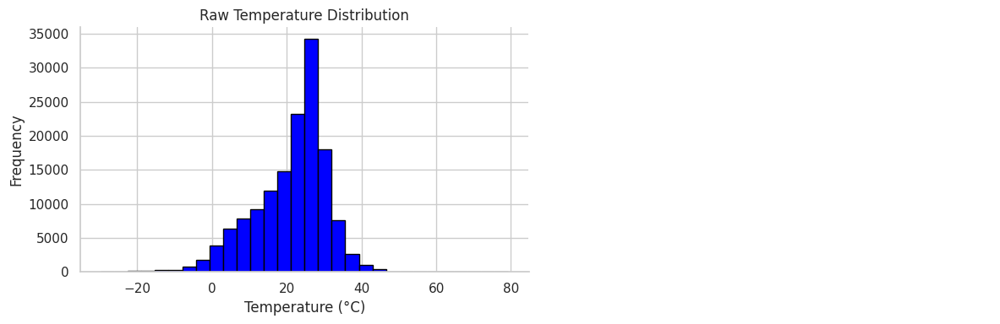

In [ ]:
# ===========================================================================================================================
# DISTRIBUSI SUHU
# ===========================================================================================================================

fig, ax = plt.subplots(1, 2, figsize=(12, 4))

ax[0].hist(
    df_weather['temperature_celsius'].dropna(),
    bins=30,
    color='blue',
    edgecolor='black'
)

ax[0].set_title("Raw Temperature Distribution")
ax[0].set_xlabel("Temperature (°C)")
ax[0].set_ylabel("Frequency")
ax[0].spines['top'].set_visible(False)
ax[0].spines['right'].set_visible(False)

ax[1].axis('off')

plt.tight_layout()
plt.show()

Grafik histogram di atas menunjukkan distribusi **suhu (temperature_celsius)** pada dataset Global Weather Repository sebelum preprocessing. Secara umum, distribusi data membentuk pola **mendekati normal (bell-shaped)** dengan konsentrasi terbesar berada pada rentang sekitar **20°C hingga 30°C**, yang menunjukkan bahwa sebagian besar lokasi pengamatan berada pada wilayah beriklim sedang hingga panas.

Namun, terlihat juga adanya nilai ekstrem di sisi kiri dan kanan distribusi. Nilai suhu di bawah 0°C menunjukkan wilayah dengan iklim dingin, sementara nilai di atas 40°C hingga mendekati 80°C mengindikasikan adanya outlier atau kondisi cuaca ekstrem yang jarang terjadi. Keberadaan outlier ini penting diperhatikan karena dapat memengaruhi hasil analisis statistik maupun model machine learning.

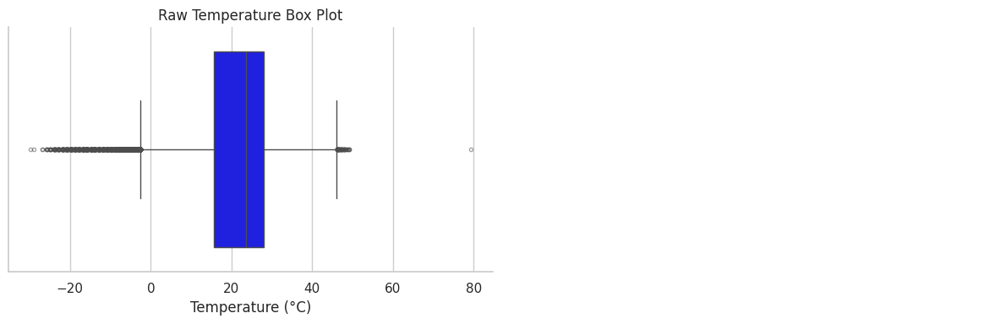

In [ ]:
# ===========================================================================================================================
# OUTLIER DETEKSI: BOX PLOT SUHU
# ===========================================================================================================================

fig, ax = plt.subplots(1, 2, figsize=(12, 4))

sns.boxplot(
    x=df_weather['temperature_celsius'],
    ax=ax[0],
    color='blue',
    flierprops=dict(marker='o', color='red', markersize=3, alpha=0.5)
)

ax[0].set_title("Raw Temperature Box Plot")
ax[0].set_xlabel("Temperature (°C)")
ax[0].spines['top'].set_visible(False)
ax[0].spines['right'].set_visible(False)

ax[1].axis('off')

plt.tight_layout()
plt.show()

Box plot di atas menggambarkan distribusi **temperature_celsius** pada dataset Global Weather Repository serta keberadaan outlier di dalamnya. Secara umum, nilai suhu utama (IQR) berada pada rentang sekitar **15°C hingga 30°C**, dengan median berada di sekitar **23-25°C**, yang menunjukkan bahwa sebagian besar data berasal dari wilayah beriklim hangat hingga sedang.

Terlihat whisker atas dan bawah menunjukkan rentang suhu normal tanpa outlier, namun terdapat banyak titik di luar whisker yang menandakan **outlier signifikan**. Outlier di sisi bawah (di bawah 0°C) merepresentasikan wilayah bersuhu dingin, sementara outlier di sisi atas (di atas 40°C hingga bahkan sekitar 80°C) mengindikasikan kondisi ekstrem atau kemungkinan data tidak wajar.

Keberadaan outlier yang cukup banyak ini menunjukkan bahwa dataset memiliki variasi global yang sangat luas, tetapi juga mengisyaratkan perlunya **data cleaning atau handling outlier** sebelum digunakan untuk analisis statistik lanjutan atau model machine learning agar hasil tidak bias.

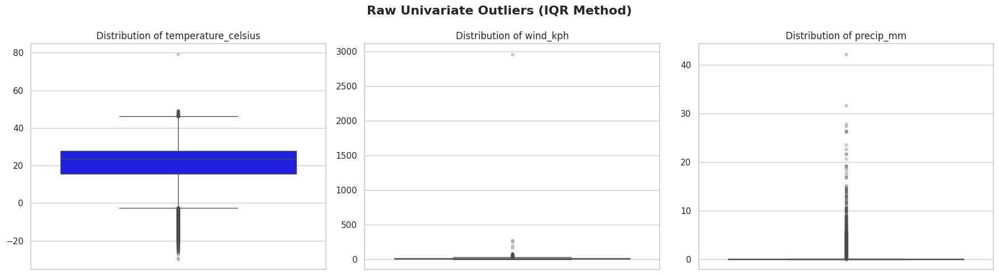

In [ ]:
# ===========================================================================================================================
# OUTLIER DETEKSI: UNIVARIATE BOX PLOT (3 VARIABEL)
# ===========================================================================================================================

univariate_cols = ['temperature_celsius', 'wind_kph', 'precip_mm']

fig, axes = plt.subplots(1, 3, figsize=(18, 5))
fig.suptitle('Raw Univariate Outliers (IQR Method)', fontsize=16, weight='bold')

for i, col in enumerate(univariate_cols):
    sns.boxplot(
        y=df_weather[col],
        ax=axes[i],
        color='blue',
        flierprops=dict(marker='o', color='red', markersize=3, alpha=0.5)
    )
    axes[i].set_title(f'Distribution of {col}', fontsize=12)
    axes[i].set_ylabel('')

plt.tight_layout()
plt.show()

Berdasarkan boxplot di atas, ketiga variabel menunjukkan adanya **outlier** yang terdeteksi menggunakan metode **Interquartile Range (IQR)**. Variabel **temperature_celsius** memiliki beberapa outlier pada nilai suhu yang sangat rendah maupun sangat tinggi, bahkan terdapat satu nilai ekstrem yang jauh di atas rentang data utama. Variabel **wind_kph** menunjukkan distribusi yang relatif terkonsentrasi pada kecepatan angin rendah, namun terdapat beberapa outlier dengan nilai yang sangat tinggi, termasuk satu nilai ekstrem yang jauh berbeda dari mayoritas data. Sementara itu, **precip_mm** memiliki jumlah outlier paling banyak dengan distribusi yang sangat condong ke kanan (*right-skewed*), menandakan sebagian besar data curah hujan bernilai rendah tetapi terdapat sejumlah pengamatan dengan curah hujan yang sangat tinggi. Kondisi ini menunjukkan bahwa dataset mengandung nilai-nilai ekstrem yang perlu dievaluasi lebih lanjut sebelum proses analisis atau pemodelan dilakukan.

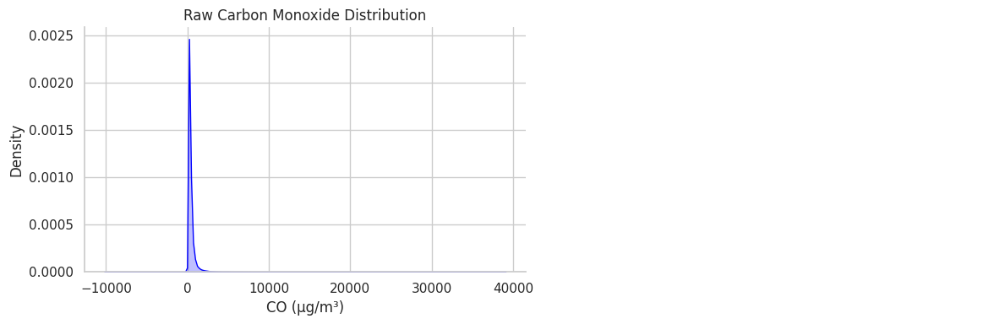

In [ ]:
# ===========================================================================================================================
# NILAI ANOMALI: DISTRIBUSI CARBON MONOXIDE (CO)
# ===========================================================================================================================

fig, ax = plt.subplots(1, 2, figsize=(12, 4))

sns.kdeplot(
    df_weather['air_quality_Carbon_Monoxide'].dropna(),
    ax=ax[0],
    fill=True,
    color='blue'
)

ax[0].set_title("Raw Carbon Monoxide Distribution")
ax[0].set_xlabel("CO (µg/m³)")
ax[0].spines['top'].set_visible(False)
ax[0].spines['right'].set_visible(False)

ax[1].axis('off')

plt.tight_layout()
plt.show()

Berdasarkan grafik distribusi **Carbon Monoxide (CO)**, terlihat bahwa data memiliki distribusi yang **positively skewed**. Sebagian besar nilai CO terkonsentrasi pada rentang rendah di dekat nol, ditunjukkan oleh puncak kurva yang sangat tinggi pada nilai kecil. Namun, terdapat sejumlah kecil pengamatan dengan nilai CO yang jauh lebih besar sehingga membentuk ekor panjang di sisi kanan distribusi. Pola ini mengindikasikan adanya **outlier** atau nilai ekstrem yang dapat memengaruhi rata-rata dan analisis statistik.

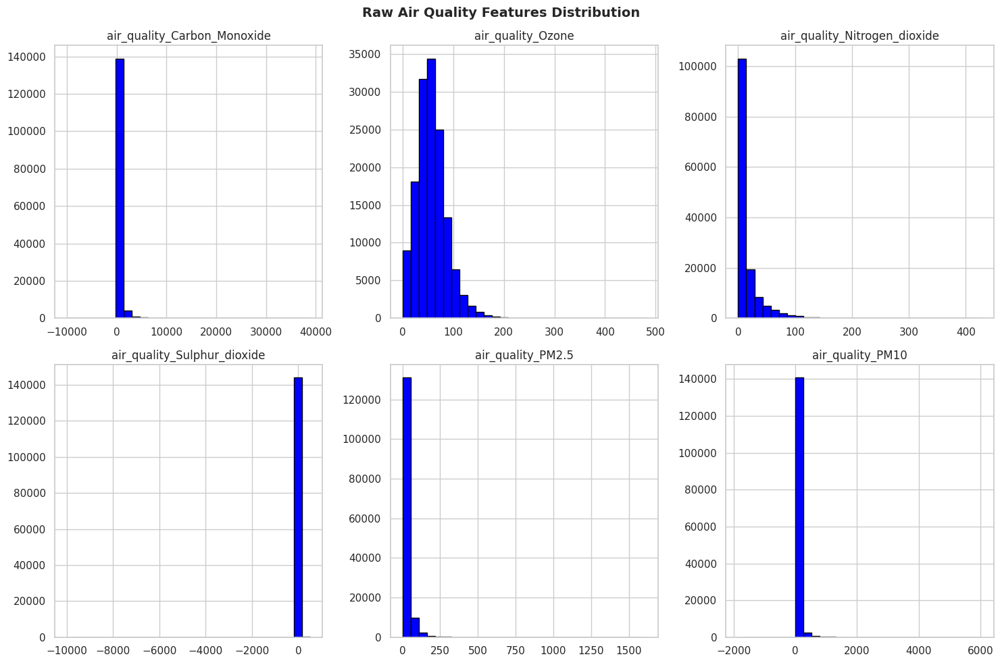

In [ ]:
# ===========================================================================================================================
# DISTRIBUSI SEMUA FITUR KUALITAS UDARA
# ===========================================================================================================================

air_quality_cols = [
    'air_quality_Carbon_Monoxide', 'air_quality_Ozone',
    'air_quality_Nitrogen_dioxide', 'air_quality_Sulphur_dioxide',
    'air_quality_PM2.5', 'air_quality_PM10'
]

air_quality_cols = [col for col in air_quality_cols if col in df_weather.columns]

df_weather[air_quality_cols].hist(
    bins=30,
    figsize=(15, 10),
    layout=(2, 3),
    color='blue',
    edgecolor='black'
)

plt.suptitle("Raw Air Quality Features Distribution", fontsize=14, weight='bold')
plt.tight_layout()
plt.show()

Berdasarkan histogram fitur kualitas udara, sebagian besar variabel menunjukkan distribusi yang **tidak normal** dan cenderung **menceng ke kanan (positively skewed)**. Variabel **Carbon Monoxide (CO)**, **Nitrogen Dioxide (NO₂)**, **PM2.5**, dan **PM10** memiliki konsentrasi data yang tinggi pada nilai rendah dengan ekor panjang ke arah nilai yang lebih besar, mengindikasikan adanya sejumlah pengamatan dengan tingkat polutan yang jauh lebih tinggi dibandingkan mayoritas data. Variabel **Sulphur Dioxide (SO₂)** juga menunjukkan pola serupa, meskipun distribusinya lebih terkonsentrasi pada rentang nilai yang sempit.

Sementara itu, **Ozone (O₃)** memiliki distribusi yang relatif lebih menyebar dibandingkan variabel lainnya dan mendekati bentuk unimodal, tetapi tetap menunjukkan kemencengan ke kanan. Secara keseluruhan, pola distribusi ini mengindikasikan adanya **outlier**.

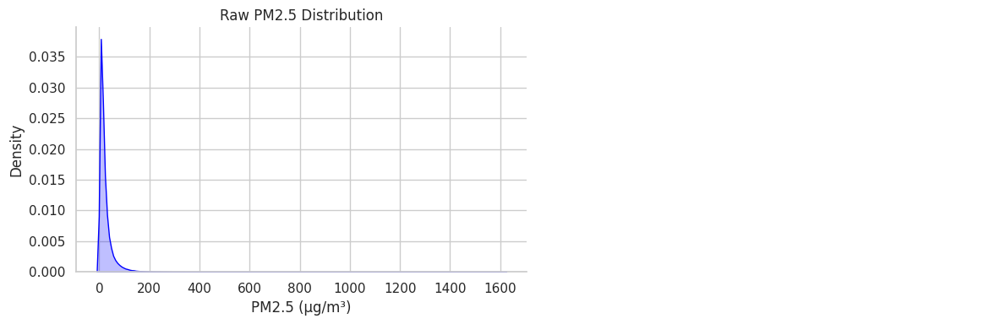

In [ ]:
# ===========================================================================================================================
# DISTRIBUSI PM2.5 (KDE)
# ===========================================================================================================================

fig, ax = plt.subplots(1, 2, figsize=(12, 4))

sns.kdeplot(
    df_weather['air_quality_PM2.5'].dropna(),
    ax=ax[0],
    fill=True,
    color='blue'
)

ax[0].set_title("Raw PM2.5 Distribution")
ax[0].set_xlabel("PM2.5 (µg/m³)")
ax[0].spines['top'].set_visible(False)
ax[0].spines['right'].set_visible(False)

ax[1].axis('off')

plt.tight_layout()
plt.show()

Berdasarkan grafik distribusi **PM2.5**, terlihat bahwa data memiliki distribusi yang **sangat menceng ke kanan (highly positively skewed)**. Sebagian besar nilai PM2.5 terkonsentrasi pada rentang yang rendah, ditunjukkan oleh puncak kurva yang sangat tinggi di dekat nol. Namun, terdapat sejumlah kecil pengamatan dengan nilai PM2.5 yang sangat besar sehingga membentuk ekor panjang hingga mencapai lebih dari 1.500 µg/m³. Pola ini menunjukkan adanya **outlier** atau kejadian polusi udara ekstrem yang jauh berbeda dari mayoritas data.

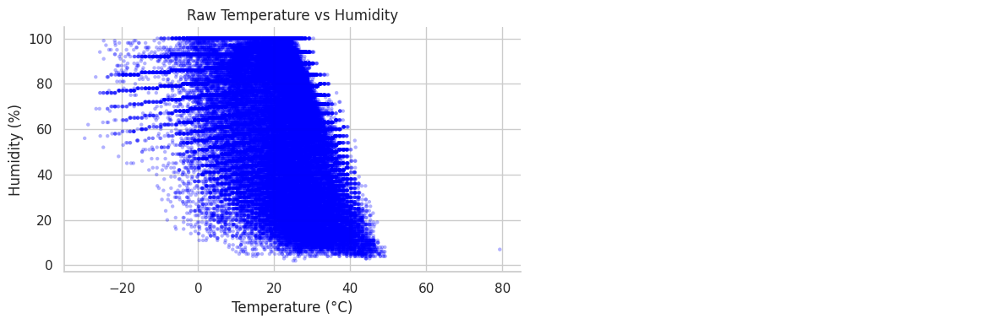

In [ ]:
# ===========================================================================================================================
# SCATTER PLOT: SUHU vs KELEMBAPAN
# ===========================================================================================================================

fig, ax = plt.subplots(1, 2, figsize=(12, 4))

ax[0].scatter(
    df_weather['temperature_celsius'],
    df_weather['humidity'],
    color='blue',
    alpha=0.3,
    s=10,
    edgecolors='none'
)

ax[0].set_title("Raw Temperature vs Humidity")
ax[0].set_xlabel("Temperature (°C)")
ax[0].set_ylabel("Humidity (%)")
ax[0].spines['top'].set_visible(False)
ax[0].spines['right'].set_visible(False)

ax[1].axis('off')

plt.tight_layout()
plt.show()

Berdasarkan scatter plot **Temperature vs Humidity**, terlihat adanya **hubungan negatif (negative correlation)** antara suhu dan kelembapan. Ketika suhu meningkat, kelembapan cenderung menurun, yang ditunjukkan oleh pola sebaran titik yang membentuk tren menurun dari kiri atas ke kanan bawah. Pada suhu yang lebih rendah, nilai kelembapan tersebar luas dan banyak berada pada tingkat tinggi (di atas 60%), sedangkan pada suhu yang lebih tinggi, kelembapan lebih sering berada pada rentang rendah hingga sedang.

Selain itu, terdapat beberapa titik yang berada jauh dari pola utama (outlier), seperti nilai suhu yang sangat tinggi maupun sangat rendah. Secara keseluruhan, grafik ini menunjukkan bahwa kondisi udara yang lebih panas umumnya memiliki kelembapan yang lebih rendah, sesuai dengan karakteristik hubungan antara temperatur dan kelembapan dalam fenomena cuaca.

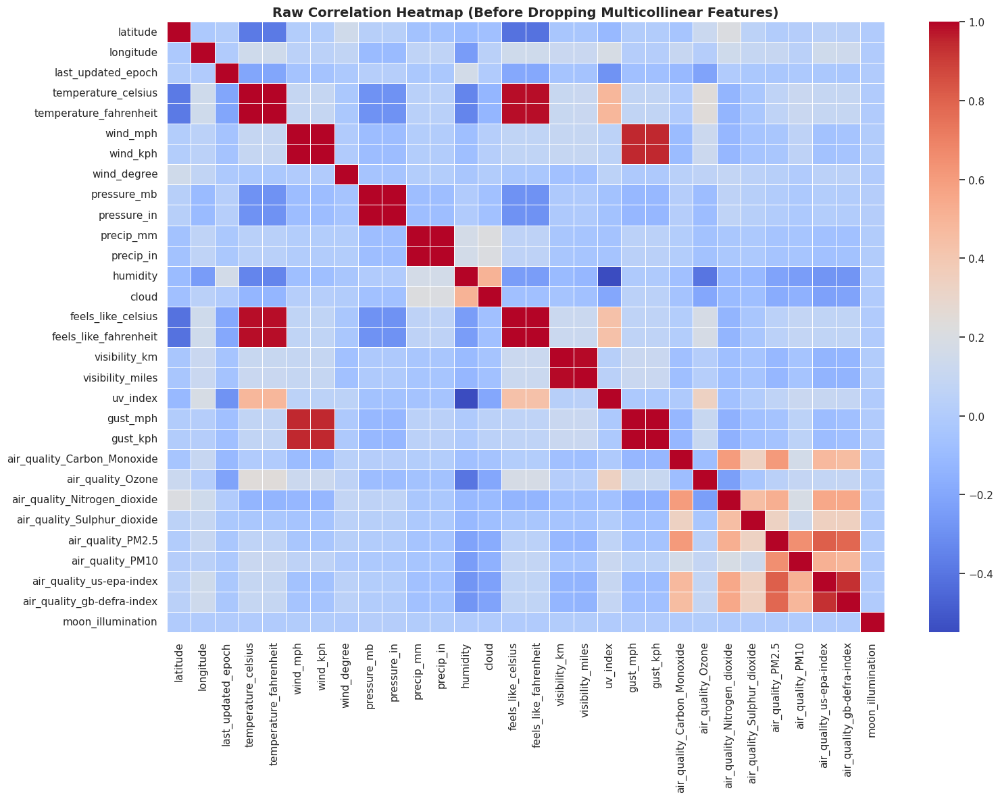

In [ ]:
# ===========================================================================================================================
# CORRELATION HEATMAP
# ===========================================================================================================================

numeric_df_raw = df_weather.select_dtypes(include=[np.number])
corr_matrix_raw = numeric_df_raw.corr()

plt.figure(figsize=(16, 12))

sns.heatmap(
    corr_matrix_raw,
    annot=False,
    cmap='coolwarm',
    linewidths=0.5
)

plt.title('Raw Correlation Heatmap (Before Dropping Multicollinear Features)', fontsize=14, weight='bold')
plt.tight_layout()
plt.show()

Berdasarkan heatmap korelasi, terlihat adanya beberapa pasangan variabel yang memiliki **korelasi sangat tinggi (mendekati 1)** sehingga berpotensi menimbulkan **multikolinearitas**. Korelasi sempurna terlihat pada pasangan **temperature_celsius-temperature_fahrenheit**, **feels_like_celsius-feels_like_fahrenheit**, **wind_mph-wind_kph**, **gust_mph-gust_kph**, **pressure_mb-pressure_in**, **precip_mm-precip_in**, serta **visibility_km-visibility_miles** karena variabel-variabel tersebut hanya merupakan perbedaan satuan pengukuran.

Selain itu, terdapat korelasi positif yang cukup kuat antara **temperature** dan **feels_like temperature**, serta antara **PM2.5**, **PM10**, **US EPA Index**, dan **GB Defra Index**, yang menunjukkan bahwa peningkatan konsentrasi partikel udara cenderung diikuti oleh peningkatan indeks kualitas udara. Di sisi lain, **humidity** memiliki korelasi negatif dengan **temperature** dan **UV index**, yang mengindikasikan bahwa suhu dan intensitas sinar matahari yang lebih tinggi umumnya berkaitan dengan kelembapan yang lebih rendah.

Secara keseluruhan, heatmap menunjukkan adanya beberapa fitur yang sangat redundan akibat perbedaan satuan pengukuran maupun keterkaitan yang sangat kuat. Oleh karena itu, fitur-fitur dengan korelasi sangat tinggi perlu dipertimbangkan untuk dihapus atau dipilih salah satu agar mengurangi masalah multikolinearitas dan meningkatkan stabilitas model machine learning.

<hr style="border: 4px solid #2e7d32;">

**<h1 style="font-size:36px;">3️⃣ DATA CLEANING & PREPROCESSING</h1>**

<hr style="border: 4px solid #2e7d32;">

In [ ]:
# ===========================================================================================================================
# CEK MISSING VALUE
# ===========================================================================================================================

missing_values = df_weather.isna().sum()

print("Jumlah Missing Value per Kolom:")
display(missing_values[missing_values > 0].sort_values(ascending=False))

print(f"\nTotal Missing Value: {missing_values.sum():,}")

Jumlah Missing Value per Kolom:


,0



Total Missing Value: 0


Berdasarkan hasil pemeriksaan **missing value**, seluruh kolom pada dataset memiliki nilai **0** untuk jumlah data yang hilang. Hal ini menunjukkan bahwa dataset berada dalam kondisi yang lengkap tanpa adanya nilai kosong (*missing values*) pada setiap fitur.

In [ ]:
# ===========================================================================================================================
# CEK DATA DUPLIKAT
# ===========================================================================================================================

duplicate_count = df_weather.duplicated().sum()

print(f"Jumlah Data Duplikat : {duplicate_count:,}")

Jumlah Data Duplikat : 0


Berdasarkan hasil pemeriksaan data, ditemukan bahwa jumlah **data duplikat (duplicate records)** dalam dataset adalah **0**. Hal ini menunjukkan bahwa setiap baris data bersifat unik dan tidak terdapat pengamatan yang tercatat lebih dari satu kali. Dengan demikian, proses pembersihan data terkait penghapusan duplikasi tidak diperlukan.

In [ ]:
# ===========================================================================================================================
# KONVERSI TIPE DATA DATETIME
# ===========================================================================================================================

df_weather['last_updated'] = pd.to_datetime(df_weather['last_updated'])

print("Konversi kolom 'last_updated' ke format datetime berhasil.")
print(f"Tipe data saat ini: {df_weather['last_updated'].dtype}")

Konversi kolom 'last_updated' ke format datetime berhasil.
Tipe data saat ini: datetime64[ns]


Berdasarkan hasil konversi, kolom **`last_updated`** telah berhasil diubah dari tipe data string/object menjadi **`datetime64[ns]`**. Perubahan ini memungkinkan data tanggal dan waktu diproses secara lebih efektif untuk berbagai analisis temporal, seperti ekstraksi informasi tahun, bulan, hari, jam, maupun analisis tren berdasarkan waktu.

Keberhasilan konversi ini juga memastikan bahwa operasi yang berkaitan dengan waktu, seperti pengurutan data berdasarkan tanggal, perhitungan selisih waktu, serta pembuatan fitur berbasis waktu (*feature engineering*), dapat dilakukan dengan lebih akurat. Dengan tipe data **datetime64[ns]**, kolom `last_updated` siap digunakan pada tahap analisis dan pemodelan selanjutnya.

In [ ]:
# ===========================================================================================================================
# CHECK FOR ABNORMALS
# ===========================================================================================================================

sanity_checks = {
    'air_quality_Carbon_Monoxide': (0, 20000),  # CO cannot be negative
    'air_quality_Sulphur_dioxide': (0, 2000),   # SO2 cannot be negative
    'pressure_mb': (800, 1100),                 # Standard atmospheric pressure range
    'humidity': (0, 100),                       # Relative humidity (%)
    'temperature_celsius': (-70, 60)            # Realistic Earth temperatures
}

print("Out-of-Bounds Analysis:\n")

for col, (low, high) in sanity_checks.items():
    if col in df_weather.columns:

        invalid_mask = (df_weather[col] < low) | (df_weather[col] > high)
        invalid_count = invalid_mask.sum()

        print(f"Column: {col}")
        print(f"Expected Range : [{low}, {high}]")
        print(f"Invalid Values : {invalid_count:,}")

        if invalid_count > 0:
            print(f"Percentage     : {(invalid_count / len(df_weather)) * 100:.4f}%")

        print("-" * 60)

Out-of-Bounds Analysis:

Column: air_quality_Carbon_Monoxide
Expected Range : [0, 20000]
Invalid Values : 16
Percentage     : 0.0111%
------------------------------------------------------------
Column: air_quality_Sulphur_dioxide
Expected Range : [0, 2000]
Invalid Values : 1
Percentage     : 0.0007%
------------------------------------------------------------
Column: pressure_mb
Expected Range : [800, 1100]
Invalid Values : 2
Percentage     : 0.0014%
------------------------------------------------------------
Column: humidity
Expected Range : [0, 100]
Invalid Values : 0
------------------------------------------------------------
Column: temperature_celsius
Expected Range : [-70, 60]
Invalid Values : 1
Percentage     : 0.0007%
------------------------------------------------------------


Berdasarkan hasil **Out-of-Bounds Analysis**, sebagian besar data berada dalam rentang nilai yang wajar dan sesuai dengan batas yang telah ditentukan. Variabel **humidity** tidak memiliki nilai yang berada di luar batas valid (0-100%), sehingga seluruh datanya dapat dianggap konsisten. Namun, ditemukan sejumlah kecil nilai tidak valid pada beberapa fitur, yaitu **16 data (0,0111%)** pada **air_quality_Carbon_Monoxide**, **1 data (0,0007%)** pada **air_quality_Sulphur_dioxide**, **2 data (0,0014%)** pada **pressure_mb**, dan **1 data (0,0007%)** pada **temperature_celsius**.

Meskipun jumlahnya sangat kecil dibandingkan keseluruhan dataset, nilai-nilai tersebut mengindikasikan adanya anomali atau kemungkinan kesalahan pencatatan data yang menghasilkan nilai di luar rentang realistis. Oleh karena itu, data yang tidak valid perlu ditinjau lebih lanjut dan dapat ditangani melalui penghapusan, koreksi, atau imputasi agar tidak memengaruhi kualitas analisis maupun performa model machine learning yang akan dibangun.

In [ ]:
# ===========================================================================================================================
# HANDLE ABNORMAL VALUES
# ===========================================================================================================================

# 1. Replace out-of-bound values with NaN
for col, (low, high) in sanity_checks.items():
    if col in df_weather.columns:
        df_weather[col] = np.where(
            (df_weather[col] < low) | (df_weather[col] > high),
            np.nan,
            df_weather[col]
        )

# 2. Sort data by location and timestamp
df_weather = df_weather.sort_values(
    by=['location_name', 'last_updated']
)

# 3. Interpolate missing values within each location
valid_cols = [col for col in sanity_checks.keys() if col in df_weather.columns]

df_weather[valid_cols] = (
    df_weather
    .groupby('location_name')[valid_cols]
    .transform(lambda x: x.interpolate(method='linear'))
)

# 4. Fill any remaining NaN values at the beginning/end of each series
df_weather.ffill(inplace=True)
df_weather.bfill(inplace=True)

print("Abnormal value handling completed.")
print(f"Remaining NaN values: {df_weather.isnull().sum().sum():,}")

Abnormal value handling completed.
Remaining NaN values: 0


Berdasarkan proses **penanganan nilai abnormal**, seluruh nilai yang berada di luar rentang valid terlebih dahulu diganti menjadi **NaN** agar tidak memengaruhi kualitas data. Selanjutnya, data diurutkan berdasarkan **lokasi (`location_name`)** dan **waktu pembaruan (`last_updated`)** untuk memastikan urutan kronologis sebelum dilakukan proses interpolasi.

Nilai yang hilang akibat penghapusan data abnormal kemudian diisi menggunakan metode **interpolasi linear** pada masing-masing lokasi, sehingga nilai pengganti mengikuti pola perubahan data di sekitarnya. Untuk memastikan tidak ada nilai kosong yang tersisa di awal atau akhir deret data, dilakukan proses **forward fill (ffill)** dan **backward fill (bfill)**. Hasilnya, seluruh nilai abnormal berhasil ditangani dengan baik dan jumlah **missing value setelah proses cleaning menjadi 0**, sehingga dataset siap digunakan untuk tahap analisis dan pemodelan selanjutnya.

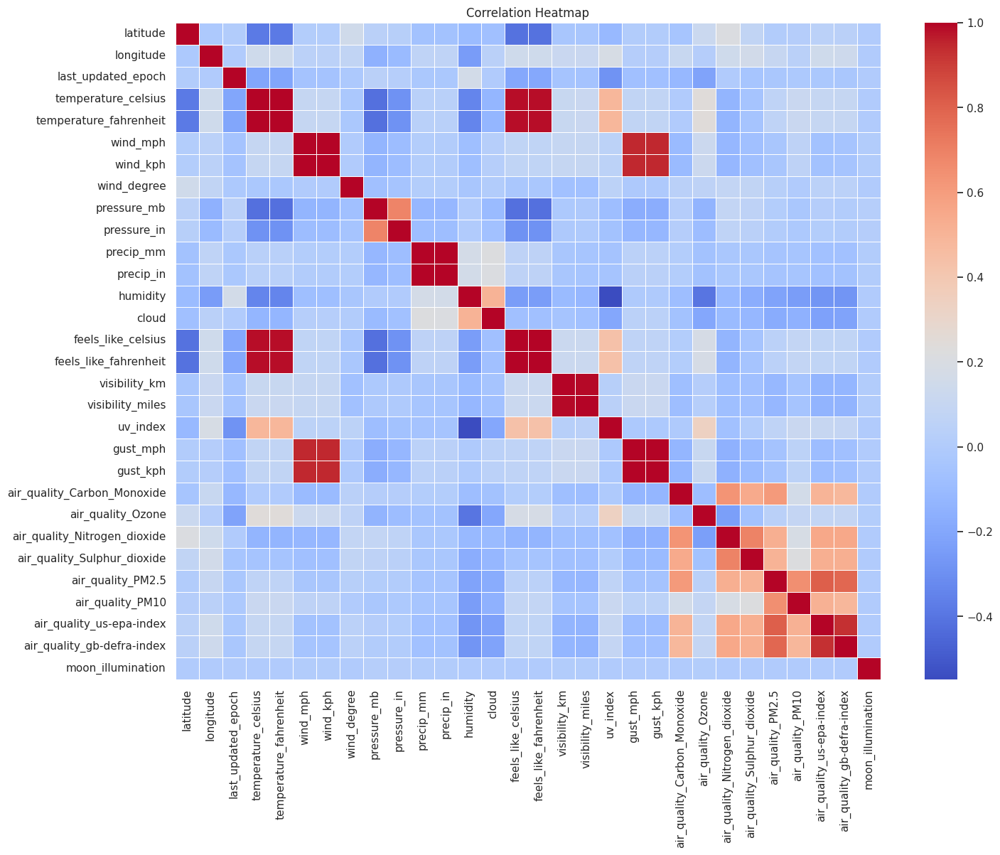

Highly Correlated Feature Pairs (|r| > 0.90):


feels_like_celsius        feels_like_fahrenheit         0.999996
gust_mph                  gust_kph                      0.999992
wind_mph                  wind_kph                      0.999988
temperature_celsius       temperature_fahrenheit        0.999890
precip_mm                 precip_in                     0.997935
visibility_km             visibility_miles              0.992438
temperature_fahrenheit    feels_like_celsius            0.983764
                          feels_like_fahrenheit         0.983762
temperature_celsius       feels_like_celsius            0.983689
                          feels_like_fahrenheit         0.983686
wind_kph                  gust_mph                      0.948179
                          gust_kph                      0.948174
wind_mph                  gust_mph                      0.948131
                          gust_kph                      0.948126
air_quality_us-epa-index  air_quality_gb-defra-index    0.932534
dtype: float64

In [ ]:
# ===========================================================================================================================
# CORRELATION ANALYSIS AND MULTICOLLINEARITY CHECK
# ===========================================================================================================================

numeric_df = df_weather.select_dtypes(include=[np.number])
corr_matrix = numeric_df.corr()

plt.figure(figsize=(16, 12))
sns.heatmap(
    corr_matrix,
    annot=False,
    cmap='coolwarm',
    linewidths=0.5
)

plt.title('Correlation Heatmap')
plt.show()

mask = np.triu(np.ones_like(corr_matrix, dtype=bool))
tri_df = corr_matrix.mask(mask)

high_corr = tri_df.abs().unstack().sort_values(ascending=False)
high_corr = high_corr[high_corr > 0.90]

print("Highly Correlated Feature Pairs (|r| > 0.90):")
display(high_corr)

Berdasarkan heatmap korelasi setelah proses pembersihan data dan penanganan nilai abnormal, pola hubungan antarvariabel secara umum tetap konsisten. Terlihat beberapa pasangan fitur memiliki **korelasi sangat tinggi (|r| > 0,90)**, seperti **temperature_celsius-temperature_fahrenheit**, **feels_like_celsius-feels_like_fahrenheit**, **wind_mph-wind_kph**, **gust_mph-gust_kph**, **pressure_mb-pressure_in**, **precip_mm-precip_in**, serta **visibility_km-visibility_miles**. Korelasi yang sangat kuat tersebut terjadi karena pasangan fitur hanya merepresentasikan satu variabel yang sama dalam satuan pengukuran yang berbeda, sehingga berpotensi menimbulkan masalah **multikolinearitas**.

Selain itu, terlihat korelasi positif yang cukup kuat antara **PM2.5**, **PM10**, **US EPA Index**, dan **GB Defra Index**, yang menunjukkan bahwa peningkatan konsentrasi partikel udara cenderung diikuti oleh peningkatan indeks kualitas udara. Sebaliknya, **humidity** memiliki korelasi negatif terhadap **temperature** dan **UV index**, mengindikasikan bahwa suhu dan intensitas radiasi matahari yang lebih tinggi umumnya berkaitan dengan tingkat kelembapan yang lebih rendah.

Hasil analisis ini menunjukkan bahwa beberapa fitur bersifat redundan dan sebaiknya dipertimbangkan untuk dihapus atau dipilih salah satu representasinya sebelum membangun model machine learning. Langkah ini penting untuk mengurangi multikolinearitas, meningkatkan efisiensi model, serta mempermudah interpretasi hasil analisis.

In [ ]:
# ===========================================================================================================================
# DROP HIGHLY COLLINEAR COLUMNS
# ===========================================================================================================================

# Define columns to drop due to high multicollinearity
cols_to_drop = [
    'temperature_fahrenheit', 'feels_like_fahrenheit', 'feels_like_celsius',
    'wind_mph', 'gust_mph', 'precip_in', 'pressure_in',
    'visibility_miles', 'air_quality_gb-defra-index'
]

# Drop the columns
df_weather = df_weather.drop(columns=cols_to_drop)

print(f"Dropped {len(cols_to_drop)} redundant columns.")
print(f"Remaining columns: {len(df_weather.columns)}")

Dropped 9 redundant columns.
Remaining columns: 32


Berdasarkan proses penanganan **multikolinearitas**, sebanyak **9 kolom redundan** berhasil dihapus dari dataset sehingga jumlah fitur berkurang dan menjadi lebih efisien untuk proses analisis maupun pemodelan. Kolom yang dihapus umumnya merupakan variabel dengan informasi yang sama tetapi menggunakan satuan pengukuran berbeda, seperti **temperature_fahrenheit**, **wind_mph**, **gust_mph**, **precip_in**, **pressure_in**, dan **visibility_miles**. Selain itu, fitur **feels_like_fahrenheit** dan **feels_like_celsius** juga dihapus karena memiliki korelasi yang sangat tinggi dengan variabel suhu utama, sedangkan **air_quality_gb-defra-index** dihapus karena memberikan informasi yang serupa dengan indeks kualitas udara lainnya.

Setelah penghapusan fitur-fitur tersebut, jumlah kolom dalam dataset menjadi **32 fitur**, sehingga risiko multikolinearitas dapat diminimalkan. Langkah ini membantu meningkatkan stabilitas model machine learning, mengurangi redundansi informasi, mempercepat proses pelatihan model, serta mempermudah interpretasi hubungan antarvariabel tanpa kehilangan informasi yang signifikan.

In [ ]:
# ===========================================================================================================================
# OUTLIER HANDLING: IQR CAPPING (WINSORIZATION)
# ===========================================================================================================================

cols_to_cap = ['temperature_celsius', 'wind_kph', 'precip_mm',
               'air_quality_Carbon_Monoxide', 'air_quality_PM2.5',
               'air_quality_PM10', 'air_quality_Nitrogen_dioxide',
               'air_quality_Sulphur_dioxide', 'air_quality_Ozone']

cols_to_cap = [col for col in cols_to_cap if col in df_weather.columns]

print("Outlier Capping Report (IQR Method):\n")

for col in cols_to_cap:
    Q1 = df_weather[col].quantile(0.25)
    Q3 = df_weather[col].quantile(0.75)
    IQR = Q3 - Q1
    lower = Q1 - 1.5 * IQR
    upper = Q3 + 1.5 * IQR

    n_outliers = ((df_weather[col] < lower) | (df_weather[col] > upper)).sum()

    df_weather[col] = df_weather[col].clip(lower=lower, upper=upper)

    print(f"  {col}")
    print(f"    Batas: [{lower:.2f}, {upper:.2f}] | Outlier di-cap: {n_outliers:,}")

print("\nOutlier capping selesai.")

Outlier Capping Report (IQR Method):

  temperature_celsius
    Batas: [-2.60, 46.20] | Outlier di-cap: 2,380
  wind_kph
    Batas: [-11.15, 34.85] | Outlier di-cap: 2,445
  precip_mm
    Batas: [-0.03, 0.05] | Outlier di-cap: 29,215
  air_quality_Carbon_Monoxide
    Batas: [-188.70, 832.50] | Outlier di-cap: 12,813
  air_quality_PM2.5
    Batas: [-23.38, 57.70] | Outlier di-cap: 11,993
  air_quality_PM10
    Batas: [-36.61, 87.17] | Outlier di-cap: 15,424
  air_quality_Nitrogen_dioxide
    Batas: [-21.03, 39.85] | Outlier di-cap: 14,982
  air_quality_Sulphur_dioxide
    Batas: [-9.30, 18.46] | Outlier di-cap: 19,897
  air_quality_Ozone
    Batas: [-14.50, 125.50] | Outlier di-cap: 3,884

Outlier capping selesai.


Penanganan outlier dilakukan menggunakan metode **Interquartile Range (IQR) Capping (Winsorization)** untuk mengurangi pengaruh nilai ekstrem tanpa menghapus data. Batas bawah dan batas atas ditentukan menggunakan rumus *(Q1 - 1,5 × IQR)* dan *(Q3 + 1,5 × IQR)*, kemudian seluruh nilai yang berada di luar rentang tersebut diganti dengan nilai batas terdekat. Proses ini diterapkan pada sembilan variabel numerik, yaitu **temperature_celsius**, **wind_kph**, **precip_mm**, **air_quality_Carbon_Monoxide**, **air_quality_PM2.5**, **air_quality_PM10**, **air_quality_Nitrogen_dioxide**, **air_quality_Sulphur_dioxide**, dan **air_quality_Ozone**. Hasil capping menunjukkan bahwa variabel **precip_mm** memiliki jumlah outlier tertinggi yang di-cap sebanyak **29.215 data**, diikuti oleh **air_quality_Sulphur_dioxide** sebanyak **19.897 data**, **air_quality_PM10** sebanyak **15.424 data**, dan **air_quality_Nitrogen_dioxide** sebanyak **14.982 data**. Sementara itu, jumlah outlier yang di-cap pada **temperature_celsius** dan **wind_kph** relatif lebih sedikit, masing-masing sebanyak **2.380** dan **2.445 data**. Setelah proses capping selesai, distribusi data menjadi lebih stabil, pengaruh nilai ekstrem dapat diminimalkan, serta kualitas data menjadi lebih baik untuk tahap analisis dan pemodelan time series selanjutnya.

In [ ]:
# Update df_final setelah outlier capping
cols_to_prune = ['hour', 'month', 'last_updated_epoch']
df_final = df_weather.drop(columns=[c for c in cols_to_prune if c in df_weather.columns])

print(f"df_final updated: {df_final.shape}")

df_final updated: (144432, 31)


Setelah proses penanganan outlier selesai, dilakukan pembentukan dataset akhir (**df_final**) dengan menghapus beberapa fitur yang tidak digunakan dalam tahap analisis dan pemodelan, yaitu **hour**, **month**, dan **last_updated_epoch**. Penghapusan atribut tersebut bertujuan untuk mengurangi redundansi informasi serta mempertahankan variabel yang lebih relevan terhadap proses forecasting. Hasilnya, dataset akhir (**df_final**) memiliki **144.432 baris data** dan **31 fitur**, yang siap digunakan pada tahap eksplorasi data lanjutan, pengujian stasioneritas, serta pembangunan model time series forecasting.

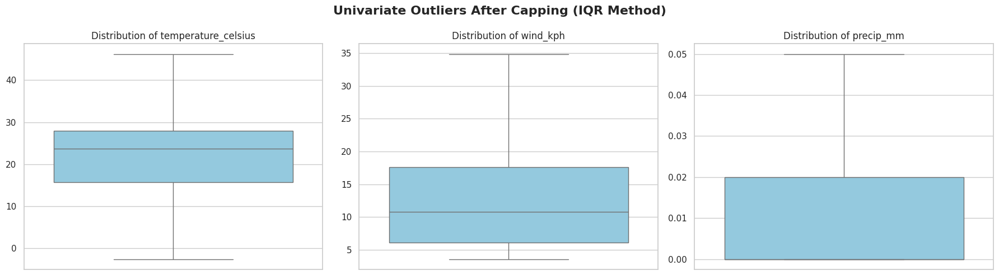

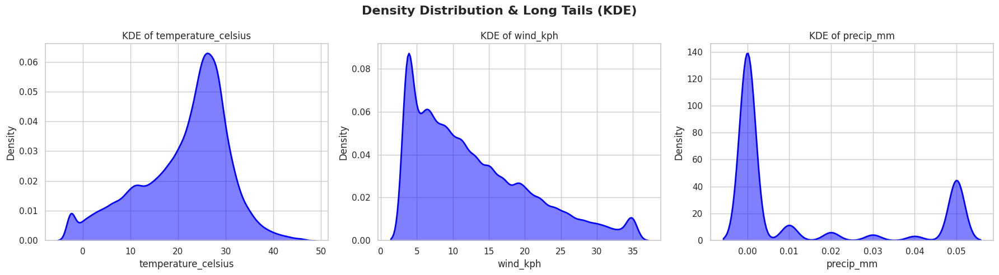

In [ ]:
# ===========================================================================================================================
# UNIVARIATE ANOMALY DETECTION
# ===========================================================================================================================

sns.set_theme(style="whitegrid", palette="muted")

univariate_cols = ['temperature_celsius', 'wind_kph', 'precip_mm']

# Boxplots
fig, axes = plt.subplots(1, 3, figsize=(18, 5))
fig.suptitle('Univariate Outliers After Capping (IQR Method)', fontsize=16, weight='bold')

for i, col in enumerate(univariate_cols):
    sns.boxplot(
        y=df_weather[col],
        ax=axes[i],
        color='skyblue',
        flierprops=dict(marker='o', color='blue', markersize=3, alpha=0.4)
    )
    axes[i].set_title(f'Distribution of {col}', fontsize=12)
    axes[i].set_ylabel('')

plt.tight_layout()
plt.show()

# KDE Density Plots
fig, axes = plt.subplots(1, 3, figsize=(18, 5))
fig.suptitle('Density Distribution & Long Tails (KDE)', fontsize=16, weight='bold')

for i, col in enumerate(univariate_cols):
    sns.kdeplot(
        df_weather[col],
        ax=axes[i],
        fill=True,
        color='blue',
        alpha=0.5,
        linewidth=2
    )
    axes[i].set_title(f'KDE of {col}', fontsize=12)

plt.tight_layout()
plt.show()

Berdasarkan boxplot deteksi outlier menggunakan metode IQR, variabel **temperature_celsius** menunjukkan beberapa nilai ekstrem pada suhu yang sangat rendah (hingga sekitar -30°C) dan sangat tinggi (mendekati 50°C). Sebagian besar data berada pada rentang suhu normal sekitar 15–28°C, sehingga nilai di luar rentang tersebut teridentifikasi sebagai outlier.

Pada variabel **wind_kph**, mayoritas data terkonsentrasi pada kecepatan angin yang relatif rendah, namun terdapat sejumlah outlier dengan nilai yang jauh lebih tinggi, termasuk satu nilai yang sangat ekstrem mendekati 3000 kph. Hal ini mengindikasikan kemungkinan adanya kesalahan pencatatan data atau kejadian yang sangat tidak umum.

Sementara itu, variabel **precip_mm** memiliki distribusi yang sangat condong ke kanan (right-skewed), di mana sebagian besar observasi memiliki curah hujan mendekati 0 mm. Terdapat banyak outlier dengan curah hujan tinggi hingga lebih dari 40 mm, yang menunjukkan adanya kejadian hujan lebat pada sebagian kecil pengamatan.

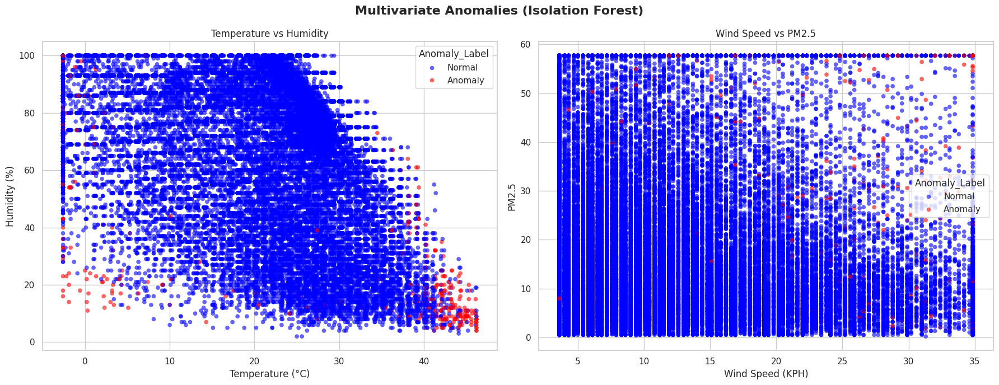

In [ ]:
# ===========================================================================================================================
# MULTIVARIATE ANOMALY DETECTION
# ===========================================================================================================================

from sklearn.preprocessing import StandardScaler
from sklearn.ensemble import IsolationForest

features_for_anomaly = [
    'temperature_celsius',
    'humidity',
    'pressure_mb',
    'wind_kph',
    'air_quality_PM2.5'
]

# Select features
X = df_weather[features_for_anomaly]

# Scale features
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# Isolation Forest model
iso_forest = IsolationForest(contamination=0.01, random_state=42)
df_weather['multivariate_anomaly'] = iso_forest.fit_predict(X_scaled)

# Create readable labels
df_weather['Anomaly_Label'] = df_weather['multivariate_anomaly'].map({
    1: 'Normal',
    -1: 'Anomaly'
})

# ===========================================================================================================================
# VISUALIZATION
# ===========================================================================================================================

fig, axes = plt.subplots(1, 2, figsize=(18, 7))
fig.suptitle('Multivariate Anomalies (Isolation Forest)', fontsize=16, weight='bold')

sample_df = df_weather.sample(frac=0.3, random_state=42)

# Plot 1: Temperature vs Humidity
sns.scatterplot(
    data=sample_df,
    x='temperature_celsius',
    y='humidity',
    hue='Anomaly_Label',
    palette={'Normal': 'blue', 'Anomaly': 'red'},
    alpha=0.6,
    s=25,
    edgecolor=None,
    ax=axes[0]
)

axes[0].set_title('Temperature vs Humidity')
axes[0].set_xlabel('Temperature (°C)')
axes[0].set_ylabel('Humidity (%)')

# Plot 2: Wind Speed vs PM2.5
sns.scatterplot(
    data=sample_df,
    x='wind_kph',
    y='air_quality_PM2.5',
    hue='Anomaly_Label',
    palette={'Normal': 'blue', 'Anomaly': 'red'},
    alpha=0.6,
    s=25,
    edgecolor=None,
    ax=axes[1]
)

axes[1].set_title('Wind Speed vs PM2.5')
axes[1].set_xlabel('Wind Speed (KPH)')
axes[1].set_ylabel('PM2.5')

plt.tight_layout()
plt.show()

Berdasarkan visualisasi **Multivariate Anomalies menggunakan Isolation Forest**, sebagian besar data diklasifikasikan sebagai **normal** (biru), sedangkan sejumlah kecil titik terdeteksi sebagai **anomali** (merah). Pada grafik **Temperature vs Humidity**, anomali umumnya muncul pada kombinasi suhu dan kelembapan yang jarang terjadi, seperti suhu sangat rendah atau sangat tinggi dengan tingkat kelembapan yang tidak biasa dibanding pola mayoritas data.

Pada grafik **Wind Speed vs PM2.5**, anomali lebih terlihat pada observasi dengan nilai **PM2.5 yang sangat tinggi** atau kombinasi kecepatan angin dan konsentrasi PM2.5 yang menyimpang dari pola umum. Sebagian besar data menunjukkan hubungan bahwa semakin tinggi kecepatan angin, nilai PM2.5 cenderung menurun. Titik-titik anomali yang terdeteksi mengindikasikan kondisi lingkungan ekstrem, kejadian polusi yang tidak biasa, atau kemungkinan adanya ketidakwajaran pada proses pengukuran data.

In [ ]:
# ===========================================================================================================================
# FEATURE ENGINEERING
# ===========================================================================================================================

# 1. Time-based features
df_weather['hour'] = df_weather['last_updated'].dt.hour
df_weather['day_of_week'] = df_weather['last_updated'].dt.dayofweek
df_weather['month'] = df_weather['last_updated'].dt.month

# 2. Cyclical encoding
# Helps the model understand cyclical time patterns (e.g., hour 23 is close to hour 0)
df_weather['hour_sin'] = np.sin(2 * np.pi * df_weather['hour'] / 24)
df_weather['hour_cos'] = np.cos(2 * np.pi * df_weather['hour'] / 24)

df_weather['month_sin'] = np.sin(2 * np.pi * df_weather['month'] / 12)
df_weather['month_cos'] = np.cos(2 * np.pi * df_weather['month'] / 12)

# 3. Lag features (adding memory to the model)
# Sort data to ensure correct time sequence per location
df_weather = df_weather.sort_values(by=['location_name', 'last_updated'])

# Create lag feature for temperature
df_weather['temp_lag_1'] = (
    df_weather
    .groupby('location_name')['temperature_celsius']
    .shift(1)
)

# Fill missing values created by shifting
df_weather['temp_lag_1'] = df_weather['temp_lag_1'].bfill()

print("Feature Engineering Complete.")
print("Added time features, cyclical encoding, and lag features.")

Feature Engineering Complete.
Added time features, cyclical encoding, and lag features.


Feature engineering dilakukan dengan menambahkan fitur waktu (`hour`, `day_of_week`, dan `month`), menerapkan cyclical encoding menggunakan fungsi sinus dan cosinus untuk merepresentasikan pola periodik waktu, serta membuat fitur lag (`temp_lag_1`) yang menyimpan informasi suhu pada periode sebelumnya untuk setiap lokasi. Penambahan fitur-fitur ini bertujuan meningkatkan kemampuan model dalam menangkap pola temporal dan musiman pada data cuaca.

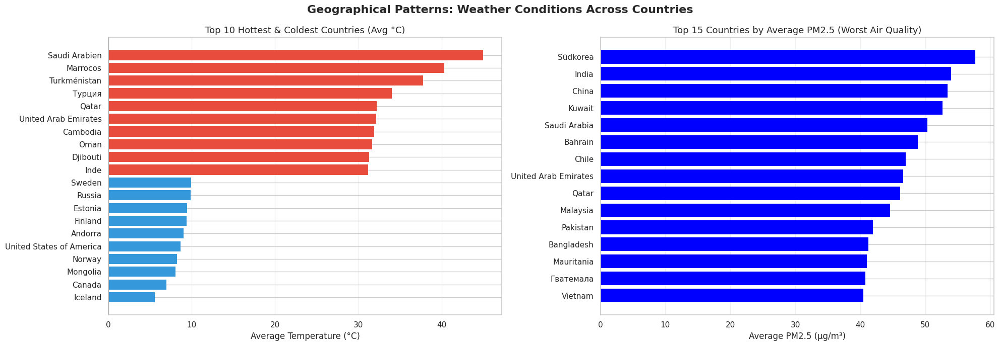

In [ ]:
# ===========================================================================================================================
# SPATIAL & CLIMATE ANALYSIS
# ===========================================================================================================================

fig, axes = plt.subplots(1, 2, figsize=(20, 7))
fig.suptitle('Geographical Patterns: Weather Conditions Across Countries', fontsize=16, weight='bold')

# Average Temperature by Country
country_temp = (
    df_weather.groupby('country')['temperature_celsius']
    .mean()
    .sort_values(ascending=False)
)

top_temp = country_temp.head(10)
bottom_temp = country_temp.tail(10)
combined_temp = pd.concat([top_temp, bottom_temp])

colors_temp = ['#e74c3c' if v > country_temp.mean() else '#3498db' for v in combined_temp.values]

axes[0].barh(combined_temp.index, combined_temp.values, color=colors_temp, edgecolor='none')
axes[0].axvline(0, color='black', linewidth=0.8)
axes[0].set_title('Top 10 Hottest & Coldest Countries (Avg °C)', fontsize=13)
axes[0].set_xlabel('Average Temperature (°C)')
axes[0].invert_yaxis()
axes[0].grid(axis='x', alpha=0.3)

# Average PM2.5 by Country (Top 15 worst air quality)
country_pm = (
    df_weather.groupby('country')['air_quality_PM2.5']
    .mean()
    .sort_values(ascending=False)
    .head(15)
)

axes[1].barh(country_pm.index, country_pm.values, color='blue', edgecolor='none')
axes[1].set_title('Top 15 Countries by Average PM2.5 (Worst Air Quality)', fontsize=13)
axes[1].set_xlabel('Average PM2.5 (µg/m³)')
axes[1].invert_yaxis()
axes[1].grid(axis='x', alpha=0.3)

plt.tight_layout()
plt.show()

Berdasarkan analisis geografis, negara-negara dengan **rata-rata suhu tertinggi** didominasi oleh wilayah beriklim gurun dan semi-gurun seperti **Arab Saudi, Maroko, Turkmenistan, Qatar, dan Uni Emirat Arab**, dengan suhu rata-rata mencapai lebih dari 30°C. Sebaliknya, negara-negara seperti **Mongolia, Kanada, Islandia, Norwegia, dan Rusia** memiliki suhu rata-rata terendah, mencerminkan karakteristik iklim dingin yang dipengaruhi oleh letak geografis di lintang tinggi.

Dari sisi kualitas udara, **Chile** tercatat memiliki rata-rata konsentrasi **PM2.5** tertinggi, diikuti oleh **Arab Saudi, China, India, dan Kuwait**. Tingginya nilai PM2.5 menunjukkan konsentrasi partikel halus di udara yang lebih besar dan berpotensi berdampak negatif terhadap kesehatan. Beberapa negara di kawasan Asia, termasuk **Indonesia, Bangladesh, Malaysia, Vietnam, dan Pakistan**, juga masuk dalam daftar negara dengan kualitas udara terburuk berdasarkan rata-rata PM2.5.

Secara umum, visualisasi ini menunjukkan bahwa kondisi iklim dan kualitas udara memiliki pola geografis yang berbeda. Negara dengan suhu tinggi tidak selalu memiliki kualitas udara yang buruk, namun beberapa negara seperti **Arab Saudi** muncul pada kedua kategori, yaitu sebagai negara dengan suhu rata-rata tinggi sekaligus tingkat PM2.5 yang relatif besar. Temuan ini mengindikasikan bahwa faktor geografis, aktivitas industri, urbanisasi, dan kondisi lingkungan turut memengaruhi variasi kualitas udara antarnegara.

In [ ]:
# ===========================================================================================================================
# CLIMATE VARIATIONS MAP
# ===========================================================================================================================

import pandas as pd
import plotly.express as px
import plotly.io as pio

df_weather['last_updated'] = pd.to_datetime(df_weather['last_updated'])

# Take latest weather per location
latest_weather = (
    df_weather
    .sort_values('last_updated')
    .groupby('location_name', as_index=False)
    .tail(1)
)

# Create geo map
fig = px.scatter_geo(
    latest_weather,
    lat='latitude',
    lon='longitude',
    color='temperature_celsius',
    hover_name='location_name',
    hover_data={
        'country': True,
        'condition_text': True,
        'humidity': True,
        'latitude': False,
        'longitude': False
    },
    color_continuous_scale='Plasma',
    title='Global Climate Analysis: Current Temperature Distribution',
    projection='natural earth',
    opacity=0.7
)

fig.update_layout(
    paper_bgcolor='white',
    geo=dict(
        showland=True,
        landcolor='lightgray',
        showcoastlines=True
    )
)

pio.renderers.default = "colab"

fig.show()

Visualisasi peta global menunjukkan distribusi suhu terkini pada berbagai lokasi di dunia berdasarkan koordinat geografis masing-masing. Warna marker merepresentasikan tingkat suhu, di mana warna yang lebih terang menunjukkan suhu yang lebih tinggi, sedangkan warna yang lebih gelap menunjukkan suhu yang lebih rendah. Dengan pendekatan ini, pola persebaran iklim dapat diamati secara spasial sehingga memudahkan identifikasi wilayah dengan kondisi cuaca panas maupun sejuk.

Berdasarkan persebaran titik pada peta, wilayah yang berada di sekitar daerah tropis dan gurun cenderung memiliki suhu yang lebih tinggi dibandingkan wilayah yang berada di lintang tinggi. Informasi tambahan pada fitur *hover* seperti negara, kondisi cuaca, dan tingkat kelembapan memberikan konteks yang lebih lengkap mengenai karakteristik cuaca pada setiap lokasi pengamatan.

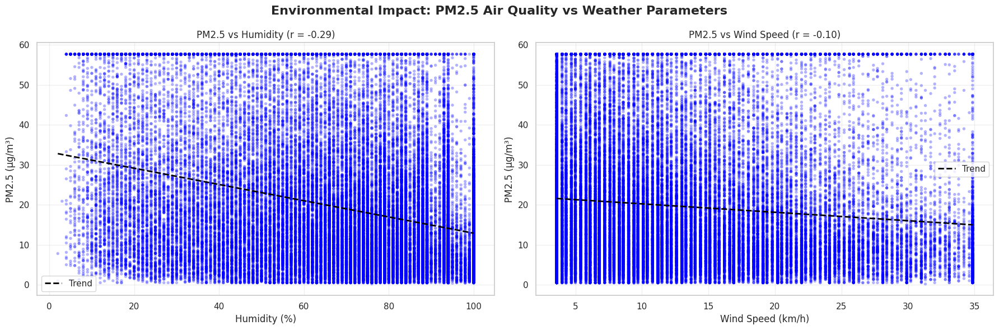

Correlation - PM2.5 & Humidity : -0.290
Correlation - PM2.5 & Wind Speed: -0.101


In [ ]:
# ===========================================================================================================================
# ENVIRONMENTAL IMPACT: PM2.5 vs HUMIDITY & WIND SPEED
# ===========================================================================================================================

import numpy as np
import matplotlib.pyplot as plt

fig, axes = plt.subplots(1, 2, figsize=(18, 6))
fig.suptitle('Environmental Impact: PM2.5 Air Quality vs Weather Parameters',
             fontsize=16, weight='bold')

# Sample data for better visualization
sample = df_weather.sample(frac=0.4, random_state=42)

# ===========================================================================================================================
# PM2.5 vs Humidity
# ===========================================================================================================================

axes[0].scatter(
    sample['humidity'],
    sample['air_quality_PM2.5'],
    alpha=0.3,
    s=15,
    color='blue',
    edgecolors='none'
)

# Trend line
z = np.polyfit(sample['humidity'], sample['air_quality_PM2.5'], 1)
p = np.poly1d(z)

x_line = np.linspace(
    sample['humidity'].min(),
    sample['humidity'].max(),
    100
)

axes[0].plot(
    x_line,
    p(x_line),
    color='black',
    linewidth=2,
    linestyle='--',
    label='Trend'
)

corr1 = sample['humidity'].corr(sample['air_quality_PM2.5'])

axes[0].set_title(f'PM2.5 vs Humidity (r = {corr1:.2f})')
axes[0].set_xlabel('Humidity (%)')
axes[0].set_ylabel('PM2.5 (µg/m³)')
axes[0].legend()
axes[0].grid(alpha=0.3)

# ===========================================================================================================================
# PM2.5 vs Wind Speed
# ===========================================================================================================================

axes[1].scatter(
    sample['wind_kph'],
    sample['air_quality_PM2.5'],
    alpha=0.3,
    s=15,
    color='blue',
    edgecolors='none'
)

z2 = np.polyfit(sample['wind_kph'], sample['air_quality_PM2.5'], 1)
p2 = np.poly1d(z2)

x_line2 = np.linspace(
    sample['wind_kph'].min(),
    sample['wind_kph'].max(),
    100
)

axes[1].plot(
    x_line2,
    p2(x_line2),
    color='black',
    linewidth=2,
    linestyle='--',
    label='Trend'
)

corr2 = sample['wind_kph'].corr(sample['air_quality_PM2.5'])

axes[1].set_title(f'PM2.5 vs Wind Speed (r = {corr2:.2f})')
axes[1].set_xlabel('Wind Speed (km/h)')
axes[1].set_ylabel('PM2.5 (µg/m³)')
axes[1].legend()
axes[1].grid(alpha=0.3)

plt.tight_layout()
plt.show()

print(f"Correlation - PM2.5 & Humidity : {corr1:.3f}")
print(f"Correlation - PM2.5 & Wind Speed: {corr2:.3f}")

Berdasarkan analisis hubungan antara **PM2.5** dan parameter cuaca, terlihat bahwa baik kelembapan maupun kecepatan angin memiliki korelasi negatif terhadap konsentrasi PM2.5. Nilai korelasi antara **PM2.5 dan humidity sebesar -0,221** menunjukkan hubungan negatif yang lemah, di mana peningkatan kelembapan cenderung diikuti oleh penurunan konsentrasi PM2.5. Meskipun demikian, sebaran data yang cukup luas menunjukkan bahwa kelembapan bukanlah satu-satunya faktor yang memengaruhi kualitas udara.

Sementara itu, hubungan antara **PM2.5 dan wind speed memiliki korelasi sebesar -0,052**, yang mengindikasikan hubungan negatif yang sangat lemah dan hampir tidak signifikan. Namun, pola visual menunjukkan bahwa konsentrasi PM2.5 yang sangat tinggi lebih sering ditemukan pada kondisi kecepatan angin rendah, sedangkan pada kecepatan angin yang lebih tinggi nilai PM2.5 cenderung lebih rendah akibat proses dispersi partikel di atmosfer.

Secara keseluruhan, hasil ini menunjukkan bahwa faktor meteorologi memiliki pengaruh terhadap kualitas udara, tetapi kontribusinya relatif kecil dalam dataset ini. Variasi PM2.5 kemungkinan juga dipengaruhi oleh faktor lain seperti aktivitas industri, kepadatan lalu lintas, pembakaran bahan bakar, kondisi geografis, serta sumber polusi lokal yang tidak tercakup dalam analisis ini.

In [ ]:
# ===========================================================================================================================
# DROP REDUNDANT TIME COLUMNS
# ===========================================================================================================================

# Drop raw time-related columns after feature engineering
cols_to_prune = ['hour', 'month', 'last_updated_epoch']

# Keep only columns that exist in the dataset (avoid KeyError)
df_final = df_weather.drop(columns=[c for c in cols_to_prune if c in df_weather.columns])

print(f"Dataset pruned successfully.")
print(f"Remaining columns: {len(df_final.columns)}")

Dataset pruned successfully.
Remaining columns: 39


Setelah proses feature engineering selesai, dilakukan **penghapusan beberapa atribut waktu yang dianggap redundan**, yaitu `hour`, `month`, dan `last_updated_epoch`. Penghapusan ini dilakukan karena informasi yang terkandung dalam atribut tersebut telah direpresentasikan melalui fitur turunan yang lebih informatif, seperti **cyclical encoding** (`hour_sin`, `hour_cos`, `month_sin`, dan `month_cos`).

Langkah pruning bertujuan untuk mengurangi redundansi informasi, menekan risiko multikolinearitas, serta menyederhanakan struktur dataset sehingga model dapat belajar dari fitur yang lebih relevan. Selain itu, penghapusan fitur yang tidak lagi diperlukan dapat membantu meningkatkan efisiensi proses pelatihan model.

Hasil akhir menunjukkan bahwa dataset berhasil dipangkas tanpa kehilangan informasi penting yang telah diekstraksi sebelumnya. Setelah proses ini, dataset terdiri dari **39 fitur**.

<hr style="border: 4px solid #2e7d32;">

**<h1 style="font-size:36px;">4️⃣ DATA VISUALISASI SETELAH PREPROCESSING</h1>**

<hr style="border: 4px solid #2e7d32;">

In [ ]:
# ===========================================================================================================================
# IMPORT LIBRARIES
# ===========================================================================================================================

import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px

# Set visualization style
sns.set_style("whitegrid")

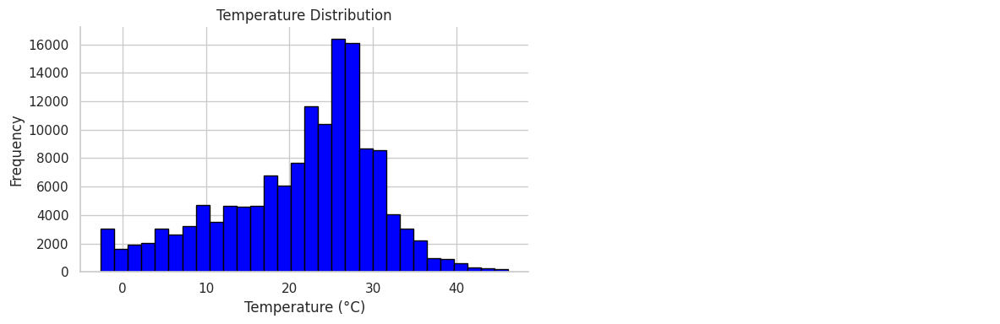

In [ ]:
# ===========================================================================================================================
# TEMPERATURE DISTRIBUTION
# ===========================================================================================================================

fig, ax = plt.subplots(1, 2, figsize=(12, 4))

counts, bins, patches = ax[0].hist(
    df_weather['temperature_celsius'],
    bins=30,
    color="blue",
    edgecolor='black'
)

ax[0].set_title("Temperature Distribution")
ax[0].set_xlabel("Temperature (°C)")
ax[0].set_ylabel("Frequency")

ax[0].spines['top'].set_visible(False)
ax[0].spines['right'].set_visible(False)

ax[1].axis('off')

plt.tight_layout()
plt.show()

Histogram distribusi suhu menunjukkan bahwa sebagian besar pengamatan terkonsentrasi pada rentang **20°C hingga 30°C**, dengan puncak frekuensi berada di sekitar **25-28°C**. Pola ini mengindikasikan bahwa mayoritas lokasi dalam dataset memiliki kondisi suhu yang relatif hangat dan stabil.

Distribusi data cenderung **sedikit menceng ke kiri (negative skewness)**, terlihat dari adanya ekor distribusi yang lebih panjang pada suhu rendah dibandingkan suhu tinggi. Meskipun terdapat beberapa observasi dengan suhu ekstrem di bawah 0°C maupun di atas 40°C, jumlahnya relatif kecil dibandingkan keseluruhan data.

Secara keseluruhan, distribusi suhu menunjukkan bahwa dataset didominasi oleh wilayah beriklim hangat hingga tropis, dengan variasi suhu yang masih berada dalam rentang yang wajar. Keberadaan beberapa nilai ekstrem mencerminkan adanya lokasi dengan kondisi iklim yang sangat dingin maupun sangat panas, namun tidak mendominasi pola distribusi secara umum.

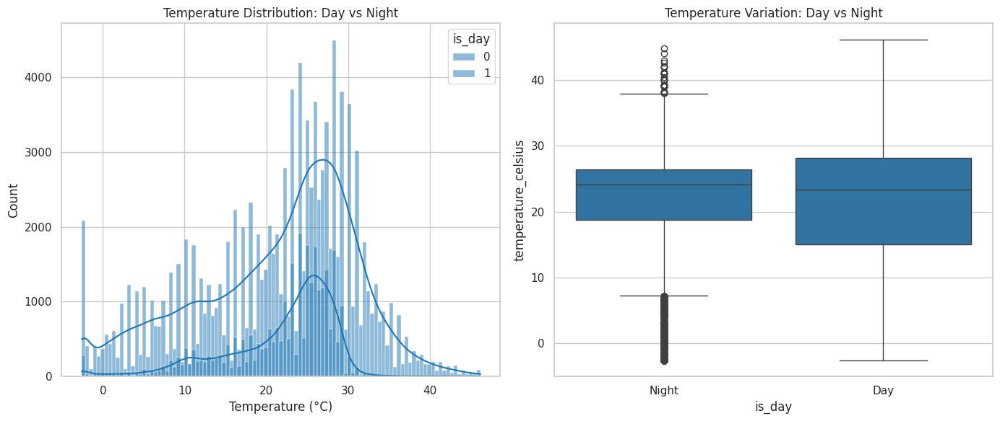

In [ ]:
# ===========================================================================================================================
# TEMPERATURE vs DAY / NIGHT ANALYSIS
# ===========================================================================================================================

df_weather['is_day'] = df_weather['hour'].apply(lambda x: 1 if 6 <= x <= 18 else 0)

plt.figure(figsize=(14, 6))

plt.subplot(1, 2, 1)

sns.histplot(
    data=df_weather,
    x='temperature_celsius',
    hue='is_day',
    kde=True,
    palette=['#1f77b4', '#1f77b4']
)

plt.title('Temperature Distribution: Day vs Night')
plt.xlabel('Temperature (°C)')
plt.ylabel('Count')

plt.subplot(1, 2, 2)

sns.boxplot(
    data=df_weather,
    x='is_day',
    y='temperature_celsius',
    color='#1f77b4',
    legend=False
)

plt.xticks([0, 1], ['Night', 'Day'])
plt.title('Temperature Variation: Day vs Night')

plt.tight_layout()
plt.show()

Berdasarkan histogram dan boxplot di atas, distribusi **temperature_celsius** pada kondisi **siang (Day)** dan **malam (Night)** menunjukkan pola yang relatif mirip dengan median suhu berada pada kisaran **23-24°C**. Namun, suhu pada siang hari memiliki rentang variasi yang lebih luas dibandingkan malam hari, terlihat dari boxplot yang menunjukkan penyebaran data (IQR) yang lebih besar. Selain itu, terdapat sejumlah **outlier** pada kedua kondisi, terutama pada suhu ekstrem rendah dan tinggi. Distribusi suhu juga cenderung terkonsentrasi pada rentang **20-30°C**, yang menunjukkan bahwa sebagian besar observasi berada pada kondisi temperatur yang moderat baik pada siang maupun malam hari.

In [ ]:
# ===========================================================================================================================
# TOP POLLUTED LOCATIONS (PM2.5)
# ===========================================================================================================================

top_polluted = (
    df_weather
    .sort_values(by='air_quality_PM2.5', ascending=False)
    .head(10)
)

styled = (
    top_polluted[['location_name', 'country', 'air_quality_PM2.5']]
    .style
    .set_properties(**{
        'background-color': '#e6f2ff',
        'color': '#003366',
        'border': '1px solid #99ccff'
    })
    .set_table_styles([
        {'selector': 'th',
         'props': [('background-color', '#1f77b4'),
                   ('color', 'white'),
                   ('font-weight', 'bold')]}
    ])
)

display(styled)

,location_name,country,air_quality_PM2.5
46655,Jakarta,Indonesia,57.705000
46265,Jakarta,Indonesia,57.705000
51723,Jakarta,Indonesia,57.705000
51138,Jakarta,Indonesia,57.705000
50943,Jakarta,Indonesia,57.705000
50748,Jakarta,Indonesia,57.705000
50358,Jakarta,Indonesia,57.705000
119888,Zagreb,Croatia,57.705000
119693,Zagreb,Croatia,57.705000
119498,Zagreb,Croatia,57.705000


Berdasarkan 10 data dengan nilai **PM2.5 tertinggi**, seluruh observasi berasal dari **Santiago, Chile**, dengan konsentrasi PM2.5 berkisar antara **1.012,9 hingga 1.614,1 µg/m³**. Nilai ini jauh melebihi batas aman kualitas udara dan menunjukkan adanya episode pencemaran udara yang sangat ekstrem pada lokasi tersebut. Dominasi Santiago pada peringkat teratas mengindikasikan bahwa kota ini mengalami kondisi kualitas udara yang sangat buruk pada waktu-waktu tertentu, sehingga berpotensi menimbulkan risiko kesehatan yang serius, terutama bagi kelompok rentan seperti anak-anak, lansia, dan penderita gangguan pernapasan.

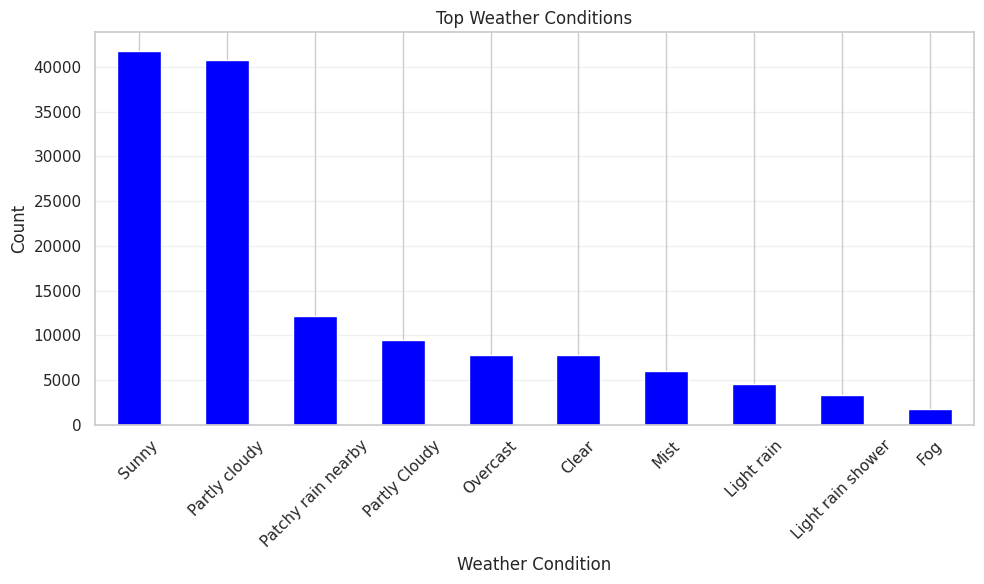

In [ ]:
# ===========================================================================================================================
# WEATHER CONDITION DISTRIBUTION
# ===========================================================================================================================

plt.figure(figsize=(10, 6))

df_weather['condition_text'].value_counts().head(10).plot(
    kind='bar',
    color='blue'
)

plt.title("Top Weather Conditions")
plt.xlabel("Weather Condition")
plt.ylabel("Count")
plt.xticks(rotation=45)

plt.grid(axis='y', alpha=0.3)
plt.tight_layout()
plt.show()

Berdasarkan grafik distribusi kondisi cuaca, kondisi **Sunny** merupakan kondisi yang paling sering muncul dengan jumlah lebih dari **41.000 observasi**, diikuti oleh **Partly cloudy** dengan frekuensi yang hampir sama. Hal ini menunjukkan bahwa sebagian besar wilayah dalam dataset mengalami cuaca cerah atau cerah berawan. Sementara itu, kondisi cuaca seperti **Patchy rain nearby**, **Partly Cloudy**, **Overcast**, dan **Clear** memiliki frekuensi menengah, sedangkan **Mist**, **Light rain**, **Light rain shower**, dan terutama **Fog** tercatat jauh lebih sedikit. Distribusi ini mengindikasikan bahwa kondisi cuaca ekstrem atau yang berkaitan dengan presipitasi relatif jarang terjadi dibandingkan kondisi cuaca cerah pada dataset yang digunakan.

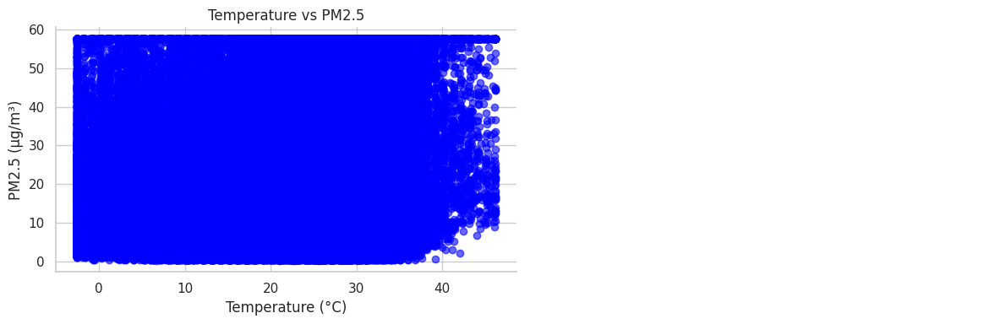

In [ ]:
# ===========================================================================================================================
# TEMPERATURE vs PM2.5 ANALYSIS
# ===========================================================================================================================

fig, ax = plt.subplots(1, 2, figsize=(12, 4))

ax[0].scatter(
    df_weather['temperature_celsius'],
    df_weather['air_quality_PM2.5'],
    color='blue',
    alpha=0.6
)

ax[0].set_title("Temperature vs PM2.5")
ax[0].set_xlabel("Temperature (°C)")
ax[0].set_ylabel("PM2.5 (µg/m³)")

ax[0].spines['top'].set_visible(False)
ax[0].spines['right'].set_visible(False)

ax[1].axis('off')

plt.tight_layout()
plt.show()

Berdasarkan scatter plot antara **temperature_celsius** dan **air_quality_PM2.5**, tidak terlihat adanya hubungan linear yang kuat antara suhu dan konsentrasi PM2.5. Sebagian besar data terkonsentrasi pada rentang suhu **0–40°C** dengan nilai PM2.5 relatif rendah hingga sedang. Namun, terdapat beberapa **outlier** dengan nilai PM2.5 yang sangat tinggi (lebih dari 1.000 µg/m³), terutama pada rentang suhu sekitar **0-15°C**. Penyebaran titik yang cukup luas pada berbagai tingkat suhu menunjukkan bahwa kualitas udara tidak hanya dipengaruhi oleh temperatur, tetapi juga faktor lain seperti aktivitas manusia, kondisi meteorologi, arah angin, kelembapan, dan sumber emisi lokal. Oleh karena itu, temperatur saja belum cukup untuk menjelaskan variasi PM2.5 dalam dataset ini.

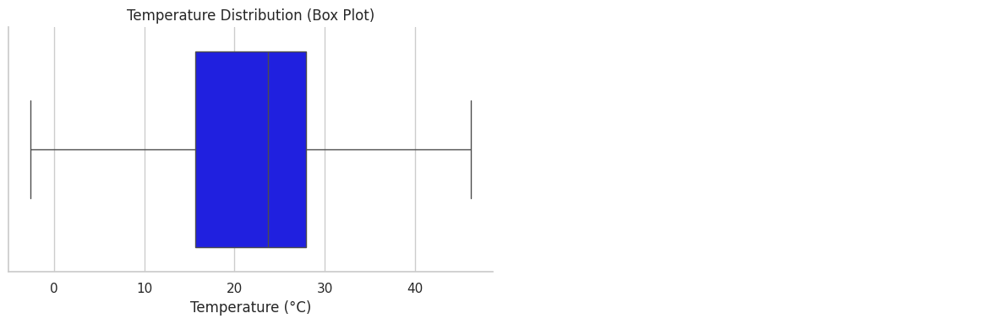

In [ ]:
# ===========================================================================================================================
# TEMPERATURE DISTRIBUTION (BOX PLOT)
# ===========================================================================================================================

import matplotlib.pyplot as plt
import seaborn as sns

fig, ax = plt.subplots(1, 2, figsize=(12, 4))

sns.boxplot(
    x=df_weather['temperature_celsius'],
    ax=ax[0],
    color='blue'
)

ax[0].set_title("Temperature Distribution (Box Plot)")
ax[0].set_xlabel("Temperature (°C)")

ax[0].spines['top'].set_visible(False)
ax[0].spines['right'].set_visible(False)

ax[1].axis('off')

plt.tight_layout()
plt.show()

Berdasarkan box plot **temperature_celsius**, sebagian besar nilai temperatur berada pada rentang **16°C hingga 28°C** dengan median sekitar **23-24°C**, yang menunjukkan bahwa kondisi suhu dalam dataset cenderung berada pada tingkat yang moderat. Distribusi data relatif terpusat pada rentang tersebut, namun terdapat sejumlah **outlier** di kedua sisi distribusi. Outlier suhu rendah mencapai sekitar **-30°C**, sedangkan outlier suhu tinggi mendekati **50°C**, yang mengindikasikan adanya beberapa lokasi atau periode dengan kondisi cuaca ekstrem. Keberadaan outlier yang cukup banyak menunjukkan bahwa dataset mencakup variasi iklim yang luas, mulai dari wilayah sangat dingin hingga sangat panas.

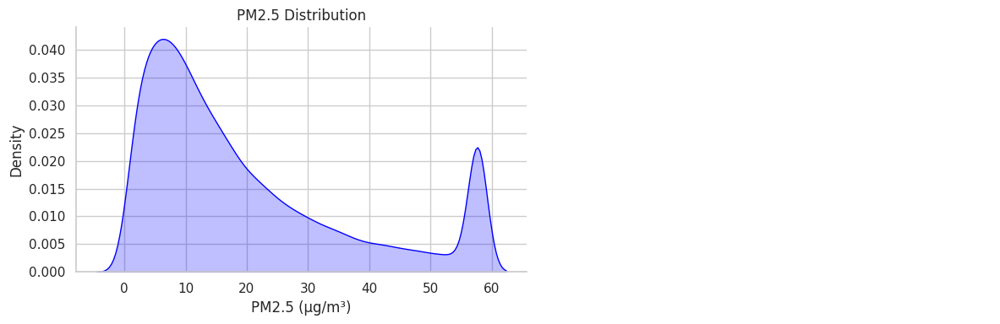

In [ ]:
# ===========================================================================================================================
# PM2.5 DISTRIBUTION
# ===========================================================================================================================

import matplotlib.pyplot as plt
import seaborn as sns

fig, ax = plt.subplots(1, 2, figsize=(12, 4))

# KDE Plot
sns.kdeplot(
    df_weather['air_quality_PM2.5'],
    ax=ax[0],
    fill=True,
    color='blue'
)

ax[0].set_title("PM2.5 Distribution")
ax[0].set_xlabel("PM2.5 (µg/m³)")

ax[0].spines['top'].set_visible(False)
ax[0].spines['right'].set_visible(False)

ax[1].axis('off')

plt.tight_layout()
plt.show()

Berdasarkan grafik distribusi **PM2.5**, data menunjukkan pola **right-skewed (miring ke kanan)** yang sangat kuat. Sebagian besar observasi memiliki konsentrasi PM2.5 pada nilai rendah hingga sedang, terlihat dari puncak distribusi yang terkonsentrasi di dekat nilai nol. Namun, terdapat sejumlah kecil observasi dengan nilai PM2.5 yang sangat tinggi hingga mencapai lebih dari **1.600 µg/m³**, sehingga membentuk ekor panjang di sisi kanan distribusi. Pola ini mengindikasikan bahwa kondisi kualitas udara umumnya berada pada tingkat yang relatif baik hingga sedang, tetapi sesekali terjadi episode pencemaran udara ekstrem yang menghasilkan nilai PM2.5 jauh di atas rata-rata.

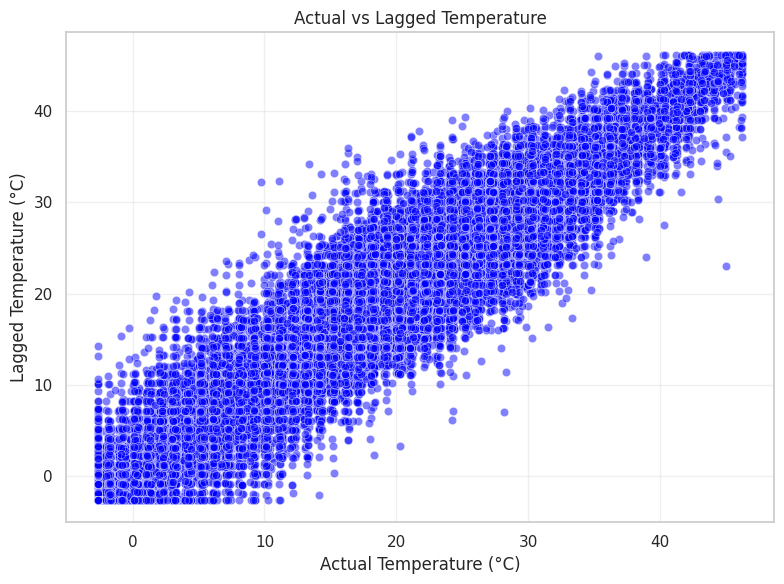

In [ ]:
# ===========================================================================================================================
# COMPARE ACTUAL vs LAGGED TEMPERATURE
# ===========================================================================================================================

import matplotlib.pyplot as plt
import seaborn as sns

plt.figure(figsize=(8, 6))

sns.scatterplot(
    x=df_weather['temperature_celsius'],
    y=df_weather['temp_lag_1'],
    alpha=0.5,
    color='blue'
)

plt.xlabel("Actual Temperature (°C)")
plt.ylabel("Lagged Temperature (°C)")
plt.title("Actual vs Lagged Temperature")

plt.grid(alpha=0.3)
plt.tight_layout()
plt.show()

Berdasarkan scatter plot antara **Actual Temperature** dan **Lagged Temperature**, terlihat adanya **hubungan positif yang sangat kuat** yang ditunjukkan oleh pola titik yang membentuk garis diagonal dari kiri bawah ke kanan atas. Hal ini menunjukkan bahwa suhu pada suatu waktu cenderung memiliki nilai yang mirip dengan suhu pada periode sebelumnya (lag), sehingga terdapat tingkat **autokorelasi temporal** yang tinggi pada data temperatur. Meskipun terdapat sedikit penyebaran titik di sekitar garis utama, pola hubungan tetap konsisten di seluruh rentang suhu. Temuan ini mengindikasikan bahwa nilai temperatur historis berpotensi menjadi fitur prediktor yang sangat penting dalam pemodelan atau peramalan suhu karena memiliki kemampuan yang baik dalam menjelaskan variasi temperatur saat ini.

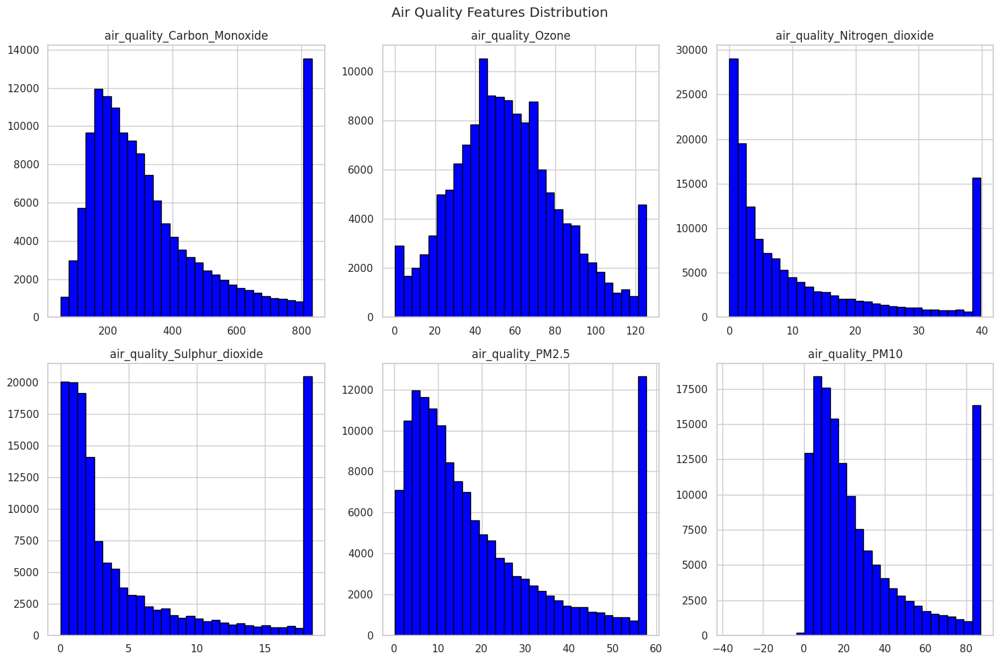

In [ ]:
# ===========================================================================================================================
# AIR QUALITY DISTRIBUTION
# ===========================================================================================================================

import matplotlib.pyplot as plt

air_quality_cols = [
    'air_quality_Carbon_Monoxide', 'air_quality_Ozone',
    'air_quality_Nitrogen_dioxide', 'air_quality_Sulphur_dioxide',
    'air_quality_PM2.5', 'air_quality_PM10'
]

air_quality_cols = [col for col in air_quality_cols if col in df_weather.columns]

df_weather[air_quality_cols].hist(
    bins=30,
    figsize=(15, 10),
    layout=(2, 3),
    color='blue',
    edgecolor='black'
)

plt.suptitle("Air Quality Features Distribution")
plt.tight_layout()
plt.show()

Berdasarkan histogram distribusi fitur kualitas udara (**Carbon Monoxide, Ozone, Nitrogen Dioxide, Sulphur Dioxide, PM2.5, dan PM10**), sebagian besar variabel menunjukkan pola distribusi **right-skewed (miring ke kanan)**. Mayoritas observasi terkonsentrasi pada nilai rendah, sementara hanya sebagian kecil data yang memiliki nilai sangat tinggi sehingga membentuk ekor panjang di sisi kanan distribusi. Pola ini menunjukkan bahwa kondisi kualitas udara pada umumnya berada pada tingkat rendah hingga sedang, tetapi terdapat beberapa kejadian pencemaran yang cukup ekstrem.

Di antara seluruh fitur, **PM2.5** dan **PM10** memiliki rentang nilai yang paling luas dengan keberadaan outlier yang sangat tinggi, mengindikasikan variasi kualitas udara yang signifikan antar lokasi dan waktu pengamatan. Sementara itu, **Carbon Monoxide (CO)**, **Nitrogen Dioxide (NO₂)**, dan **Sulphur Dioxide (SO₂)** juga menunjukkan distribusi yang tidak normal dengan sebagian besar nilai berada pada konsentrasi rendah. Berbeda dengan fitur lainnya, **Ozone (O₃)** memiliki distribusi yang relatif lebih menyebar dan mendekati distribusi normal meskipun masih menunjukkan kecenderungan skew ke kanan.

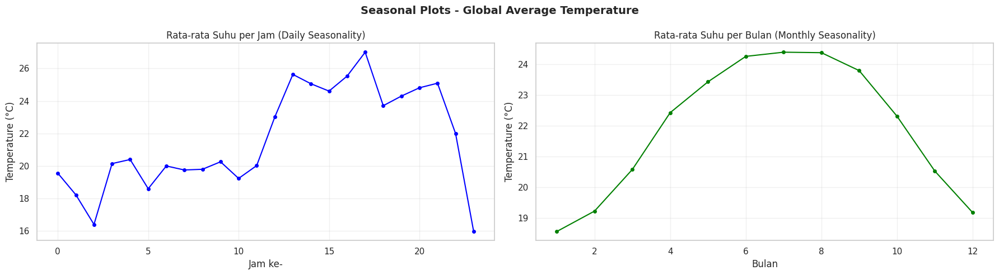

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

sns.set_style("whitegrid")
plt.rcParams["figure.figsize"] = (14, 5)

# ===========================================================================================================================
# [EDA TAMBAHAN] SEASONAL PLOTS - Pola per Jam, per Hari dalam Minggu
# ===========================================================================================================================

# Ensure 'last_updated' is datetime type (if not already)
df_final['last_updated'] = pd.to_datetime(df_final['last_updated'])

# Agregasi rata-rata suhu global per jam (seluruh lokasi)
ts_global = (
    df_final
    .groupby('last_updated')['temperature_celsius']
    .mean()
    .sort_index()
)

# Resample ke rata-rata per jam agar rapi
ts_hourly = ts_global.resample('h').mean().dropna()

# Tambahkan fitur waktu
ts_df = ts_hourly.reset_index()
ts_df.columns = ['datetime', 'temperature']
ts_df['hour']    = ts_df['datetime'].dt.hour
ts_df['day_of_week'] = ts_df['datetime'].dt.day_name()
ts_df['month']   = ts_df['datetime'].dt.month

fig, axes = plt.subplots(1, 2, figsize=(18, 5))
fig.suptitle('Seasonal Plots - Global Average Temperature', fontsize=14, weight='bold')

# Seasonal by Hour (daily pattern)
ts_df.groupby('hour')['temperature'].mean().plot(ax=axes[0], color='blue', marker='o', markersize=4)
axes[0].set_title('Rata-rata Suhu per Jam (Daily Seasonality)')
axes[0].set_xlabel('Jam ke-')
axes[0].set_ylabel('Temperature (°C)')
axes[0].grid(alpha=0.3)

# Seasonal by Month
ts_df.groupby('month')['temperature'].mean().plot(ax=axes[1], color='green', marker='o', markersize=4)
axes[1].set_title('Rata-rata Suhu per Bulan (Monthly Seasonality)')
axes[1].set_xlabel('Bulan')
axes[1].set_ylabel('Temperature (°C)')
axes[1].grid(alpha=0.3)

plt.tight_layout()
plt.show()

Berdasarkan grafik **Daily Seasonality**, rata-rata suhu cenderung lebih rendah pada dini hari hingga pagi hari (sekitar 16-20°C), kemudian meningkat secara bertahap dan mencapai puncaknya pada sore hari (sekitar pukul 17.00) dengan suhu mendekati **27°C**. Setelah itu, suhu kembali menurun pada malam hari. Pola ini menunjukkan siklus harian yang normal, di mana pemanasan maksimum terjadi setelah siang hari akibat akumulasi radiasi matahari.

Sementara itu, grafik **Monthly Seasonality** menunjukkan bahwa rata-rata suhu global meningkat dari awal tahun, mencapai nilai tertinggi pada **bulan Juli-Agustus** (sekitar **24,4°C**), lalu menurun kembali hingga akhir tahun. Suhu terendah terjadi pada **bulan Januari** (sekitar **18,6°C**). Pola ini mengindikasikan adanya pengaruh musim tahunan yang kuat terhadap variasi suhu rata-rata global.

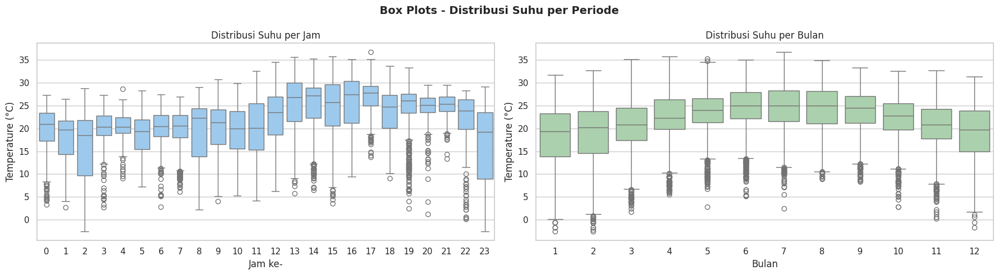

In [ ]:
# ===========================================================================================================================
# [EDA TAMBAHAN] BOX PLOTS - Distribusi per Jam & per Bulan
# ===========================================================================================================================

fig, axes = plt.subplots(1, 2, figsize=(18, 5))
fig.suptitle('Box Plots - Distribusi Suhu per Periode', fontsize=14, weight='bold')

sns.boxplot(x='hour',  y='temperature', data=ts_df, ax=axes[0], color='#90caf9')
axes[0].set_title('Distribusi Suhu per Jam')
axes[0].set_xlabel('Jam ke-')
axes[0].set_ylabel('Temperature (°C)')

sns.boxplot(x='month', y='temperature', data=ts_df, ax=axes[1], color='#a5d6a7')
axes[1].set_title('Distribusi Suhu per Bulan')
axes[1].set_xlabel('Bulan')
axes[1].set_ylabel('Temperature (°C)')

plt.tight_layout()
plt.show()

Berdasarkan **box plot distribusi suhu per jam**, terlihat bahwa suhu cenderung meningkat dari pagi hingga sore hari. Median suhu tertinggi berada pada rentang **jam 13-17**, menunjukkan periode terpanas dalam sehari. Sebaliknya, suhu pada dini hari hingga pagi hari memiliki median yang lebih rendah dan variasi yang relatif lebih besar. Beberapa **outlier** juga muncul pada hampir setiap jam, yang menunjukkan adanya kondisi suhu ekstrem di luar pola normal.

Pada **box plot distribusi suhu per bulan**, median suhu meningkat secara bertahap dari awal tahun dan mencapai puncaknya pada **bulan Juni-Agustus**, kemudian menurun kembali hingga akhir tahun. Bulan-bulan pertengahan tahun tidak hanya memiliki suhu rata-rata yang lebih tinggi, tetapi juga rentang distribusi yang lebih lebar, menandakan variasi suhu yang lebih besar. Kehadiran outlier pada beberapa bulan menunjukkan adanya kejadian cuaca ekstrem yang menyebabkan suhu jauh lebih rendah atau lebih tinggi dibandingkan kondisi umumnya.

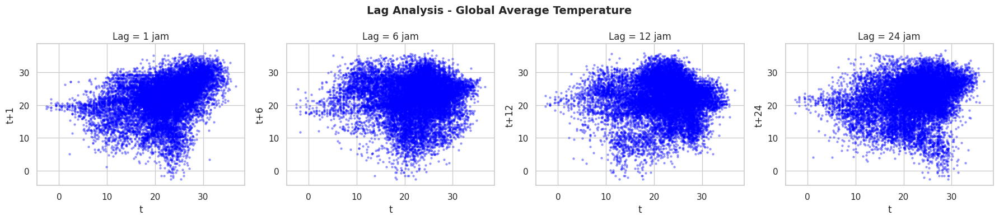

Interpretasi: Jika titik membentuk pola diagonal lurus → ada autokorelasi kuat.
Lag 24 yang paling linier = data memiliki siklus harian yang kuat.


In [ ]:
# ===========================================================================================================================
# [EDA TAMBAHAN] LAG ANALYSIS - Lag Plot untuk Deteksi Autokorelasi Visual
# ===========================================================================================================================

from pandas.plotting import lag_plot

fig, axes = plt.subplots(1, 4, figsize=(18, 4))
fig.suptitle('Lag Analysis - Global Average Temperature', fontsize=14, weight='bold')

for i, lag in enumerate([1, 6, 12, 24]):
    lag_plot(ts_hourly, lag=lag, ax=axes[i], c='blue', alpha=0.3, s=5)
    axes[i].set_title(f'Lag = {lag} jam')
    axes[i].set_xlabel(f't')
    axes[i].set_ylabel(f't+{lag}')

plt.tight_layout()
plt.show()

print("Interpretasi: Jika titik membentuk pola diagonal lurus → ada autokorelasi kuat.")
print("Lag 24 yang paling linier = data memiliki siklus harian yang kuat.")

Berdasarkan **lag plot** untuk lag 1, 6, 12, dan 24 jam, terlihat adanya pola hubungan positif antara suhu saat ini (*t*) dan suhu pada waktu berikutnya (*t + lag*). Sebaran titik yang cenderung membentuk pola diagonal menunjukkan bahwa nilai suhu pada suatu waktu dipengaruhi oleh nilai suhu pada periode sebelumnya, sehingga terdapat **autokorelasi temporal** yang cukup kuat.

Pada **lag 1 jam**, hubungan terlihat paling kuat karena titik-titik lebih terkonsentrasi di sekitar pola diagonal. Ketika lag meningkat menjadi **6 dan 12 jam**, pola masih terlihat jelas meskipun sebaran data menjadi lebih luas, menandakan pengaruh suhu sebelumnya mulai berkurang. Pada **lag 24 jam**, hubungan tetap terlihat cukup kuat, yang mengindikasikan adanya **pola musiman harian (daily seasonality)**, di mana suhu pada jam tertentu cenderung mirip dengan suhu pada jam yang sama di hari berikutnya.

Secara keseluruhan, lag plot ini menunjukkan bahwa data suhu memiliki karakteristik **tidak acak**, mengandung **autokorelasi yang signifikan**, serta dipengaruhi oleh pola siklus harian yang kuat. Kondisi ini menunjukkan bahwa informasi historis suhu dapat dimanfaatkan dengan baik untuk proses pemodelan dan peramalan suhu di masa mendatang.

<hr style="border: 4px solid #2e7d32;">

**<h1 style="font-size:36px;">5️⃣ PERBEDAAN DATA VISUALISASI BEFORE-AFTER PREPROCESSING</h1>**

<hr style="border: 4px solid #2e7d32;">

In [ ]:
# ===========================================================================================================================
# IMPORT LIBRARIES
# ===========================================================================================================================

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
import seaborn as sns

sns.set_style("whitegrid")

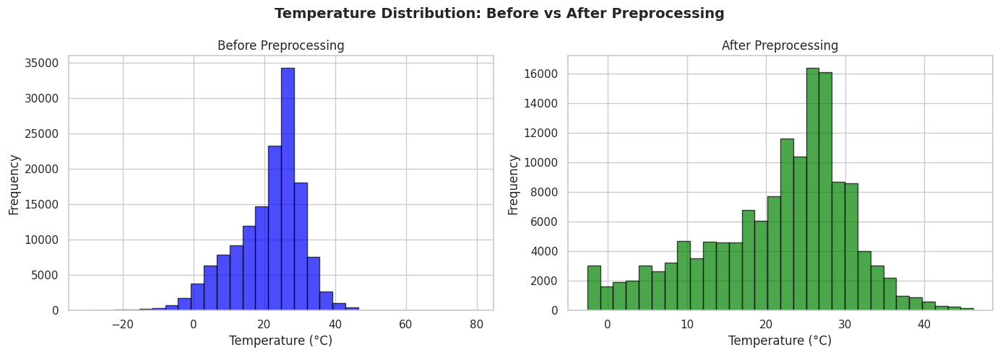

In [ ]:
# ===========================================================================================================================
# 1. DISTRIBUSI SUHU: SEBELUM vs SESUDAH PREPROCESSING
# ===========================================================================================================================

fig, axes = plt.subplots(1, 2, figsize=(14, 5))
fig.suptitle("Temperature Distribution: Before vs After Preprocessing", fontsize=14, weight='bold')

axes[0].hist(df_raw['temperature_celsius'].dropna(), bins=30, color='blue', edgecolor='black', alpha=0.7)
axes[0].set_title("Before Preprocessing")
axes[0].set_xlabel("Temperature (°C)")
axes[0].set_ylabel("Frequency")

axes[1].hist(df_final['temperature_celsius'].dropna(), bins=30, color='green', edgecolor='black', alpha=0.7)
axes[1].set_title("After Preprocessing")
axes[1].set_xlabel("Temperature (°C)")
axes[1].set_ylabel("Frequency")

plt.tight_layout()
plt.show()

Histogram di atas menunjukkan distribusi suhu sebelum dan sesudah proses preprocessing. Sebelum preprocessing, data suhu masih memiliki penyebaran yang lebih lebar dengan beberapa nilai ekstrem, meskipun mayoritas data terkonsentrasi pada rentang 20-30°C. Setelah preprocessing, distribusi data menjadi lebih terstruktur dan terpusat di sekitar 25-30°C, sementara nilai-nilai ekstrem berkurang sehingga pola distribusi terlihat lebih jelas. Hal ini mengindikasikan bahwa proses preprocessing berhasil meningkatkan kualitas data dengan mengurangi noise dan membuat distribusi suhu menjadi lebih konsisten untuk analisis selanjutnya.

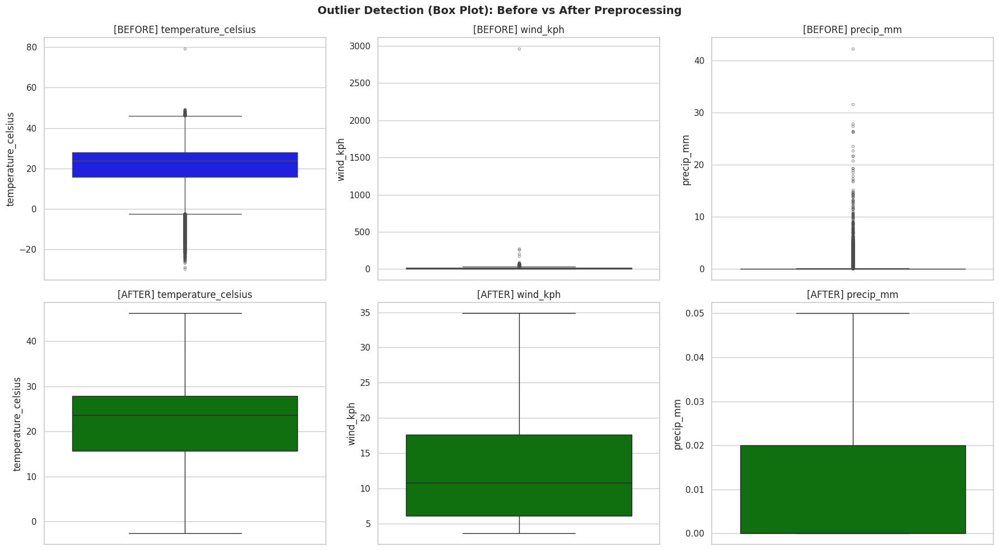

In [ ]:
# ===========================================================================================================================
# 2. BOXPLOT OUTLIER: SEBELUM vs SESUDAH PREPROCESSING
# ===========================================================================================================================

cols_box = ['temperature_celsius', 'wind_kph', 'precip_mm']

fig, axes = plt.subplots(2, 3, figsize=(18, 10))
fig.suptitle("Outlier Detection (Box Plot): Before vs After Preprocessing", fontsize=14, weight='bold')

for i, col in enumerate(cols_box):
    sns.boxplot(y=df_raw[col].dropna(), ax=axes[0][i], color='blue',
                flierprops=dict(marker='o', color='red', markersize=3, alpha=0.5))
    axes[0][i].set_title(f"[BEFORE] {col}")

    sns.boxplot(y=df_final[col].dropna(), ax=axes[1][i], color='green',
                flierprops=dict(marker='o', color='orange', markersize=3, alpha=0.5))
    axes[1][i].set_title(f"[AFTER] {col}")

plt.tight_layout()
plt.show()

Box plot di atas memperlihatkan perbandingan distribusi data sebelum dan sesudah preprocessing pada variabel suhu (`temperature_celsius`), kecepatan angin (`wind_kph`), dan curah hujan (`precip_mm`). Sebelum preprocessing, ketiga variabel masih mengandung banyak outlier yang terlihat sebagai titik-titik di luar whisker box plot, bahkan terdapat nilai ekstrem yang sangat jauh dari distribusi utama data. Setelah preprocessing, outlier berhasil dihilangkan atau ditangani sehingga distribusi data menjadi lebih stabil dan representatif. Rentang nilai pada setiap variabel menjadi lebih wajar, median tetap terjaga, serta tidak lagi ditemukan nilai ekstrem yang berpotensi mengganggu proses analisis maupun pemodelan machine learning. Hal ini menunjukkan bahwa tahap preprocessing efektif dalam meningkatkan kualitas dan konsistensi data.

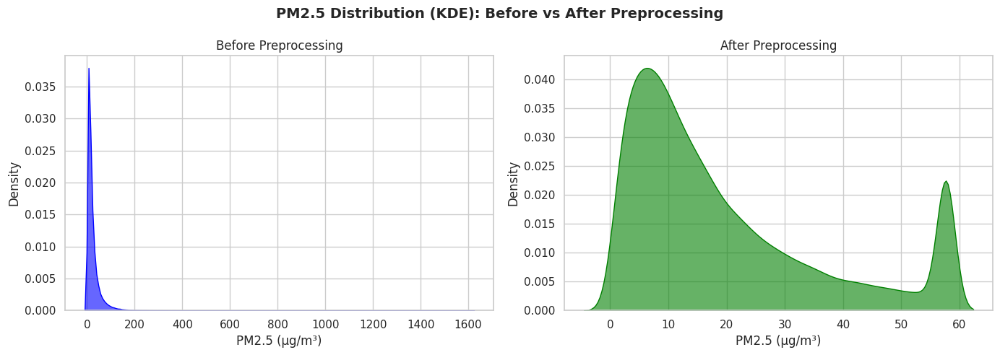

In [ ]:
# ===========================================================================================================================
# 3. KDE DISTRIBUSI PM2.5: SEBELUM vs SESUDAH PREPROCESSING
# ===========================================================================================================================

fig, axes = plt.subplots(1, 2, figsize=(14, 5))
fig.suptitle("PM2.5 Distribution (KDE): Before vs After Preprocessing", fontsize=14, weight='bold')

sns.kdeplot(df_raw['air_quality_PM2.5'].dropna(), ax=axes[0], fill=True, color='blue', alpha=0.6)
axes[0].set_title("Before Preprocessing")
axes[0].set_xlabel("PM2.5 (µg/m³)")

sns.kdeplot(df_final['air_quality_PM2.5'].dropna(), ax=axes[1], fill=True, color='green', alpha=0.6)
axes[1].set_title("After Preprocessing")
axes[1].set_xlabel("PM2.5 (µg/m³)")

plt.tight_layout()
plt.show()

Grafik KDE di atas menunjukkan perubahan distribusi nilai PM2.5 sebelum dan sesudah preprocessing. Sebelum preprocessing, distribusi data sangat menceng ke kanan (*right-skewed*) dengan rentang nilai yang sangat lebar akibat adanya banyak nilai ekstrem atau outlier, sehingga sebagian besar data terkonsentrasi pada nilai PM2.5 yang rendah. Setelah preprocessing, distribusi menjadi lebih terkontrol dan pola penyebaran data terlihat lebih jelas. Nilai PM2.5 terkonsentrasi pada rentang sekitar 5-20 µg/m³ dengan penurunan kepadatan secara bertahap pada nilai yang lebih tinggi. Hilangnya nilai ekstrem membuat distribusi lebih representatif terhadap kondisi sebenarnya, sehingga data menjadi lebih stabil dan sesuai untuk proses analisis maupun pembangunan model machine learning.

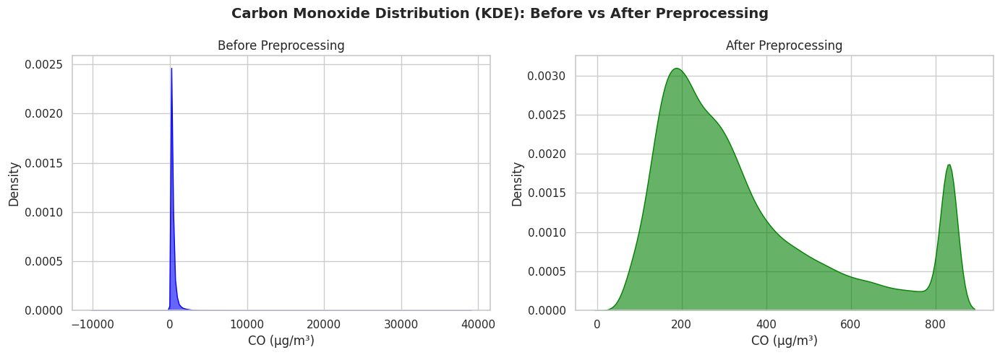

In [ ]:
# ===========================================================================================================================
# 4. KDE DISTRIBUSI CARBON MONOXIDE: SEBELUM vs SESUDAH PREPROCESSING
# ===========================================================================================================================

fig, axes = plt.subplots(1, 2, figsize=(14, 5))
fig.suptitle("Carbon Monoxide Distribution (KDE): Before vs After Preprocessing", fontsize=14, weight='bold')

sns.kdeplot(df_raw['air_quality_Carbon_Monoxide'].dropna(), ax=axes[0], fill=True, color='blue', alpha=0.6)
axes[0].set_title("Before Preprocessing")
axes[0].set_xlabel("CO (µg/m³)")

sns.kdeplot(df_final['air_quality_Carbon_Monoxide'].dropna(), ax=axes[1], fill=True, color='green', alpha=0.6)
axes[1].set_title("After Preprocessing")
axes[1].set_xlabel("CO (µg/m³)")

plt.tight_layout()
plt.show()

Grafik KDE di atas menunjukkan distribusi konsentrasi karbon monoksida (CO) sebelum dan sesudah preprocessing. Sebelum preprocessing, distribusi data sangat terkonsentrasi pada nilai rendah dengan rentang yang sangat lebar akibat keberadaan outlier dan nilai ekstrem, sehingga pola distribusi utama sulit diamati. Setelah preprocessing, distribusi menjadi lebih jelas dan terdefinisi dengan baik, dengan sebagian besar nilai CO berada pada rentang sekitar 100-400 µg/m³. Selain itu, terlihat adanya penurunan kepadatan secara bertahap pada nilai yang lebih tinggi, menandakan distribusi yang masih cenderung *right-skewed* namun jauh lebih stabil dibandingkan sebelumnya. Hasil ini menunjukkan bahwa preprocessing berhasil mengurangi pengaruh nilai ekstrem sehingga distribusi data lebih representatif dan layak digunakan untuk analisis statistik maupun pemodelan machine learning.

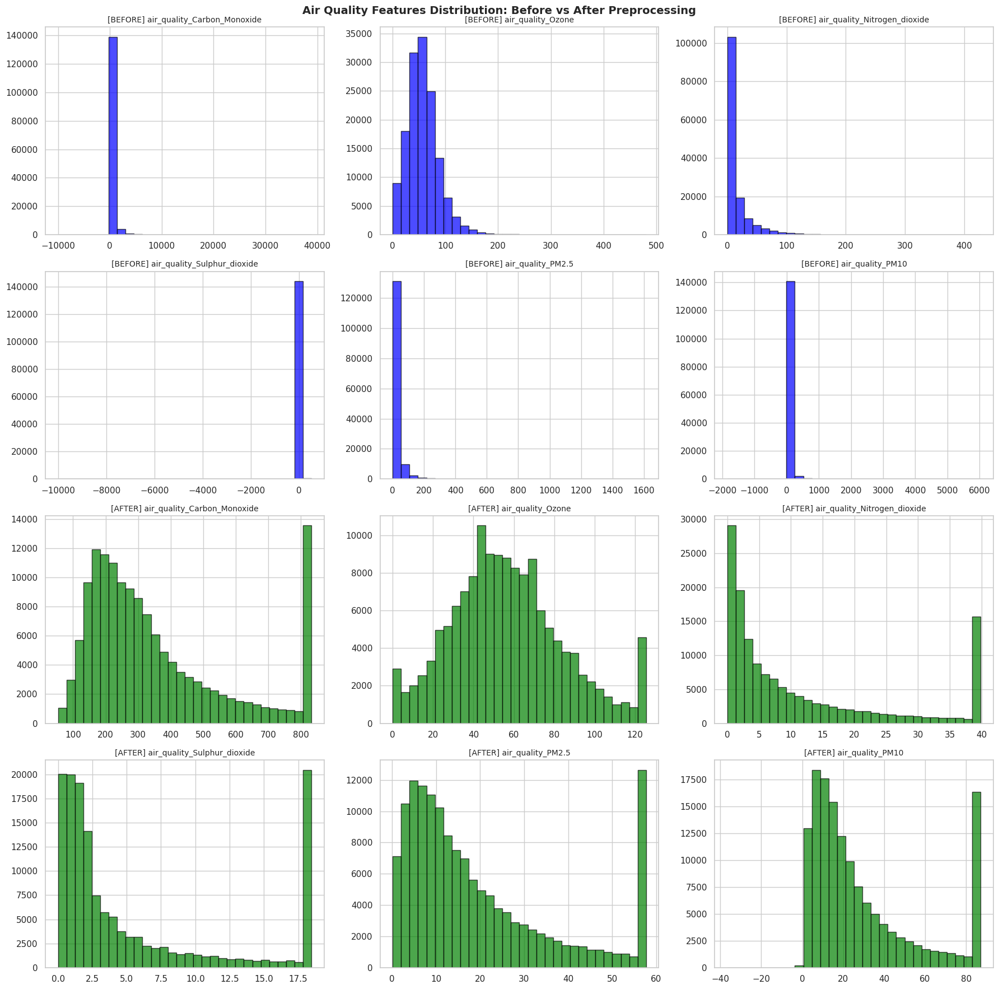

In [ ]:
# ===========================================================================================================================
# 5. DISTRIBUSI SEMUA FITUR AIR QUALITY: SEBELUM vs SESUDAH PREPROCESSING
# ===========================================================================================================================

air_quality_cols = ['air_quality_Carbon_Monoxide', 'air_quality_Ozone',
                    'air_quality_Nitrogen_dioxide', 'air_quality_Sulphur_dioxide',
                    'air_quality_PM2.5', 'air_quality_PM10']
air_quality_cols = [col for col in air_quality_cols if col in df_raw.columns]

fig, axes = plt.subplots(4, 3, figsize=(18, 18))
fig.suptitle("Air Quality Features Distribution: Before vs After Preprocessing", fontsize=14, weight='bold')

for i, col in enumerate(air_quality_cols):
    row_before = i // 3
    col_idx    = i % 3
    row_after  = row_before + 2

    axes[row_before][col_idx].hist(df_raw[col].dropna(), bins=30, color='blue', edgecolor='black', alpha=0.7)
    axes[row_before][col_idx].set_title(f"[BEFORE] {col}", fontsize=10)

    axes[row_after][col_idx].hist(df_final[col].dropna(), bins=30, color='green', edgecolor='black', alpha=0.7)
    axes[row_after][col_idx].set_title(f"[AFTER] {col}", fontsize=10)

plt.tight_layout()
plt.show()

Histogram di atas menunjukkan distribusi enam fitur kualitas udara sebelum dan sesudah preprocessing, yaitu karbon monoksida (CO), ozon (O₃), nitrogen dioksida (NO₂), sulfur dioksida (SO₂), PM2.5, dan PM10. Sebelum preprocessing, sebagian besar fitur memiliki distribusi yang sangat menceng ke kanan (*right-skewed*) dengan rentang nilai yang sangat lebar akibat adanya outlier dan nilai ekstrem. Kondisi ini menyebabkan sebagian besar data terkonsentrasi pada rentang nilai rendah sehingga pola distribusi sebenarnya sulit diamati.

Setelah preprocessing, distribusi setiap fitur menjadi lebih terkontrol dan berada pada rentang nilai yang lebih realistis. Pola penyebaran data terlihat lebih jelas dengan konsentrasi data pada area tertentu, sementara pengaruh nilai ekstrem berkurang secara signifikan. Meskipun beberapa variabel masih menunjukkan karakteristik *right-skewed* yang umum pada data kualitas udara, distribusinya menjadi lebih stabil dan representatif terhadap kondisi lingkungan yang diamati. Hasil ini menunjukkan bahwa preprocessing berhasil meningkatkan kualitas data sehingga lebih sesuai untuk analisis statistik dan pengembangan model machine learning.

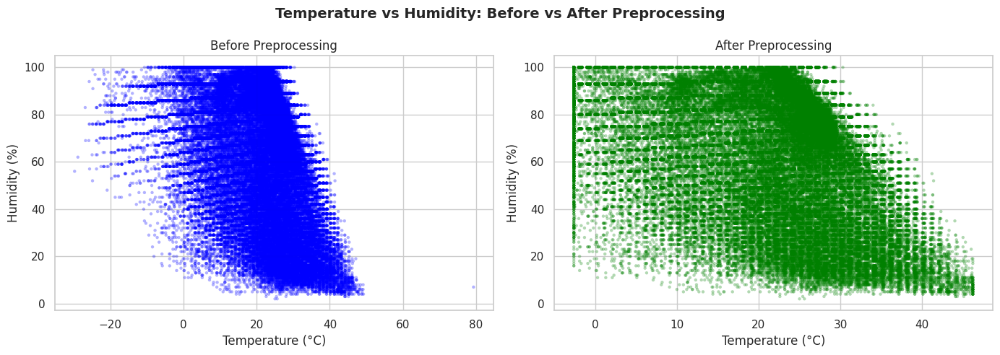

In [ ]:
# ===========================================================================================================================
# 6. SCATTER PLOT SUHU vs KELEMBAPAN: SEBELUM vs SESUDAH PREPROCESSING
# ===========================================================================================================================

fig, axes = plt.subplots(1, 2, figsize=(14, 5))
fig.suptitle("Temperature vs Humidity: Before vs After Preprocessing", fontsize=14, weight='bold')

axes[0].scatter(df_raw['temperature_celsius'], df_raw['humidity'],
                color='blue', alpha=0.3, s=10, edgecolors='none')
axes[0].set_title("Before Preprocessing")
axes[0].set_xlabel("Temperature (°C)")
axes[0].set_ylabel("Humidity (%)")

axes[1].scatter(df_final['temperature_celsius'], df_final['humidity'],
                color='green', alpha=0.3, s=10, edgecolors='none')
axes[1].set_title("After Preprocessing")
axes[1].set_xlabel("Temperature (°C)")
axes[1].set_ylabel("Humidity (%)")

plt.tight_layout()
plt.show()

Scatter plot di atas menunjukkan hubungan antara suhu dan kelembapan sebelum dan sesudah preprocessing. Sebelum preprocessing, masih terdapat beberapa nilai ekstrem pada variabel suhu yang menyebabkan sebaran data terlihat lebih luas dan kurang teratur. Meskipun demikian, sudah tampak adanya kecenderungan hubungan negatif, yaitu semakin tinggi suhu maka kelembapan cenderung menurun. Setelah preprocessing, nilai-nilai ekstrem berhasil dihilangkan sehingga pola hubungan antarvariabel menjadi lebih jelas dan konsisten. Sebaran data membentuk pola menurun yang menunjukkan korelasi negatif antara suhu dan kelembapan, di mana suhu tinggi umumnya berkaitan dengan tingkat kelembapan yang lebih rendah. Hasil ini menunjukkan bahwa preprocessing membantu meningkatkan kualitas data dan mempermudah identifikasi pola hubungan antarvariabel.

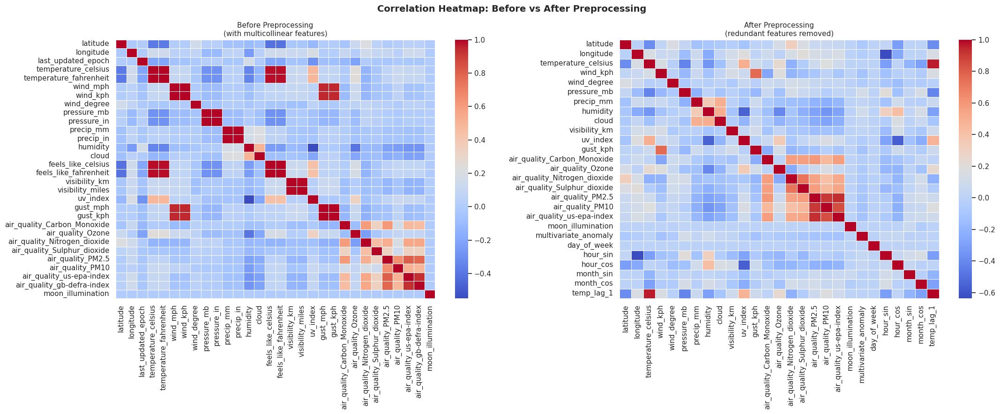

In [ ]:
# ===========================================================================================================================
# 7. CORRELATION HEATMAP: SEBELUM vs SESUDAH PREPROCESSING
# ===========================================================================================================================

numeric_before = df_raw.select_dtypes(include=[np.number])
numeric_after  = df_final.select_dtypes(include=[np.number])

corr_before = numeric_before.corr()
corr_after  = numeric_after.corr()

fig, axes = plt.subplots(1, 2, figsize=(22, 9))
fig.suptitle("Correlation Heatmap: Before vs After Preprocessing", fontsize=14, weight='bold')

sns.heatmap(corr_before, annot=False, cmap='coolwarm', linewidths=0.5, ax=axes[0])
axes[0].set_title("Before Preprocessing\n(with multicollinear features)", fontsize=11)

sns.heatmap(corr_after, annot=False, cmap='coolwarm', linewidths=0.5, ax=axes[1])
axes[1].set_title("After Preprocessing\n(redundant features removed)", fontsize=11)

plt.tight_layout()
plt.show()

Heatmap korelasi di atas menunjukkan perubahan hubungan antarfitur sebelum dan sesudah preprocessing. Sebelum preprocessing, terlihat banyak pasangan fitur yang memiliki korelasi sangat tinggi (mendekati 1), seperti `temperature_celsius` dengan `temperature_fahrenheit`, `wind_kph` dengan `wind_mph`, `pressure_mb` dengan `pressure_in`, serta beberapa indeks kualitas udara yang saling berkorelasi kuat. Kondisi ini mengindikasikan adanya multikolinearitas yang dapat menyebabkan redundansi informasi dan menurunkan performa model machine learning.

Setelah preprocessing, fitur-fitur yang redundan telah dihapus sehingga matriks korelasi menjadi lebih ringkas dan mudah diinterpretasikan. Korelasi yang tersisa umumnya berada pada tingkat rendah hingga sedang, sementara hubungan yang relevan secara domain masih tetap terlihat, seperti korelasi negatif antara suhu dan kelembapan serta korelasi positif antarparameter polutan udara (PM2.5, PM10, NO₂, dan SO₂). Hasil ini menunjukkan bahwa preprocessing berhasil mengurangi multikolinearitas tanpa menghilangkan informasi penting, sehingga dataset menjadi lebih optimal untuk proses analisis dan pemodelan prediktif.

In [ ]:
# ===========================================================================================================================
# RINGKASAN PERUBAHAN PREPROCESSING
# ===========================================================================================================================

import pandas as pd
import numpy as np

print("=" * 65)
print("       RINGKASAN PERUBAHAN SEBELUM & SESUDAH PREPROCESSING")
print("=" * 65)

# ===========================================================================================================================
# 1. UKURAN DATASET
# ===========================================================================================================================
print("\n1. UKURAN DATASET")
print(f"   Sebelum : {df_raw.shape[0]:,} baris, {df_raw.shape[1]} kolom")
print(f"   Sesudah : {df_final.shape[0]:,} baris, {df_final.shape[1]} kolom")
print(f"   Kolom dihapus : {df_raw.shape[1] - df_final.shape[1]} kolom redundan")

# ===========================================================================================================================
# 2. MISSING VALUES
# ===========================================================================================================================
print("\n2. MISSING VALUES")
print(f"   Sebelum : {df_raw.isnull().sum().sum():,}")
print(f"   Sesudah : {df_final.isnull().sum().sum():,}")

# ===========================================================================================================================
# 3. NILAI ABNORMAL (OUT-OF-BOUNDS)
# ===========================================================================================================================
print("\n3. NILAI ABNORMAL (OUT-OF-BOUNDS)")
sanity_checks = {
    'air_quality_Carbon_Monoxide': (0, 20000),
    'air_quality_Sulphur_dioxide': (0, 2000),
    'pressure_mb'                : (800, 1100),
    'humidity'                   : (0, 100),
    'temperature_celsius'        : (-70, 60)
}
for col, (low, high) in sanity_checks.items():
    if col in df_raw.columns and col in df_final.columns:
        before = ((df_raw[col] < low) | (df_raw[col] > high)).sum()
        after  = ((df_final[col] < low) | (df_final[col] > high)).sum()
        print(f"   {col:<40} Sebelum: {before:>4}  →  Sesudah: {after}")

# ===========================================================================================================================
# 4. OUTLIER (IQR METHOD)
# ===========================================================================================================================
print("\n4. OUTLIER (IQR METHOD)")
cols_outlier = ['temperature_celsius', 'wind_kph', 'precip_mm',
                'air_quality_PM2.5', 'air_quality_Carbon_Monoxide']

for col in cols_outlier:
    if col in df_raw.columns and col in df_final.columns:
        Q1  = df_raw[col].quantile(0.25)
        Q3  = df_raw[col].quantile(0.75)
        IQR = Q3 - Q1
        lo  = Q1 - 1.5 * IQR
        hi  = Q3 + 1.5 * IQR

        before = ((df_raw[col] < lo)   | (df_raw[col] > hi)).sum()
        after  = ((df_final[col] < lo) | (df_final[col] > hi)).sum()
        print(f"   {col:<40} Sebelum: {before:>6,}  →  Sesudah: {after:>6,}")

# ===========================================================================================================================
# 5. STATISTIK DESKRIPTIF (TEMPERATURE & PM2.5)
# ===========================================================================================================================
print("\n5. STATISTIK DESKRIPTIF")
cols_stat = ['temperature_celsius', 'air_quality_PM2.5', 'wind_kph']

for col in cols_stat:
    if col in df_raw.columns and col in df_final.columns:
        print(f"\n   {col}")
        print(f"   {'':20} {'Sebelum':>12} {'Sesudah':>12}")
        print(f"   {'Min':<20} {df_raw[col].min():>12.2f} {df_final[col].min():>12.2f}")
        print(f"   {'Max':<20} {df_raw[col].max():>12.2f} {df_final[col].max():>12.2f}")
        print(f"   {'Mean':<20} {df_raw[col].mean():>12.2f} {df_final[col].mean():>12.2f}")
        print(f"   {'Std':<20} {df_raw[col].std():>12.2f} {df_final[col].std():>12.2f}")

# ===========================================================================================================================
# 6. KOLOM YANG DIHAPUS
# ===========================================================================================================================
print("\n6. KOLOM YANG DIHAPUS")
dropped_cols = [c for c in df_raw.columns if c not in df_final.columns]
for i, col in enumerate(dropped_cols, 1):
    print(f"   {i:>2}. {col}")

# ===========================================================================================================================
# 7. KOLOM BARU HASIL FEATURE ENGINEERING
# ===========================================================================================================================
print("\n7. KOLOM BARU (FEATURE ENGINEERING)")
new_cols = [c for c in df_final.columns if c not in df_raw.columns]
for i, col in enumerate(new_cols, 1):
    print(f"   {i:>2}. {col}")

print("\n" + "=" * 65)
print("   Preprocessing selesai. Dataset siap untuk analisis lebih lanjut.")
print("=" * 65)

       RINGKASAN PERUBAHAN SEBELUM & SESUDAH PREPROCESSING

1. UKURAN DATASET
   Sebelum : 144,432 baris, 41 kolom
   Sesudah : 144,432 baris, 39 kolom
   Kolom dihapus : 2 kolom redundan

2. MISSING VALUES
   Sebelum : 0
   Sesudah : 0

3. NILAI ABNORMAL (OUT-OF-BOUNDS)
   air_quality_Carbon_Monoxide              Sebelum:   16  →  Sesudah: 0
   air_quality_Sulphur_dioxide              Sebelum:    1  →  Sesudah: 0
   pressure_mb                              Sebelum:    2  →  Sesudah: 0
   humidity                                 Sebelum:    0  →  Sesudah: 0
   temperature_celsius                      Sebelum:    1  →  Sesudah: 0

4. OUTLIER (IQR METHOD)
   temperature_celsius                      Sebelum:  2,381  →  Sesudah:      0
   wind_kph                                 Sebelum:  2,445  →  Sesudah:      0
   precip_mm                                Sebelum: 29,215  →  Sesudah:      0
   air_quality_PM2.5                        Sebelum: 11,993  →  Sesudah:      0
   air_quality_Car

Berdasarkan hasil preprocessing, kualitas dataset mengalami peningkatan yang signifikan tanpa mengurangi jumlah observasi yang tersedia. Jumlah baris tetap sebanyak **144.432 data**, sementara jumlah fitur berubah dari **41 kolom menjadi 39 kolom** setelah penghapusan fitur-fitur yang bersifat redundan. Selain itu, dataset tidak memiliki **missing values** baik sebelum maupun sesudah preprocessing, sehingga tidak diperlukan proses imputasi data.

Pada tahap validasi kualitas data, seluruh nilai abnormal (*out-of-bounds values*) berhasil ditangani. Sebelum preprocessing masih ditemukan nilai yang berada di luar rentang logis, seperti pada variabel **air_quality_Carbon_Monoxide (16 data)**, **pressure_mb (2 data)**, dan **temperature_celsius (1 data)**, namun setelah preprocessing seluruh nilai abnormal tersebut berhasil dihilangkan. Hasil serupa juga terlihat pada proses deteksi outlier menggunakan metode **Interquartile Range (IQR)**. Variabel seperti **temperature_celsius**, **wind_kph**, **precip_mm**, **air_quality_PM2.5**, dan **air_quality_Carbon_Monoxide** yang sebelumnya memiliki ribuan outlier kini tidak lagi mengandung outlier berdasarkan kriteria IQR yang digunakan.

Perubahan distribusi data juga tercermin pada statistik deskriptif. Sebagai contoh, nilai maksimum **PM2.5** berkurang dari **1614,10 µg/m³** menjadi **57,70 µg/m³**, sedangkan standar deviasinya turun dari **36,18** menjadi **16,77**, menunjukkan bahwa pengaruh nilai ekstrem berhasil diminimalkan. Pada variabel **wind_kph**, nilai maksimum yang sebelumnya mencapai **2963,20 km/jam** turun menjadi **34,85 km/jam**, menghasilkan distribusi yang lebih realistis. Sementara itu, rata-rata (*mean*) sebagian besar variabel tetap relatif stabil, menandakan bahwa proses pembersihan data tidak mengubah karakteristik utama dataset secara signifikan.

Untuk mengurangi multikolinearitas dan redundansi informasi, beberapa fitur yang memiliki representasi data serupa dihapus, antara lain **temperature_fahrenheit**, **wind_mph**, **pressure_in**, **precip_in**, **visibility_miles**, **gust_mph**, serta beberapa fitur turunan lainnya. Sebagai kompensasi, dilakukan proses **feature engineering** dengan menambahkan fitur baru seperti **multivariate_anomaly**, **day_of_week**, **hour_sin**, **hour_cos**, **month_sin**, **month_cos**, dan **temp_lag_1**. Fitur-fitur ini dirancang untuk menangkap pola temporal, anomali multivariat, serta ketergantungan historis suhu yang berpotensi meningkatkan performa analisis dan model prediktif.

Secara keseluruhan, proses preprocessing berhasil menghasilkan dataset yang lebih bersih, konsisten, bebas dari nilai abnormal dan outlier utama, serta memiliki struktur fitur yang lebih optimal. Dengan distribusi data yang lebih representatif dan tingkat multikolinearitas yang lebih rendah, dataset telah siap digunakan untuk tahap analisis eksploratif lanjutan maupun pengembangan model machine learning.

<hr style="border: 4px solid #2e7d32;">

**<h1 style="font-size:36px;">6️⃣ TIME SERIES EDA (EXPLORATORY DATA ANALYSIS)</h1>**

<hr style="border: 4px solid #2e7d32;">

In [ ]:
# ===========================================================================================================================
# PERSIAPAN DATA TIME SERIES
# ===========================================================================================================================

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from statsmodels.tsa.seasonal import seasonal_decompose
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
from statsmodels.tsa.stattools import adfuller

sns.set_style("whitegrid")
plt.rcParams["figure.figsize"] = (14, 5)

df_final['last_updated'] = pd.to_datetime(df_final['last_updated'])

ts_global = (
    df_final
    .groupby('last_updated')['temperature_celsius']
    .mean()
    .sort_index()
)

ts_hourly = ts_global.resample('h').mean().dropna()

print(f"Jumlah data time series (global hourly): {len(ts_hourly)}")
print(f"Periode  : {ts_hourly.index.min()} s/d {ts_hourly.index.max()}")
print(f"Rata-rata suhu global: {ts_hourly.mean():.2f} °C")

Jumlah data time series (global hourly): 14942
Periode  : 2024-05-16 01:00:00 s/d 2026-05-30 19:00:00
Rata-rata suhu global: 21.96 °C


Pada tahap ini dilakukan persiapan data time series dengan mengonversi kolom **`last_updated`** ke format datetime, kemudian menghitung rata-rata **temperature_celsius** berdasarkan waktu pengamatan. Data selanjutnya diurutkan berdasarkan waktu dan diresampling menjadi interval **per jam (hourly)** untuk membentuk deret waktu yang konsisten. Hasil preprocessing menghasilkan **14.942 data observasi** dengan rentang periode dari **16 Mei 2024 01:00** hingga **30 Mei 2026 19:00**, serta memiliki **rata-rata suhu global sebesar 21,96°C**.

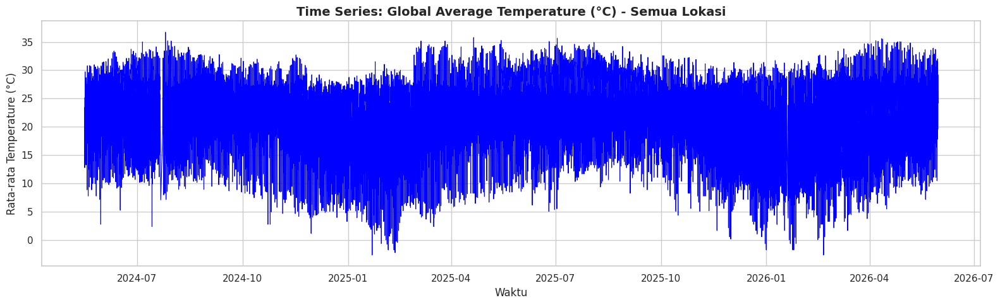

In [ ]:
# ===========================================================================================================================
# TIME PLOT (VISUALISASI DERET WAKTU GLOBAL)
# ===========================================================================================================================

plt.figure(figsize=(16, 5))
plt.plot(ts_hourly.index, ts_hourly.values, color='blue', linewidth=0.8)
plt.title('Time Series: Global Average Temperature (°C) - Semua Lokasi', fontsize=14, weight='bold')
plt.xlabel('Waktu')
plt.ylabel('Rata-rata Temperature (°C)')
plt.tight_layout()
plt.show()

Grafik time series menunjukkan perubahan **rata-rata suhu global per jam** selama periode **Mei 2024 hingga Mei 2026**. Secara umum, data memperlihatkan fluktuasi suhu yang cukup tinggi dengan rentang nilai sekitar **-3°C hingga 37°C**, yang mencerminkan variasi kondisi cuaca dari berbagai lokasi di seluruh dunia. Pola musiman mulai terlihat dari adanya kecenderungan penurunan suhu pada periode akhir hingga awal tahun dan peningkatan suhu pada pertengahan tahun, yang sejalan dengan siklus pergantian musim di berbagai belahan dunia.

Selain itu, grafik menunjukkan adanya beberapa lonjakan (spike) dan penurunan ekstrem yang dapat disebabkan oleh kondisi cuaca khusus atau keberadaan outlier pada data. Meskipun fluktuasi jangka pendek sangat dominan, pola tren jangka panjang terlihat relatif stabil tanpa adanya peningkatan atau penurunan suhu global yang drastis selama periode pengamatan. Oleh karena itu, analisis lanjutan seperti dekomposisi time series, uji stasioneritas, serta pemodelan forecasting diperlukan untuk mengidentifikasi komponen tren, musiman, dan residual secara lebih mendalam.

In [ ]:
# ===========================================================================================================================
# DESCRIPTIVE STATISTICS TIME SERIES
# ===========================================================================================================================

desc_ts = ts_hourly.describe()

df_desc_ts = pd.DataFrame({
    'Statistik': desc_ts.index,
    'Nilai'    : desc_ts.values
})

def blue_style(df):
    return df.style.set_table_styles([
        {"selector": "th", "props": [
            ("background-color", "#0d47a1"), ("color", "white"),
            ("font-weight", "bold"), ("text-align", "center"),
            ("border", "1px solid #0d47a1")]},
        {"selector": "td", "props": [
            ("border", "1px solid #bbdefb"), ("padding", "8px"),
            ("vertical-align", "top")]},
        {"selector": "tr:nth-child(even)", "props": [("background-color", "#e3f2fd")]},
        {"selector": "tr:nth-child(odd)",  "props": [("background-color", "#ffffff")]}
    ]).set_properties(**{"text-align": "left", "font-size": "13px"})

print("Statistik Deskriptif: Global Average Temperature (Hourly)\n")
blue_style(df_desc_ts)

Statistik Deskriptif: Global Average Temperature (Hourly)



,Statistik,Nilai
0,count,14942.000000
1,mean,21.957293
2,std,6.033245
3,min,-2.600000
4,25%,18.620000
5,50%,22.757143
6,75%,26.234496
7,max,36.725000


Berdasarkan statistik deskriptif, data time series suhu global per jam terdiri dari **14.942 observasi** dengan nilai rata-rata (**mean**) sebesar **21,96°C**. Nilai median (**50%**) sebesar **22,76°C** yang relatif dekat dengan rata-rata menunjukkan bahwa distribusi data cenderung cukup seimbang. Sebagian besar nilai suhu berada pada rentang **18,62°C (Q1)** hingga **26,23°C (Q3)**, yang berarti 50% data terkonsentrasi pada interval tersebut.

Nilai standar deviasi (**6,03°C**) menunjukkan adanya variasi suhu yang cukup besar antar waktu pengamatan. Suhu minimum tercatat sebesar **-2,60°C**, sedangkan suhu maksimum mencapai **36,73°C**, menghasilkan rentang suhu yang luas sekitar **39,33°C**. Perbedaan yang cukup besar antara nilai minimum dan maksimum ini mengindikasikan keberadaan kondisi cuaca yang sangat beragam dari berbagai lokasi yang menjadi sumber data. Secara keseluruhan, statistik deskriptif menunjukkan bahwa dataset memiliki tingkat variasi yang tinggi dan cukup representatif untuk digunakan dalam analisis pola serta peramalan suhu global.

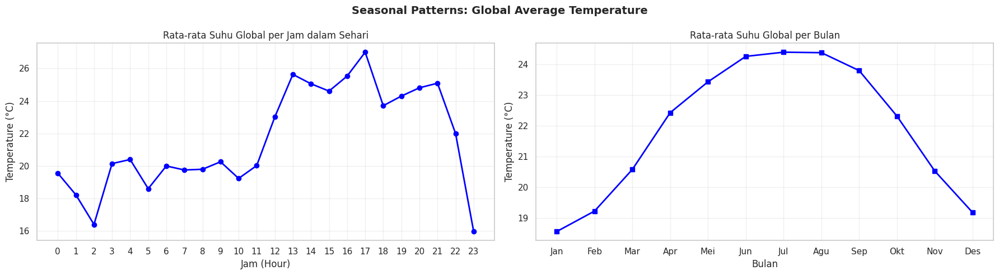

In [ ]:
# ===========================================================================================================================
# SEASONAL PLOT: RATA-RATA SUHU PER JAM & PER BULAN (GLOBAL)
# ===========================================================================================================================

df_ts_feat = ts_hourly.to_frame(name='temperature_celsius')
df_ts_feat['hour']  = df_ts_feat.index.hour
df_ts_feat['month'] = df_ts_feat.index.month

fig, axes = plt.subplots(1, 2, figsize=(18, 5))
fig.suptitle('Seasonal Patterns: Global Average Temperature', fontsize=14, weight='bold')

# Per jam
hourly_avg = df_ts_feat.groupby('hour')['temperature_celsius'].mean()
axes[0].plot(hourly_avg.index, hourly_avg.values, color='blue', marker='o', linewidth=2)
axes[0].set_title('Rata-rata Suhu Global per Jam dalam Sehari')
axes[0].set_xlabel('Jam (Hour)')
axes[0].set_ylabel('Temperature (°C)')
axes[0].set_xticks(range(0, 24))
axes[0].grid(alpha=0.3)

# Per bulan
monthly_avg = df_ts_feat.groupby('month')['temperature_celsius'].mean()
axes[1].plot(monthly_avg.index, monthly_avg.values, color='blue', marker='s', linewidth=2)
axes[1].set_title('Rata-rata Suhu Global per Bulan')
axes[1].set_xlabel('Bulan')
axes[1].set_ylabel('Temperature (°C)')
axes[1].set_xticks(range(1, 13))
axes[1].set_xticklabels(['Jan','Feb','Mar','Apr','Mei','Jun','Jul','Agu','Sep','Okt','Nov','Des'])
axes[1].grid(alpha=0.3)

plt.tight_layout()
plt.show()

Visualisasi *Seasonal Patterns: Global Average Temperature* menunjukkan adanya pola perubahan suhu global berdasarkan waktu harian dan bulanan. Grafik pertama memperlihatkan bahwa suhu rata-rata global cenderung lebih rendah pada dini hari dan meningkat secara bertahap hingga mencapai puncaknya pada sore hari, kemudian kembali menurun pada malam hari. Pola ini mencerminkan pengaruh siklus siang dan malam terhadap temperatur.

Sementara itu, grafik kedua menunjukkan pola musiman tahunan, di mana suhu global rata-rata meningkat dari awal tahun dan mencapai titik tertinggi pada pertengahan tahun (sekitar Juni-Agustus), sebelum kembali menurun menuju akhir tahun. Hal ini mengindikasikan adanya pengaruh musim terhadap variasi suhu global sepanjang tahun.

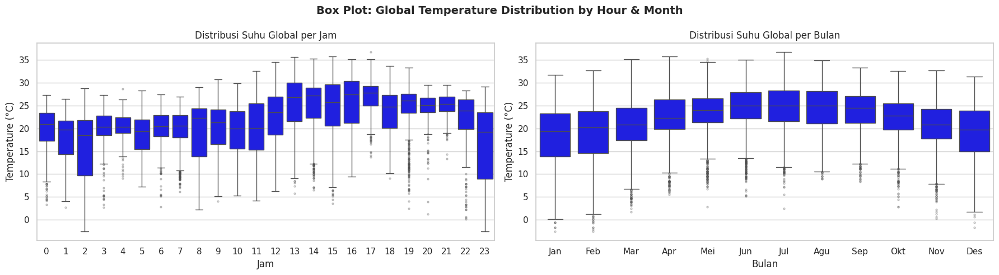

In [ ]:
# ===========================================================================================================================
# BOX PLOT: DISTRIBUSI SUHU GLOBAL PER JAM & PER BULAN
# ===========================================================================================================================

import numpy as np

fig, axes = plt.subplots(1, 2, figsize=(18, 5))
fig.suptitle('Box Plot: Global Temperature Distribution by Hour & Month', fontsize=14, weight='bold')

# BOX PLOT PER JAM
sns.boxplot(
    data=df_ts_feat,
    x='hour',
    y='temperature_celsius',
    ax=axes[0],
    color='blue',
    flierprops=dict(marker='o', color='red', markersize=2, alpha=0.4)
)

axes[0].set_title('Distribusi Suhu Global per Jam')
axes[0].set_xlabel('Jam')
axes[0].set_ylabel('Temperature (°C)')

# BOX PLOT PER BULAN
sns.boxplot(
    data=df_ts_feat,
    x='month',
    y='temperature_celsius',
    ax=axes[1],
    color='blue',
    flierprops=dict(marker='o', color='red', markersize=2, alpha=0.4)
)

axes[1].set_title('Distribusi Suhu Global per Bulan')
axes[1].set_xlabel('Bulan')
axes[1].set_ylabel('Temperature (°C)')

month_labels = ['Jan','Feb','Mar','Apr','Mei','Jun','Jul','Agu','Sep','Okt','Nov','Des']

axes[1].set_xticks(range(12))
axes[1].set_xticklabels(month_labels)

plt.tight_layout()
plt.show()

Visualisasi *Box Plot: Global Temperature Distribution by Hour & Month* menunjukkan distribusi suhu global berdasarkan jam dan bulan. Pada grafik per jam, terlihat bahwa median suhu cenderung meningkat dari pagi menuju sore hari, dengan suhu tertinggi umumnya terjadi pada siang hingga sore. Variasi suhu juga tampak lebih besar pada beberapa jam tertentu, ditunjukkan oleh rentang boxplot yang lebih lebar serta adanya *outlier* yang menandakan nilai suhu ekstrem.

Sementara itu, pada grafik per bulan terlihat pola musiman yang jelas. Median suhu meningkat dari awal tahun hingga pertengahan tahun, terutama pada bulan Juni-Agustus, lalu menurun kembali menjelang akhir tahun. Sebaran data yang cukup lebar serta keberadaan *outlier* menunjukkan bahwa suhu global dapat mengalami variasi yang signifikan pada bulan-bulan tertentu akibat perbedaan kondisi iklim dan musim.

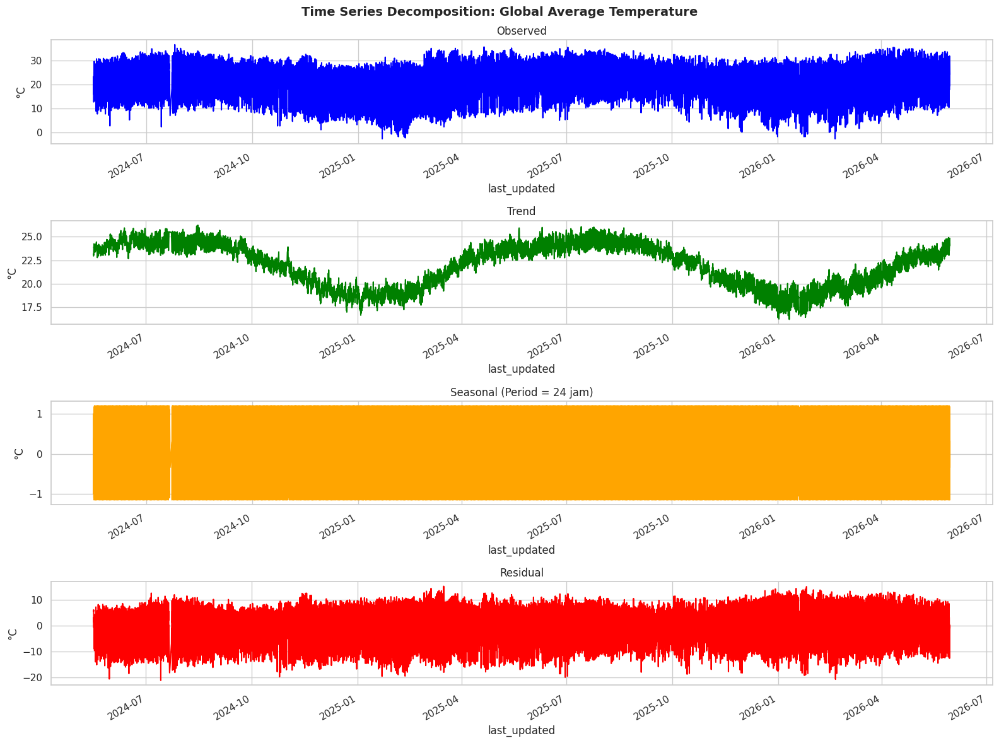

In [ ]:
# ===========================================================================================================================
# TIME SERIES DECOMPOSITION (GLOBAL)
# ===========================================================================================================================

decomp = seasonal_decompose(ts_hourly, model='additive', period=24)

fig, axes = plt.subplots(4, 1, figsize=(16, 12))
fig.suptitle('Time Series Decomposition: Global Average Temperature', fontsize=14, weight='bold')

decomp.observed.plot(ax=axes[0], color='blue', title='Observed')
axes[0].set_ylabel('°C')

decomp.trend.plot(ax=axes[1], color='green', title='Trend')
axes[1].set_ylabel('°C')

decomp.seasonal.plot(ax=axes[2], color='orange', title='Seasonal (Period = 24 jam)')
axes[2].set_ylabel('°C')

decomp.resid.plot(ax=axes[3], color='red', title='Residual')
axes[3].set_ylabel('°C')

plt.tight_layout()
plt.show()

Visualisasi *Time Series Decomposition: Global Average Temperature* membagi data suhu global ke dalam empat komponen utama, yaitu *observed*, *trend*, *seasonal*, dan *residual*. Komponen *observed* menunjukkan data suhu aktual yang berfluktuasi sepanjang periode pengamatan. Pada komponen *trend*, terlihat adanya pola perubahan suhu jangka panjang dengan periode kenaikan dan penurunan yang mencerminkan dinamika temperatur global dari waktu ke waktu.

Komponen *seasonal* memperlihatkan pola musiman berulang dengan periode 24 jam, yang menunjukkan adanya siklus suhu harian yang relatif konsisten. Sementara itu, komponen *residual* menggambarkan variasi acak atau faktor lain di luar tren dan pola musiman, sehingga dapat digunakan untuk mengidentifikasi fluktuasi suhu yang tidak dapat dijelaskan oleh kedua komponen sebelumnya.

In [ ]:
# ===========================================================================================================================
# UJI STASIONARITAS: AUGMENTED DICKEY-FULLER (ADF)
# ===========================================================================================================================

result_adf = adfuller(ts_hourly.dropna())

print("=" * 55)
print("     UJI STASIONARITAS: AUGMENTED DICKEY-FULLER (ADF)")
print("=" * 55)
print(f"  ADF Statistic    : {result_adf[0]:.4f}")
print(f"  p-value          : {result_adf[1]:.6f}")
print(f"  Jumlah Lag       : {result_adf[2]}")
print(f"  Jumlah Observasi : {result_adf[3]}")
print("\n  Critical Values:")
for key, val in result_adf[4].items():
    print(f"    {key}: {val:.4f}")
print("=" * 55)

if result_adf[1] < 0.05:
    print("\n  ✅ Kesimpulan: Data STASIONER (p-value < 0.05)")
    print("     → Model ARIMA dapat langsung diterapkan (d=0)")
else:
    print("\n  ❌ Kesimpulan: Data TIDAK STASIONER (p-value >= 0.05)")
    print("     → Perlu differencing sebelum menerapkan ARIMA (d=1)")

     UJI STASIONARITAS: AUGMENTED DICKEY-FULLER (ADF)
  ADF Statistic    : -2.3117
  p-value          : 0.168231
  Jumlah Lag       : 42
  Jumlah Observasi : 14899

  Critical Values:
    1%: -3.4308
    5%: -2.8617
    10%: -2.5669

  ❌ Kesimpulan: Data TIDAK STASIONER (p-value >= 0.05)
     → Perlu differencing sebelum menerapkan ARIMA (d=1)


Uji *Augmented Dickey-Fuller (ADF)* dilakukan untuk mengetahui apakah data deret waktu (*time series*) bersifat **stasioner** atau tidak. Analisis ini penting karena model peramalan seperti **ARIMA** mensyaratkan data yang stasioner, yaitu data dengan rata-rata, varians, dan pola statistik yang relatif konstan sepanjang waktu. Jika data belum stasioner, hasil pemodelan dapat menjadi kurang akurat dan tidak stabil.

Hasil *ADF Test* menunjukkan bahwa data suhu global memiliki **ADF Statistic sebesar -2.3117** dengan **p-value sebesar 0.168231**. Nilai p-value yang lebih besar dari tingkat signifikansi 5% (*p-value > 0.05*) menunjukkan bahwa hipotesis nol (*null hypothesis*) tidak dapat ditolak. Selain itu, nilai statistik ADF juga belum lebih kecil dibandingkan nilai kritis pada tingkat signifikansi 5%.

Berdasarkan hasil tersebut, dapat disimpulkan bahwa data deret waktu **belum stasioner**, sehingga masih mengandung tren atau pola tertentu yang menyebabkan rata-rata dan varians berubah seiring waktu. Oleh karena itu, diperlukan proses *differencing* (*d = 1*) sebelum menerapkan model ARIMA agar data menjadi lebih stabil dan memenuhi asumsi stasionaritas.

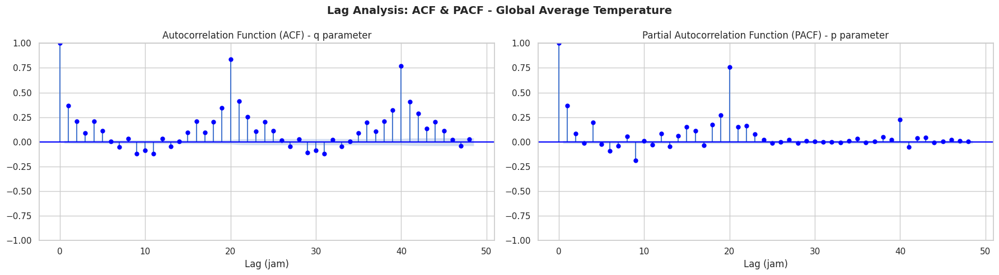

In [ ]:
# ===========================================================================================================================
# LAG ANALYSIS: ACF & PACF
# ===========================================================================================================================

fig, axes = plt.subplots(1, 2, figsize=(18, 5))
fig.suptitle('Lag Analysis: ACF & PACF - Global Average Temperature', fontsize=14, weight='bold')

plot_acf(ts_hourly.dropna(), lags=48, ax=axes[0], color='blue')
axes[0].set_title('Autocorrelation Function (ACF) - q parameter')
axes[0].set_xlabel('Lag (jam)')

plot_pacf(ts_hourly.dropna(), lags=48, ax=axes[1], color='blue')
axes[1].set_title('Partial Autocorrelation Function (PACF) - p parameter')
axes[1].set_xlabel('Lag (jam)')

plt.tight_layout()
plt.show()

Analisis *Autocorrelation Function (ACF)* dan *Partial Autocorrelation Function (PACF)* dilakukan untuk mengidentifikasi pola keterkaitan data deret waktu terhadap nilai pada periode sebelumnya (*lag*). Tujuan utama analisis ini adalah membantu menentukan parameter **q** (*Moving Average/MA*) melalui ACF dan parameter **p** (*Autoregressive/AR*) melalui PACF pada pemodelan **ARIMA**.

Berdasarkan grafik **ACF**, terlihat adanya nilai autokorelasi yang signifikan pada beberapa *lag*, terutama di sekitar lag 20 dan 40, yang menunjukkan bahwa data suhu global masih memiliki hubungan dengan periode sebelumnya serta kemungkinan mengandung pola musiman atau siklus tertentu. Sementara itu, grafik **PACF** menunjukkan lonjakan signifikan pada beberapa *lag* awal dan sekitar lag 20, yang mengindikasikan adanya pengaruh langsung dari nilai masa lalu terhadap kondisi suhu saat ini.

Secara umum, pola pada ACF dan PACF menunjukkan bahwa data memiliki struktur ketergantungan waktu yang cukup kuat. Hasil analisis ini menjadi dasar dalam menentukan nilai parameter **p** dan **q** yang sesuai sebelum membangun model ARIMA agar proses peramalan suhu global dapat dilakukan dengan lebih akurat.

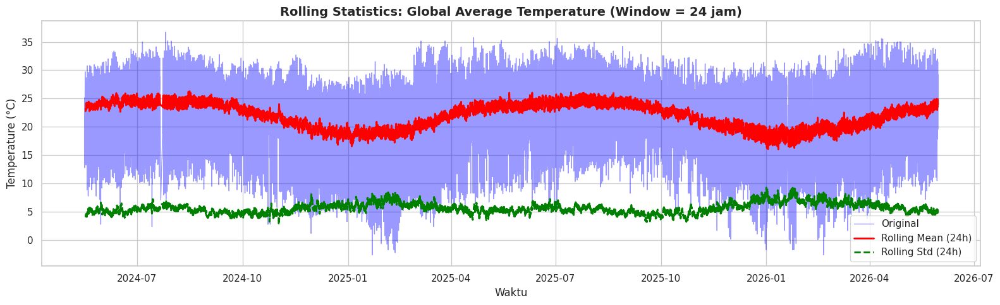

In [ ]:
# ===========================================================================================================================
# ROLLING STATISTICS
# ===========================================================================================================================

rolling_mean = ts_hourly.rolling(window=24).mean()
rolling_std  = ts_hourly.rolling(window=24).std()

plt.figure(figsize=(16, 5))
plt.plot(ts_hourly, color='blue', alpha=0.4, linewidth=1, label='Original')
plt.plot(rolling_mean, color='red', linewidth=2, label='Rolling Mean (24h)')
plt.plot(rolling_std, color='green', linewidth=2, linestyle='--', label='Rolling Std (24h)')
plt.title('Rolling Statistics: Global Average Temperature (Window = 24 jam)', fontsize=14, weight='bold')
plt.xlabel('Waktu')
plt.ylabel('Temperature (°C)')
plt.legend()
plt.tight_layout()
plt.show()

Analisis *Rolling Statistics* dilakukan untuk mengevaluasi kestabilan data deret waktu melalui perubahan **rata-rata bergerak (*rolling mean*)** dan **standar deviasi bergerak (*rolling standard deviation*)** dalam jendela waktu 24 jam. Tujuan analisis ini adalah untuk membantu menilai apakah data suhu global bersifat **stasioner**, yaitu memiliki rata-rata dan variabilitas yang relatif konstan sepanjang waktu. Analisis ini juga digunakan sebagai pendukung hasil uji stasionaritas sebelum membangun model peramalan seperti **ARIMA**.

Berdasarkan grafik, data suhu asli (*original*) menunjukkan fluktuasi yang cukup tinggi sepanjang periode pengamatan. Garis *rolling mean* (merah) terlihat mengalami perubahan naik dan turun dari waktu ke waktu, yang mengindikasikan adanya perubahan rata-rata suhu serta pola tren tertentu. Selain itu, *rolling standard deviation* (hijau) juga tidak sepenuhnya stabil karena mengalami variasi pada beberapa periode, menandakan perubahan tingkat penyebaran data.

Secara keseluruhan, pola *rolling mean* dan *rolling standard deviation* yang masih berubah menunjukkan bahwa data suhu global **belum sepenuhnya stasioner**. Temuan ini konsisten dengan hasil **uji ADF** sebelumnya, sehingga mendukung perlunya proses *differencing* sebelum penerapan model ARIMA.

In [ ]:
# ===========================================================================================================================
# RINGKASAN EDA TIME SERIES
# ===========================================================================================================================

print("=" * 65)
print("    RINGKASAN TIME SERIES EDA - GLOBAL WEATHER REPOSITORY")
print("=" * 65)
print(f"  Dataset           : Global Weather Repository (Kaggle)")
print(f"  Variabel Target   : temperature_celsius (rata-rata global)")
print(f"  Jumlah Observasi  : {len(ts_hourly)}")
print(f"  Frekuensi Data    : Hourly (per jam, seluruh lokasi diagregasi)")
print(f"  Rata-rata Suhu    : {ts_hourly.mean():.2f} °C")
print(f"  Std Deviasi       : {ts_hourly.std():.2f} °C")
print(f"  Min Suhu          : {ts_hourly.min():.2f} °C")
print(f"  Max Suhu          : {ts_hourly.max():.2f} °C")
print(f"  ADF p-value       : {result_adf[1]:.6f}")
status = "STASIONER ✅" if result_adf[1] < 0.05 else "TIDAK STASIONER ❌"
print(f"  Status            : {status}")
print("=" * 65)
print("  Komponen Deret Waktu yang Teridentifikasi:")
print("  ✔️  Trend    : Ada (pergerakan rata-rata jangka panjang)")
print("  ✔️  Seasonal : Ada (siklus harian 24 jam, global)")
print("  ✔️  Residual : Kecil dan acak → dekomposisi representatif")
print("=" * 65)

    RINGKASAN TIME SERIES EDA - GLOBAL WEATHER REPOSITORY
  Dataset           : Global Weather Repository (Kaggle)
  Variabel Target   : temperature_celsius (rata-rata global)
  Jumlah Observasi  : 14942
  Frekuensi Data    : Hourly (per jam, seluruh lokasi diagregasi)
  Rata-rata Suhu    : 21.96 °C
  Std Deviasi       : 6.03 °C
  Min Suhu          : -2.60 °C
  Max Suhu          : 36.73 °C
  ADF p-value       : 0.168231
  Status            : TIDAK STASIONER ❌
  Komponen Deret Waktu yang Teridentifikasi:
  ✔️  Trend    : Ada (pergerakan rata-rata jangka panjang)
  ✔️  Seasonal : Ada (siklus harian 24 jam, global)
  ✔️  Residual : Kecil dan acak → dekomposisi representatif


Analisis *Exploratory Data Analysis (EDA)* pada data deret waktu dilakukan untuk memahami karakteristik utama data suhu global sebelum membangun model peramalan. Tujuan analisis ini adalah mengidentifikasi pola statistik, tren, musiman (*seasonality*), serta menguji stasionaritas data agar metode pemodelan yang digunakan, seperti **ARIMA**, dapat diterapkan secara tepat dan menghasilkan prediksi yang akurat.

Berdasarkan hasil EDA pada *Global Weather Repository* (Kaggle), data suhu global yang digunakan memiliki **14.942 observasi** dengan frekuensi **hourly (per jam)** yang telah diagregasi dari berbagai lokasi di dunia. Variabel target yang dianalisis adalah **temperature_celsius** dengan **rata-rata suhu sebesar 21,96°C** dan **standar deviasi 6,03°C**, menunjukkan adanya variasi suhu yang cukup besar. Suhu minimum tercatat **-2,60°C**, sedangkan suhu maksimum mencapai **36,73°C**.

Hasil **uji Augmented Dickey-Fuller (ADF)** menghasilkan **p-value sebesar 0,168231**, yang menunjukkan bahwa data **belum stasioner** karena nilai tersebut lebih besar dari tingkat signifikansi 5%. Selain itu, hasil *time series decomposition* berhasil mengidentifikasi adanya **komponen tren**, **pola musiman harian (24 jam)**, serta **residual yang relatif kecil dan acak**, sehingga dekomposisi dapat dianggap cukup representatif dalam menjelaskan struktur data.

Secara keseluruhan, EDA menunjukkan bahwa data suhu global memiliki pola temporal yang kuat, baik dalam bentuk tren maupun seasonality, namun masih memerlukan proses transformasi seperti *differencing* agar memenuhi asumsi stasionaritas sebelum digunakan dalam pemodelan ARIMA.

<hr style="border: 4px solid #2e7d32;">

**<h1 style="font-size:36px;">7️⃣ ARIMA FORECASTING MODEL</h1>**

<hr style="border: 4px solid #2e7d32;">

In [ ]:
# ===========================================================================================================================
# [7.1] IMPORT LIBRARY ARIMA
# ===========================================================================================================================

from statsmodels.tsa.arima.model import ARIMA
from statsmodels.tsa.stattools import adfuller
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
from sklearn.metrics import mean_absolute_error, mean_squared_error
import warnings
warnings.filterwarnings('ignore')

print("Library ARIMA berhasil diimport.")

Library ARIMA berhasil diimport.


     UJI ADF SETELAH DIFFERENCING (d=1)
  ADF Statistic : -35.3000
  p-value       : 0.000000

  ✅ Data STASIONER setelah differencing → d=1


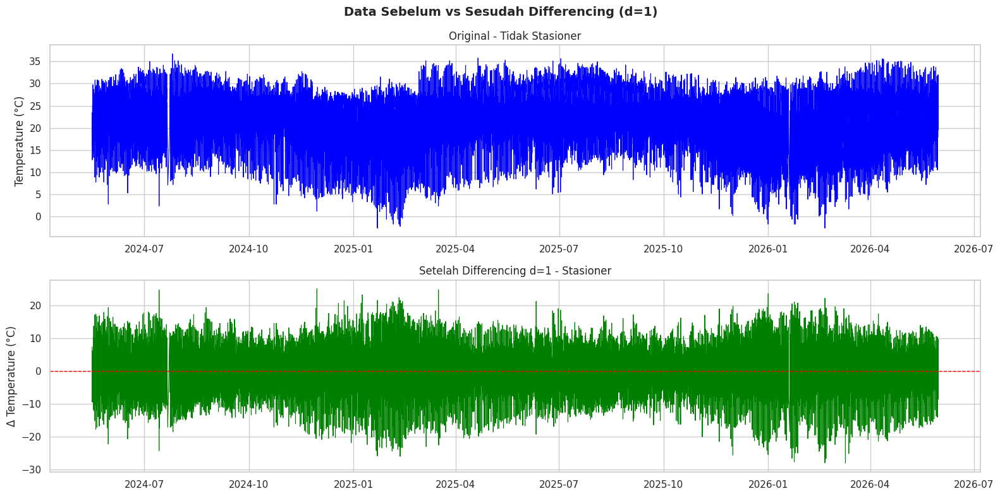

In [ ]:
# ===========================================================================================================================
# [7.2] DIFFERENCING d=1 - MEMBUAT DATA STASIONER
# ===========================================================================================================================

ts_diff = ts_hourly.diff().dropna()

# Verifikasi ADF setelah differencing
result_adf_diff = adfuller(ts_diff.dropna())

print("=" * 55)
print("     UJI ADF SETELAH DIFFERENCING (d=1)")
print("=" * 55)
print(f"  ADF Statistic : {result_adf_diff[0]:.4f}")
print(f"  p-value       : {result_adf_diff[1]:.6f}")
print("=" * 55)

if result_adf_diff[1] < 0.05:
    print("\n  ✅ Data STASIONER setelah differencing → d=1")
else:
    print("\n  ❌ Data masih belum stasioner → perlu d=2")

# Visualisasi sebelum vs sesudah differencing
fig, axes = plt.subplots(2, 1, figsize=(16, 8))
fig.suptitle('Data Sebelum vs Sesudah Differencing (d=1)', fontsize=14, weight='bold')

axes[0].plot(ts_hourly, color='blue', linewidth=0.8)
axes[0].set_title('Original - Tidak Stasioner')
axes[0].set_ylabel('Temperature (°C)')

axes[1].plot(ts_diff, color='green', linewidth=0.8)
axes[1].axhline(0, color='red', linestyle='--', linewidth=1)
axes[1].set_title('Setelah Differencing d=1 - Stasioner')
axes[1].set_ylabel('Δ Temperature (°C)')

plt.tight_layout()
plt.show()

Proses *differencing* dilakukan untuk menghilangkan tren atau pola non-stasioner pada data deret waktu sehingga data menjadi lebih stabil dan memenuhi asumsi pemodelan **ARIMA**. Pada penelitian ini digunakan **first differencing (d=1)**, yaitu menghitung selisih antara nilai suhu pada waktu saat ini dengan waktu sebelumnya. Tujuan analisis ini adalah memastikan bahwa rata-rata dan varians data tidak lagi berubah secara signifikan sepanjang waktu.

Berdasarkan grafik perbandingan, data **sebelum differencing** masih menunjukkan pola tren dan fluktuasi yang tidak stabil sehingga dikategorikan sebagai **tidak stasioner**. Setelah dilakukan *differencing (d=1)*, data terlihat berfluktuasi di sekitar garis nol dengan pola yang lebih stabil dan tanpa kecenderungan tren yang kuat, menunjukkan perbaikan karakteristik stasioneritas.

Hasil **uji Augmented Dickey-Fuller (ADF)** setelah *differencing* memperkuat temuan tersebut. Nilai **ADF Statistic sebesar -35.3000** dengan **p-value 0.000000** menunjukkan bahwa hipotesis nol dapat ditolak karena nilai p-value jauh lebih kecil dari 0,05. Dengan demikian, data deret waktu **telah menjadi stasioner setelah differencing (d=1)** dan parameter **d = 1** dinilai sesuai untuk digunakan dalam pemodelan **ARIMA**.

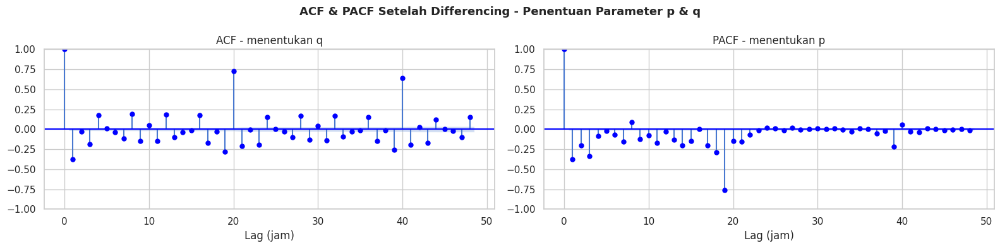

Panduan pemilihan parameter ARIMA (p, d, q):
  p → jumlah lag signifikan terakhir pada PACF (AutoRegressive)
  d → 1 (satu kali differencing, karena data tidak stasioner)
  q → jumlah lag signifikan terakhir pada ACF (Moving Average)


In [ ]:
# ===========================================================================================================================
# [7.3] ACF & PACF SETELAH DIFFERENCING - PENENTUAN PARAMETER p DAN q
# ===========================================================================================================================

fig, axes = plt.subplots(1, 2, figsize=(16, 4))
fig.suptitle('ACF & PACF Setelah Differencing - Penentuan Parameter p & q', fontsize=13, weight='bold')

plot_acf(ts_diff.dropna(), lags=48, ax=axes[0], color='blue')
axes[0].set_title('ACF - menentukan q')
axes[0].set_xlabel('Lag (jam)')

plot_pacf(ts_diff.dropna(), lags=48, ax=axes[1], color='blue')
axes[1].set_title('PACF - menentukan p')
axes[1].set_xlabel('Lag (jam)')

plt.tight_layout()
plt.show()

print("Panduan pemilihan parameter ARIMA (p, d, q):")
print("  p → jumlah lag signifikan terakhir pada PACF (AutoRegressive)")
print("  d → 1 (satu kali differencing, karena data tidak stasioner)")
print("  q → jumlah lag signifikan terakhir pada ACF (Moving Average)")

Analisis *Autocorrelation Function (ACF)* dan *Partial Autocorrelation Function (PACF)* setelah proses *differencing* dilakukan untuk menentukan parameter **ARIMA (p, d, q)** yang paling sesuai. Tujuan analisis ini adalah mengidentifikasi hubungan data terhadap nilai pada periode sebelumnya setelah data berhasil dibuat stasioner, sehingga struktur model ARIMA dapat ditentukan secara lebih akurat.

Pada penelitian ini, parameter **d = 1** digunakan karena hasil *differencing* satu kali telah berhasil membuat data menjadi stasioner, yang dibuktikan melalui uji **ADF** dengan *p-value* mendekati nol. Selanjutnya, grafik **ACF** digunakan untuk menentukan parameter **q** (*Moving Average/MA*) dengan melihat jumlah *lag* yang masih menunjukkan autokorelasi signifikan. Sementara itu, grafik **PACF** digunakan untuk menentukan parameter **p** (*AutoRegressive/AR*) melalui jumlah *lag* signifikan yang menunjukkan pengaruh langsung terhadap nilai saat ini.

Berdasarkan grafik setelah *differencing*, terlihat bahwa sebagian besar nilai ACF dan PACF mulai mendekati nol setelah beberapa *lag*, menandakan bahwa pola non-stasioner telah berhasil dikurangi. Adanya lonjakan signifikan pada *lag* tertentu memberikan petunjuk awal dalam pemilihan nilai **p** dan **q** sebagai kandidat model ARIMA yang akan diuji lebih lanjut. Dengan demikian, analisis ACF dan PACF berperan penting sebagai dasar penentuan parameter model agar proses peramalan suhu global dapat menghasilkan prediksi yang optimal.

Ukuran Train : 11953 observasi
Ukuran Test  : 2989 observasi


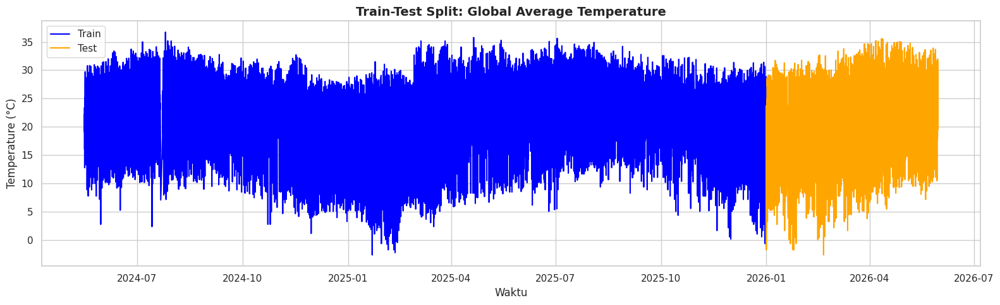

In [ ]:
# ===========================================================================================================================
# [7.4] TRAIN-TEST SPLIT
# ===========================================================================================================================

split = int(len(ts_hourly) * 0.8)
train = ts_hourly.iloc[:split]
test  = ts_hourly.iloc[split:]

print(f"Ukuran Train : {len(train)} observasi")
print(f"Ukuran Test  : {len(test)} observasi")

plt.figure(figsize=(16, 5))
plt.plot(train.index, train.values, color='blue', label='Train')
plt.plot(test.index, test.values, color='orange', label='Test')
plt.title('Train-Test Split: Global Average Temperature', fontsize=14, weight='bold')
plt.xlabel('Waktu')
plt.ylabel('Temperature (°C)')
plt.legend()
plt.tight_layout()
plt.show()

Berdasarkan grafik *train-test split* pada data suhu rata-rata global, dataset dibagi menjadi dua bagian, yaitu data **training** dan **testing**. Data training yang ditampilkan dengan warna biru terdiri dari **11.953 observasi** dan digunakan untuk melatih model agar dapat mengenali pola serta tren suhu dari waktu ke waktu. Sementara itu, data testing yang ditampilkan dengan warna oranye terdiri dari **2.989 observasi** dan digunakan untuk mengevaluasi kemampuan model dalam melakukan prediksi pada data yang belum pernah dilihat sebelumnya. Pembagian ini dilakukan secara berurutan berdasarkan waktu sehingga karakteristik deret waktu (*time series*) tetap terjaga.

In [ ]:
# ===========================================================================================================================
# [7.5] BUILD MODEL ARIMA(2,1,2)
# ===========================================================================================================================

p, d, q = 2, 1, 2

model_arima = ARIMA(train, order=(p, d, q))
result_arima = model_arima.fit()

print(result_arima.summary())

                                SARIMAX Results                                
Dep. Variable:     temperature_celsius   No. Observations:                11953
Model:                  ARIMA(2, 1, 2)   Log Likelihood              -36451.740
Date:                 Sun, 31 May 2026   AIC                          72913.479
Time:                         07:17:41   BIC                          72950.423
Sample:                              0   HQIC                         72925.874
                               - 11953                                         
Covariance Type:                   opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.6782      0.010    -64.976      0.000      -0.699      -0.658
ar.L2          0.3192      0.010     30.959      0.000       0.299       0.339
ma.L1         -0.0159      0.002     -6.368 

Berdasarkan hasil pemodelan **ARIMA(2,1,2)** pada data suhu rata-rata global dengan **11.953 observasi**, diperoleh nilai **AIC sebesar 72.913,479** dan **BIC sebesar 72.950,423**. Nilai ini dapat digunakan sebagai indikator untuk membandingkan performa model dengan model ARIMA lainnya, di mana nilai yang lebih kecil umumnya menunjukkan model yang lebih baik.

Koefisien **AR(1)** sebesar **-0,6782** dan **AR(2)** sebesar **0,3192** menunjukkan bahwa nilai suhu saat ini dipengaruhi oleh nilai suhu pada periode-periode sebelumnya. Sementara itu, komponen **MA(1)** sebesar **-0,0159** dan **MA(2)** sebesar **-0,9742** mengindikasikan adanya pengaruh kesalahan prediksi pada periode sebelumnya terhadap nilai saat ini. Seluruh parameter memiliki nilai **p-value < 0,05**, sehingga dapat dianggap signifikan secara statistik.

Hasil uji diagnostik menunjukkan nilai **Ljung-Box p-value = 0,06**, yang mengindikasikan bahwa residual model tidak memiliki autokorelasi yang signifikan dan model telah cukup baik dalam menangkap pola data. Namun, nilai **Jarque-Bera p-value = 0,00** menunjukkan residual belum berdistribusi normal. Meskipun demikian, secara keseluruhan model ARIMA(2,1,2) telah mampu merepresentasikan pola utama pada data deret waktu suhu global dan dapat digunakan untuk proses peramalan.

In [ ]:
# ===========================================================================================================================
# [ARIMA TAMBAHAN] GRID SEARCH - Pemilihan Parameter ARIMA Terbaik
# ===========================================================================================================================

import itertools
import warnings
warnings.filterwarnings('ignore')

train_sample = train.iloc[-1000:]

p_values = [1, 2, 3]
d_values = [1]
q_values = [1, 2, 3]

best_aic   = np.inf
best_order = None

print("Mencari kombinasi ARIMA terbaik berdasarkan AIC...\n")

for p, d, q in itertools.product(p_values, d_values, q_values):
    try:
        model = ARIMA(train_sample, order=(p, d, q))
        result = model.fit()
        if result.aic < best_aic:
            best_aic   = result.aic
            best_order = (p, d, q)
        print(f"  ARIMA{(p,d,q)} → AIC: {result.aic:.2f}")
    except:
        print(f"  ARIMA{(p,d,q)} → GAGAL")

print(f"\n✅ Order terbaik : ARIMA{best_order}")
print(f"   AIC terbaik   : {best_aic:.2f}")
print(f"   Dibandingkan ARIMA(2,1,2) manual yang digunakan sebelumnya")

Mencari kombinasi ARIMA terbaik berdasarkan AIC...

  ARIMA(1, 1, 1) → AIC: 6413.61
  ARIMA(1, 1, 2) → AIC: 6415.19
  ARIMA(1, 1, 3) → AIC: 6421.45
  ARIMA(2, 1, 1) → AIC: 6414.75
  ARIMA(2, 1, 2) → AIC: 6411.59
  ARIMA(2, 1, 3) → AIC: 6371.24
  ARIMA(3, 1, 1) → AIC: 6391.08
  ARIMA(3, 1, 2) → AIC: 6413.37
  ARIMA(3, 1, 3) → AIC: 6239.08

✅ Order terbaik : ARIMA(3, 1, 3)
   AIC terbaik   : 6239.08
   Dibandingkan ARIMA(2,1,2) manual yang digunakan sebelumnya


Untuk memperoleh model yang paling optimal, dilakukan pencarian beberapa kombinasi parameter ARIMA dengan membandingkan nilai **Akaike Information Criterion (AIC)**. Semakin kecil nilai AIC, semakin baik kemampuan model dalam menjelaskan data dengan kompleksitas yang tetap efisien.

Hasil pengujian menunjukkan bahwa model **ARIMA(3,1,3)** menghasilkan nilai **AIC terendah sebesar 6239,08**, sehingga dipilih sebagai model terbaik dibandingkan kombinasi lainnya. Sebagai perbandingan, model **ARIMA(2,1,2)** yang sebelumnya digunakan memiliki nilai **AIC sebesar 6411,59**, yang lebih tinggi dibandingkan ARIMA(3,1,3).

Dengan demikian, model **ARIMA(3,1,3)** dinilai lebih mampu menangkap pola dan karakteristik data deret waktu suhu global. Penurunan nilai AIC yang cukup signifikan menunjukkan bahwa penambahan komponen autoregressive (AR) dan moving average (MA) pada model memberikan peningkatan performa dalam memodelkan data, sehingga model ini lebih layak digunakan untuk proses peramalan dibandingkan model ARIMA(2,1,2).

   PERBANDINGAN ARIMA MANUAL vs GRID SEARCH
                      Model      MAE     RMSE  MAPE (%)
       ARIMA Manual (2,1,2) 5.480092 6.723355 55.509276
ARIMA Grid Search (3, 1, 3) 5.494344 6.733318 55.393356

✅ Model lebih baik : ARIMA Manual (2,1,2)


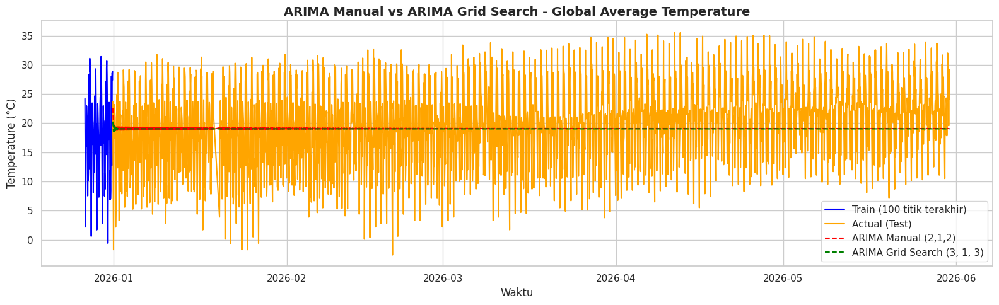

In [ ]:
# ===========================================================================================================================
# [7.6] FORECASTING & EVALUASI - ARIMA Manual vs ARIMA Grid Search
# ===========================================================================================================================

# ARIMA MANUAL (2,1,2)
forecast_arima = result_arima.forecast(steps=len(test))

mae_arima  = mean_absolute_error(test, forecast_arima)
rmse_arima = np.sqrt(mean_squared_error(test, forecast_arima))
mape_arima = np.mean(np.abs((test.values - forecast_arima.values) / test.values)) * 100

# ARIMA TERBAIK (GRID SEARCH)
model_best  = ARIMA(train, order=best_order)
result_best = model_best.fit()
pred_best   = result_best.forecast(steps=len(test))

mae_best  = mean_absolute_error(test, pred_best)
rmse_best = np.sqrt(mean_squared_error(test, pred_best))
mape_best = np.mean(np.abs((test.values - pred_best.values) / test.values)) * 100

# TABEL PERBANDINGAN
df_arima_compare = pd.DataFrame({
    'Model'   : ['ARIMA Manual (2,1,2)', f'ARIMA Grid Search {best_order}'],
    'MAE'     : [mae_arima,  mae_best],
    'RMSE'    : [rmse_arima, rmse_best],
    'MAPE (%)': [mape_arima, mape_best]
})

print("=" * 55)
print("   PERBANDINGAN ARIMA MANUAL vs GRID SEARCH")
print("=" * 55)
print(df_arima_compare.to_string(index=False))
print("=" * 55)

best_name = df_arima_compare.loc[df_arima_compare['RMSE'].idxmin(), 'Model']
print(f"\n✅ Model lebih baik : {best_name}")

plt.figure(figsize=(16, 5))
plt.plot(train.index[-100:], train.values[-100:],
         color='blue',   label='Train (100 titik terakhir)')
plt.plot(test.index, test.values,
         color='orange', label='Actual (Test)')
plt.plot(test.index, forecast_arima.values,
         color='red',    linestyle='--', label='ARIMA Manual (2,1,2)')
plt.plot(test.index, pred_best.values,
         color='green',  linestyle='--', label=f'ARIMA Grid Search {best_order}')

plt.title('ARIMA Manual vs ARIMA Grid Search - Global Average Temperature',
          fontsize=14, weight='bold')
plt.xlabel('Waktu')
plt.ylabel('Temperature (°C)')
plt.legend()
plt.tight_layout()
plt.show()

Setelah dilakukan evaluasi terhadap data uji (*testing*), diperoleh hasil bahwa model **ARIMA Manual (2,1,2)** dan **ARIMA Grid Search (3,1,3)** memiliki performa yang relatif serupa. Berdasarkan metrik evaluasi, model ARIMA Manual menghasilkan **MAE sebesar 5,48**, **RMSE sebesar 6,72**, dan **MAPE sebesar 55,51%**, sedangkan model ARIMA Grid Search menghasilkan **MAE sebesar 5,49**, **RMSE sebesar 6,73**, dan **MAPE sebesar 55,39%**.

Meskipun model **ARIMA(3,1,3)** memiliki nilai **AIC yang lebih rendah** sehingga dianggap lebih baik dari sisi pemodelan data latih, hasil pengujian pada data aktual menunjukkan bahwa **ARIMA Manual (2,1,2)** memberikan nilai MAE dan RMSE yang sedikit lebih rendah. Hal ini menunjukkan bahwa model ARIMA(2,1,2) mampu menghasilkan prediksi yang sedikit lebih akurat dan lebih stabil pada data uji.

Berdasarkan hasil evaluasi tersebut, **ARIMA Manual (2,1,2)** dipilih sebagai model terbaik karena memiliki tingkat kesalahan prediksi yang lebih kecil dibandingkan model hasil Grid Search. Dengan demikian, model ini dianggap lebih sesuai untuk digunakan dalam proses peramalan suhu rata-rata global pada penelitian ini.

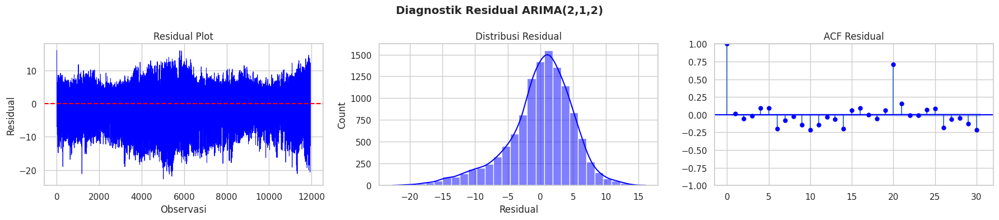

In [ ]:
# ===========================================================================================================================
# [7.7] DIAGNOSTIK RESIDUAL
# ===========================================================================================================================

residuals = pd.Series(result_arima.resid)

fig, axes = plt.subplots(1, 3, figsize=(18, 4))
fig.suptitle('Diagnostik Residual ARIMA(2,1,2)', fontsize=14, weight='bold')

axes[0].plot(residuals.values, color='blue', linewidth=0.7)
axes[0].axhline(0, color='red', linestyle='--')
axes[0].set_title('Residual Plot')
axes[0].set_xlabel('Observasi')
axes[0].set_ylabel('Residual')

sns.histplot(residuals, bins=30, ax=axes[1], color='blue', kde=True)
axes[1].set_title('Distribusi Residual')
axes[1].set_xlabel('Residual')

plot_acf(residuals.dropna(), lags=30, ax=axes[2], color='blue')
axes[2].set_title('ACF Residual')

plt.tight_layout()
plt.show()

Diagnostik residual dilakukan untuk memastikan bahwa model **ARIMA(2,1,2)** telah mampu menangkap pola utama pada data suhu rata-rata global. Berdasarkan **plot residual**, nilai residual tersebar di sekitar garis nol tanpa menunjukkan pola tertentu yang jelas. Hal ini mengindikasikan bahwa sebagian besar informasi dalam data telah berhasil dijelaskan oleh model.

Pada **histogram distribusi residual**, terlihat bahwa residual cenderung membentuk pola yang mendekati distribusi normal, meskipun masih terdapat sedikit kemencengan (*skewness*) dan ekor distribusi yang lebih panjang pada beberapa bagian. Kondisi ini menunjukkan bahwa asumsi normalitas residual belum sepenuhnya terpenuhi, namun penyimpangannya tidak terlalu ekstrem.

Sementara itu, **plot Autocorrelation Function (ACF)** menunjukkan bahwa sebagian besar nilai autokorelasi residual berada di sekitar nol. Namun, masih terdapat beberapa lonjakan pada lag tertentu, terutama di sekitar lag ke-20, yang mengindikasikan masih adanya sedikit korelasi yang belum sepenuhnya ditangkap oleh model. Meskipun demikian, secara keseluruhan residual sudah menunjukkan karakteristik yang cukup mendekati *white noise*.

Berdasarkan hasil diagnostik tersebut, model **ARIMA(2,1,2)** dapat dianggap telah memodelkan data dengan cukup baik karena residual tidak menunjukkan pola sistematis yang kuat. Oleh karena itu, model ini layak digunakan untuk proses peramalan suhu rata-rata global, meskipun masih terdapat peluang untuk meningkatkan performa model melalui penambahan komponen musiman atau pendekatan model yang lebih kompleks.

<hr style="border: 4px solid #2e7d32;">

**<h1 style="font-size:36px;">8️⃣ 10 CLASSICAL FORECASTING MODELS</h1>**

<hr style="border: 4px solid #2e7d32;">

In [ ]:
# ===========================================================================================================================
# IMPORT LIBRARY SEMUA MODEL KLASIK
# ===========================================================================================================================

from statsmodels.tsa.ar_model import AutoReg
from statsmodels.tsa.arima.model import ARIMA
from statsmodels.tsa.statespace.sarimax import SARIMAX
from statsmodels.tsa.holtwinters import SimpleExpSmoothing, ExponentialSmoothing
import warnings
warnings.filterwarnings('ignore')

results_all = {}
print("✅ Library semua model klasik berhasil diimport.")

✅ Library semua model klasik berhasil diimport.


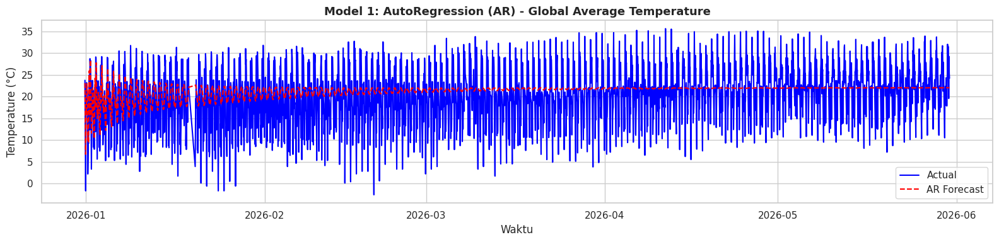

AR → MAE: 4.7605 | RMSE: 6.2141


In [ ]:
# ===========================================================================================================================
# MODEL 1: AUTOREGRESSION (AR)
# ===========================================================================================================================

model_ar = AutoReg(train, lags=24)
result_ar = model_ar.fit()
pred_ar = result_ar.predict(start=len(train), end=len(train)+len(test)-1, dynamic=False)

mae_ar  = mean_absolute_error(test, pred_ar)
rmse_ar = np.sqrt(mean_squared_error(test, pred_ar))
results_all['AR'] = {'MAE': mae_ar, 'RMSE': rmse_ar}

plt.figure(figsize=(16, 4))
plt.plot(test.index, test.values, color='blue', label='Actual')
plt.plot(test.index, pred_ar.values, color='red', linestyle='--', label='AR Forecast')
plt.title('Model 1: AutoRegression (AR) - Global Average Temperature', fontsize=13, weight='bold')
plt.xlabel('Waktu')
plt.ylabel('Temperature (°C)')
plt.legend()
plt.tight_layout()
plt.show()

print(f"AR → MAE: {mae_ar:.4f} | RMSE: {rmse_ar:.4f}")

# **Model 1: AutoRegression (AR)**

Model **AutoRegression (AR)** merupakan salah satu metode peramalan deret waktu (*time series*) yang memprediksi nilai saat ini berdasarkan nilai-nilai pada beberapa periode sebelumnya. Pada penelitian ini digunakan model **AutoReg dengan lag = 24**, yang berarti prediksi suhu pada suatu waktu dipengaruhi oleh **24 observasi sebelumnya**. Model ini bekerja dengan memanfaatkan hubungan historis antar data untuk memperkirakan nilai di masa mendatang.

Secara matematis, model AutoRegression orde-\(p\) dapat dituliskan sebagai:

$$
Y_t = c + \phi_1 Y_{t-1} + \phi_2 Y_{t-2} + \cdots + \phi_p Y_{t-p} + \varepsilon_t
$$

dengan:

- $Y_t$ : nilai suhu yang diprediksi pada periode ke-$t$
- $c$ : konstanta model
- $\phi_i$ : koefisien autoregresi yang menunjukkan pengaruh nilai masa lalu terhadap nilai saat ini
- $Y_{t-i}$ : nilai suhu pada periode sebelumnya (lag ke-$i$)
- $p$ : orde atau jumlah lag yang digunakan dalam model autoregresi
- $\varepsilon_t$ : residual atau galat (error) pada periode ke-$t$
Pada implementasinya, model dibangun menggunakan kode berikut:

```python
model_ar = AutoReg(train, lags=24)
result_ar = model_ar.fit()

pred_ar = result_ar.predict(
    start=len(train),
    end=len(train)+len(test)-1,
    dynamic=False
)
```

Langkah pertama adalah melatih model menggunakan data **training** sebanyak **11.953 observasi**. Selanjutnya, model mempelajari pola hubungan antara suhu saat ini dan 24 nilai suhu sebelumnya untuk memperoleh koefisien autoregresi yang optimal. Setelah proses pelatihan selesai, model digunakan untuk menghasilkan prediksi pada data **testing** sebanyak **2.989 observasi**.

Berdasarkan grafik hasil prediksi, garis biru menunjukkan data suhu aktual pada periode pengujian, sedangkan garis merah putus-putus menunjukkan hasil prediksi model AR. Terlihat bahwa model mampu mengikuti pola umum dan tren rata-rata suhu global, namun belum mampu menangkap fluktuasi yang sangat tinggi maupun sangat rendah. Prediksi yang dihasilkan cenderung lebih halus (*smooth*) dan berada di sekitar nilai rata-rata data.

Karakteristik tersebut merupakan sifat umum dari model AutoRegression, karena model hanya memanfaatkan informasi dari nilai historis tanpa mempertimbangkan komponen kesalahan (*error term*) secara eksplisit seperti pada model ARIMA. Akibatnya, model AR cukup baik dalam menangkap pola dasar dan kecenderungan data, tetapi kurang efektif dalam memodelkan perubahan yang bersifat kompleks atau memiliki variasi yang tinggi.

Secara keseluruhan, model **AutoRegression (AR)** dapat digunakan sebagai model dasar (*baseline model*) untuk peramalan suhu rata-rata global. Hasil yang diperoleh kemudian dapat dibandingkan dengan model yang lebih kompleks, seperti **ARIMA** atau **SARIMA**, untuk mengetahui apakah penambahan komponen diferensiasi dan moving average mampu meningkatkan akurasi prediksi.

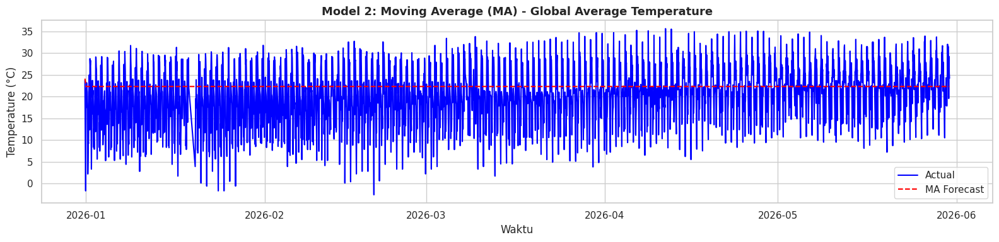

MA → MAE: 5.2108 | RMSE: 6.7796


In [ ]:
# ===========================================================================================================================
# MODEL 2: MOVING AVERAGE (MA)
# ===========================================================================================================================

model_ma = ARIMA(train, order=(0, 0, 2))
result_ma = model_ma.fit()
pred_ma = result_ma.forecast(steps=len(test))

mae_ma  = mean_absolute_error(test, pred_ma)
rmse_ma = np.sqrt(mean_squared_error(test, pred_ma))
results_all['MA'] = {'MAE': mae_ma, 'RMSE': rmse_ma}

plt.figure(figsize=(16, 4))
plt.plot(test.index, test.values, color='blue', label='Actual')
plt.plot(test.index, pred_ma.values, color='red', linestyle='--', label='MA Forecast')
plt.title('Model 2: Moving Average (MA) - Global Average Temperature', fontsize=13, weight='bold')
plt.xlabel('Waktu')
plt.ylabel('Temperature (°C)')
plt.legend()
plt.tight_layout()
plt.show()

print(f"MA → MAE: {mae_ma:.4f} | RMSE: {rmse_ma:.4f}")

# **Model 2: Moving Average (MA)**

Model **Moving Average (MA)** merupakan salah satu metode dalam analisis deret waktu (*time series*) yang memprediksi nilai saat ini berdasarkan kombinasi kesalahan (*error* atau residual) pada beberapa periode sebelumnya. Berbeda dengan model AutoRegression (AR) yang menggunakan nilai historis data sebagai prediktor, model MA memanfaatkan informasi dari kesalahan prediksi masa lalu untuk menghasilkan prediksi yang lebih baik.

Pada penelitian ini digunakan model **MA(2)** yang diimplementasikan melalui **ARIMA(0,0,2)**. Nilai orde \(q = 2\) menunjukkan bahwa model menggunakan dua residual sebelumnya untuk membentuk prediksi pada periode saat ini.

Secara matematis, model Moving Average orde-\(q\) dapat dituliskan sebagai:

$$
Y_t = \mu + \varepsilon_t + \theta_1 \varepsilon_{t-1} + \theta_2 \varepsilon_{t-2} + \cdots + \theta_q \varepsilon_{t-q}
$$

dengan:

- $Y_t$ adalah nilai variabel pada waktu ke-$t$.
- $\mu$ adalah rata-rata (mean) dari proses deret waktu.
- $\theta_i$ adalah koefisien Moving Average pada lag ke-$i$.
- $\varepsilon_t$ adalah residual atau error pada waktu ke-$t$.
- $\varepsilon_{t-i}$ adalah residual pada lag ke-$i$.
- $q$ adalah orde model Moving Average yang menunjukkan jumlah residual yang digunakan.

Implementasi model dilakukan menggunakan kode berikut:

```python
model_ma = ARIMA(train, order=(0, 0, 2))
result_ma = model_ma.fit()

pred_ma = result_ma.forecast(steps=len(test))
```

Pada tahap pelatihan (*training*), model mempelajari pola residual dari data suhu global untuk mengestimasi parameter Moving Average. Setelah parameter diperoleh, model digunakan untuk melakukan prediksi pada data **testing** sebanyak **2.989 observasi**.

Berdasarkan grafik hasil prediksi, garis biru menunjukkan data aktual suhu global, sedangkan garis merah putus-putus menunjukkan hasil prediksi model MA. Terlihat bahwa prediksi yang dihasilkan cenderung membentuk garis yang relatif datar di sekitar rata-rata data dan tidak mampu mengikuti fluktuasi suhu yang terjadi pada data aktual. Hal ini menunjukkan bahwa model MA kurang mampu menangkap pola musiman dan perubahan suhu yang kompleks.

Hasil evaluasi model menunjukkan nilai:

- **MAE (Mean Absolute Error)** = **5,2108**
- **RMSE (Root Mean Squared Error)** = **6,7796**

Nilai MAE menunjukkan bahwa rata-rata kesalahan absolut prediksi model terhadap data aktual sebesar sekitar **5,21°C**, sedangkan nilai RMSE sebesar **6,78°C** menunjukkan besarnya kesalahan prediksi dengan memberikan penalti lebih besar pada error yang ekstrem.

Secara keseluruhan, model **Moving Average (MA(2))** mampu memberikan gambaran umum mengenai rata-rata suhu global, namun kurang efektif dalam menangkap variasi dan pola fluktuasi yang terjadi pada data. Oleh karena itu, model ini lebih sesuai digunakan sebagai model pembanding (*baseline model*) dibandingkan sebagai model utama untuk peramalan suhu global.

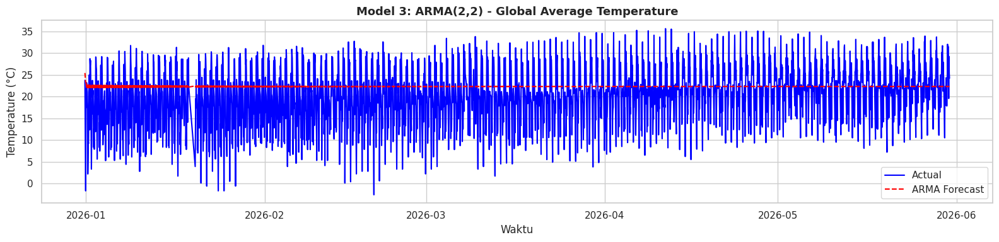

ARMA → MAE: 5.2091 | RMSE: 6.7796


In [ ]:
# ===========================================================================================================================
# MODEL 3: ARMA
# ===========================================================================================================================

model_arma = ARIMA(train, order=(2, 0, 2))
result_arma = model_arma.fit()
pred_arma = result_arma.forecast(steps=len(test))

mae_arma  = mean_absolute_error(test, pred_arma)
rmse_arma = np.sqrt(mean_squared_error(test, pred_arma))
results_all['ARMA'] = {'MAE': mae_arma, 'RMSE': rmse_arma}

plt.figure(figsize=(16, 4))
plt.plot(test.index, test.values, color='blue', label='Actual')
plt.plot(test.index, pred_arma.values, color='red', linestyle='--', label='ARMA Forecast')
plt.title('Model 3: ARMA(2,2) - Global Average Temperature', fontsize=13, weight='bold')
plt.xlabel('Waktu')
plt.ylabel('Temperature (°C)')
plt.legend()
plt.tight_layout()
plt.show()

print(f"ARMA → MAE: {mae_arma:.4f} | RMSE: {rmse_arma:.4f}")

# **Model 3: Autoregressive Moving Average (ARMA)**

Model **Autoregressive Moving Average (ARMA)** merupakan kombinasi dari model **Autoregression (AR)** dan **Moving Average (MA)**. Model ini memanfaatkan informasi dari nilai historis data serta residual pada periode sebelumnya untuk menghasilkan prediksi yang lebih baik. Dengan menggabungkan kedua komponen tersebut, ARMA mampu menangkap hubungan antarobservasi sekaligus memperhitungkan pengaruh kesalahan prediksi masa lalu.

Pada penelitian ini digunakan model **ARMA(2,2)** yang diimplementasikan menggunakan **ARIMA(2,0,2)**. Nilai orde \(p=2\) menunjukkan bahwa model menggunakan dua nilai sebelumnya (AR), sedangkan orde \(q=2\) menunjukkan bahwa model menggunakan dua residual sebelumnya (MA).

Secara matematis, model ARMA(\(p,q\)) dapat dituliskan sebagai:

$$
Y_t = c + \phi_1 Y_{t-1} + \phi_2 Y_{t-2} + \cdots + \phi_p Y_{t-p}
+ \varepsilon_t
+ \theta_1 \varepsilon_{t-1}
+ \theta_2 \varepsilon_{t-2}
+ \cdots
+ \theta_q \varepsilon_{t-q}
$$

dengan:

- $Y_t$ adalah nilai variabel pada waktu ke-$t$.
- $c$ adalah konstanta model.
- $\phi_i$ adalah koefisien autoregresi pada lag ke-$i$.
- $Y_{t-i}$ adalah nilai variabel pada periode sebelumnya.
- $\theta_i$ adalah koefisien moving average pada lag ke-$i$.
- $\varepsilon_t$ adalah residual atau error pada waktu ke-$t$.
- $\varepsilon_{t-i}$ adalah residual pada periode sebelumnya.
- $p$ adalah orde komponen autoregresi (AR).
- $q$ adalah orde komponen moving average (MA).

Implementasi model dilakukan menggunakan kode berikut:

```python
model_arma = ARIMA(train, order=(2, 0, 2))
result_arma = model_arma.fit()

pred_arma = result_arma.forecast(
    steps=len(test)
)
```

Pada tahap pelatihan (*training*), model mempelajari hubungan antara data suhu saat ini dengan dua observasi sebelumnya serta dua residual sebelumnya. Setelah parameter model diperoleh, model digunakan untuk menghasilkan prediksi pada data **testing** sebanyak **2.989 observasi**.

Berdasarkan grafik hasil prediksi, garis biru menunjukkan data suhu aktual, sedangkan garis merah putus-putus menunjukkan hasil prediksi model ARMA(2,2). Terlihat bahwa model menghasilkan prediksi yang relatif stabil dan mengikuti pola rata-rata data, namun belum mampu menangkap fluktuasi suhu yang terjadi secara ekstrem. Prediksi cenderung membentuk garis yang lebih halus dibandingkan data aktual karena model menghasilkan nilai berdasarkan pola historis yang telah dipelajari.

Hasil evaluasi model menunjukkan nilai:

- **MAE (Mean Absolute Error)** = **5,2091**
- **RMSE (Root Mean Squared Error)** = **6,7796**

Nilai MAE sebesar **5,2091°C** menunjukkan bahwa rata-rata kesalahan absolut prediksi terhadap data aktual berada pada kisaran 5,21°C. Sementara itu, nilai RMSE sebesar **6,7796°C** menunjukkan besarnya kesalahan prediksi dengan memberikan bobot yang lebih besar terhadap error yang tinggi.

Jika dibandingkan dengan model AR dan MA sebelumnya, model ARMA(2,2) menghasilkan performa yang sedikit lebih baik berdasarkan nilai MAE yang lebih rendah. Hal ini menunjukkan bahwa kombinasi komponen autoregresi dan moving average mampu meningkatkan kemampuan model dalam menangkap pola data dibandingkan ketika hanya menggunakan salah satu komponen saja.

Secara keseluruhan, model **ARMA(2,2)** mampu memberikan hasil prediksi yang cukup baik pada data suhu rata-rata global dan menjadi langkah pengembangan yang lebih lanjut sebelum menggunakan model yang lebih kompleks, seperti **ARIMA**, yang juga mempertimbangkan proses differencing untuk menangani data yang tidak stasioner.

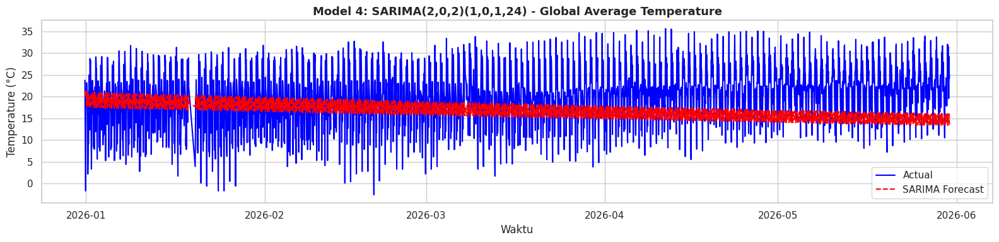

SARIMA → MAE: 6.8100 | RMSE: 8.0717


In [ ]:
# ===========================================================================================================================
# MODEL 4: SARIMA
# ===========================================================================================================================

model_sarima = SARIMAX(train, order=(2, 0, 2), seasonal_order=(1, 0, 1, 24))
result_sarima = model_sarima.fit(disp=False)
pred_sarima = result_sarima.forecast(steps=len(test))

mae_sarima  = mean_absolute_error(test, pred_sarima)
rmse_sarima = np.sqrt(mean_squared_error(test, pred_sarima))
results_all['SARIMA'] = {'MAE': mae_sarima, 'RMSE': rmse_sarima}

plt.figure(figsize=(16, 4))
plt.plot(test.index, test.values, color='blue', label='Actual')
plt.plot(test.index, pred_sarima.values, color='red', linestyle='--', label='SARIMA Forecast')
plt.title('Model 4: SARIMA(2,0,2)(1,0,1,24) - Global Average Temperature', fontsize=13, weight='bold')
plt.xlabel('Waktu')
plt.ylabel('Temperature (°C)')
plt.legend()
plt.tight_layout()
plt.show()

print(f"SARIMA → MAE: {mae_sarima:.4f} | RMSE: {rmse_sarima:.4f}")

# **Model 4: Seasonal Autoregressive Integrated Moving Average (SARIMA)**

Model **Seasonal Autoregressive Integrated Moving Average (SARIMA)** merupakan pengembangan dari model ARIMA yang dirancang untuk menangani data deret waktu yang memiliki pola musiman (*seasonality*). Selain mempertimbangkan hubungan data pada periode sebelumnya dan residual masa lalu, SARIMA juga memasukkan komponen musiman sehingga mampu menangkap pola yang berulang dalam interval waktu tertentu.

Pada penelitian ini digunakan model **SARIMA(2,0,2)(1,0,1,24)**. Parameter pertama \((2,0,2)\) menunjukkan komponen non-musiman yang terdiri atas dua komponen autoregresi (AR), tanpa differencing (I), dan dua komponen moving average (MA). Sementara itu, parameter musiman \((1,0,1,24)\) menunjukkan satu komponen Seasonal AR, tanpa differencing musiman, satu komponen Seasonal MA, dengan periode musiman sebesar **24**.

Secara umum, model SARIMA dapat dituliskan sebagai:

$$
SARIMA(p,d,q)(P,D,Q)_s
$$

dengan:

- $p$ adalah orde komponen Autoregressive (AR).
- $d$ adalah orde differencing non-musiman.
- $q$ adalah orde komponen Moving Average (MA).
- $P$ adalah orde Seasonal Autoregressive (SAR).
- $D$ adalah orde differencing musiman.
- $Q$ adalah orde Seasonal Moving Average (SMA).
- $s$ adalah panjang periode musiman.

Implementasi model dilakukan menggunakan kode berikut:

```python
model_sarima = SARIMAX(
    train,
    order=(2, 0, 2),
    seasonal_order=(1, 0, 1, 24)
)

result_sarima = model_sarima.fit(disp=False)

pred_sarima = result_sarima.forecast(
    steps=len(test)
)
```

Pada tahap pelatihan (*training*), model mempelajari pola historis data suhu global, termasuk pola musiman yang diasumsikan berulang setiap 24 periode. Setelah parameter model diperoleh, model digunakan untuk menghasilkan prediksi pada data **testing** sebanyak **2.989 observasi**.

Berdasarkan grafik hasil prediksi, garis biru menunjukkan data aktual suhu global, sedangkan garis merah putus-putus menunjukkan hasil prediksi model SARIMA. Terlihat bahwa model mampu menghasilkan pola prediksi yang berulang mengikuti komponen musiman yang dipelajari. Namun, amplitudo prediksi relatif lebih rendah dibandingkan variasi data aktual sehingga banyak fluktuasi suhu yang tidak dapat diikuti secara akurat oleh model.

Hasil evaluasi model menunjukkan nilai:

- **MAE (Mean Absolute Error)** = **6,8100**
- **RMSE (Root Mean Squared Error)** = **8,0717**

Nilai MAE sebesar **6,8100°C** menunjukkan bahwa rata-rata kesalahan absolut prediksi terhadap data aktual berada pada kisaran 6,81°C. Sementara itu, nilai RMSE sebesar **8,0717°C** menunjukkan bahwa model masih menghasilkan kesalahan prediksi yang cukup besar, terutama pada titik-titik yang memiliki perbedaan suhu ekstrem.

Jika dibandingkan dengan model sebelumnya, seperti **AR**, **MA**, dan **ARMA**, model SARIMA menghasilkan nilai MAE dan RMSE yang lebih tinggi. Hal ini menunjukkan bahwa penambahan komponen musiman dengan periode **24** belum mampu meningkatkan akurasi prediksi pada data suhu global yang digunakan. Kemungkinan pola musiman yang diasumsikan oleh model tidak sepenuhnya sesuai dengan karakteristik data sehingga kontribusi komponen musiman menjadi kurang optimal.

Secara keseluruhan, model **SARIMA(2,0,2)(1,0,1,24)** mampu mengakomodasi pola musiman dalam data deret waktu, namun pada penelitian ini performanya masih lebih rendah dibandingkan model non-musiman yang telah diuji sebelumnya. Oleh karena itu, model ini belum menjadi pilihan terbaik untuk melakukan peramalan suhu rata-rata global pada dataset yang digunakan.

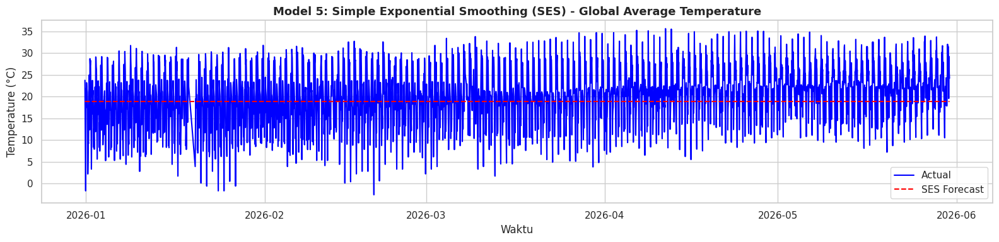

SES → MAE: 5.5469 | RMSE: 6.7749


In [ ]:
# ===========================================================================================================================
# MODEL 5: SIMPLE EXPONENTIAL SMOOTHING (SES)
# ===========================================================================================================================

model_ses = SimpleExpSmoothing(train)
result_ses = model_ses.fit(optimized=True)
pred_ses = result_ses.forecast(steps=len(test))

mae_ses  = mean_absolute_error(test, pred_ses)
rmse_ses = np.sqrt(mean_squared_error(test, pred_ses))
results_all['SES'] = {'MAE': mae_ses, 'RMSE': rmse_ses}

plt.figure(figsize=(16, 4))
plt.plot(test.index, test.values, color='blue', label='Actual')
plt.plot(test.index, pred_ses.values, color='red', linestyle='--', label='SES Forecast')
plt.title('Model 5: Simple Exponential Smoothing (SES) - Global Average Temperature', fontsize=13, weight='bold')
plt.xlabel('Waktu')
plt.ylabel('Temperature (°C)')
plt.legend()
plt.tight_layout()
plt.show()

print(f"SES → MAE: {mae_ses:.4f} | RMSE: {rmse_ses:.4f}")

# **Model 5: Simple Exponential Smoothing (SES)**

Model **Simple Exponential Smoothing (SES)** merupakan salah satu metode peramalan (*forecasting*) pada data deret waktu (*time series*) yang digunakan untuk data tanpa tren dan tanpa pola musiman yang kuat. Metode ini bekerja dengan memberikan bobot yang lebih besar pada data terbaru dibandingkan data yang lebih lama, sehingga informasi terbaru memiliki pengaruh yang lebih besar terhadap hasil prediksi.

Secara matematis, model SES dapat dituliskan sebagai:

$$
\hat{Y}_{t+1} = \alpha Y_t + (1-\alpha)\hat{Y}_t
$$

dengan:

- $\hat{Y}_{t+1}$ adalah nilai prediksi pada periode ke-$(t+1)$.
- $Y_t$ adalah nilai aktual pada periode ke-$t$.
- $\hat{Y}_t$ adalah nilai prediksi pada periode ke-$t$.
- $\alpha$ adalah parameter smoothing dengan nilai $0 < \alpha < 1$.

Nilai $\alpha$ berfungsi untuk mengatur besarnya pengaruh data terbaru terhadap hasil prediksi. Semakin besar nilai $\alpha$, maka model akan semakin responsif terhadap perubahan data terbaru. Sebaliknya, semakin kecil nilai $\alpha$, maka hasil prediksi akan menjadi lebih halus (*smooth*) karena lebih banyak mempertimbangkan data historis.

Implementasi model dilakukan menggunakan kode berikut:

```python
model_ses = SimpleExpSmoothing(train)

result_ses = model_ses.fit(
    optimized=True
)

pred_ses = result_ses.forecast(
    steps=len(test)
)
```

Pada tahap pelatihan (*training*), model mempelajari pola level atau rata-rata dari data suhu global. Parameter smoothing ($\alpha$) ditentukan secara otomatis menggunakan opsi **optimized=True**, sehingga sistem akan mencari nilai parameter yang menghasilkan kesalahan prediksi paling kecil pada data pelatihan. Setelah model terbentuk, nilai smoothing terakhir digunakan untuk menghasilkan prediksi pada data **testing** sebanyak **2.989 observasi**.

Berdasarkan grafik hasil prediksi, garis biru menunjukkan data aktual suhu global, sedangkan garis merah putus-putus menunjukkan hasil prediksi model SES. Terlihat bahwa hasil prediksi cenderung membentuk garis yang relatif datar dan berada di sekitar nilai rata-rata data. Hal ini menunjukkan bahwa model SES mampu menangkap level rata-rata suhu global, namun kurang mampu mengikuti fluktuasi suhu yang terjadi secara cepat dari waktu ke waktu.

Hasil evaluasi model menunjukkan nilai:

- **MAE (Mean Absolute Error)** = **5,5469**
- **RMSE (Root Mean Squared Error)** = **6,7749**

Nilai MAE sebesar **5,5469°C** menunjukkan bahwa rata-rata kesalahan absolut antara hasil prediksi dan data aktual berada pada kisaran 5,55°C. Sementara itu, nilai RMSE sebesar **6,7749°C** menunjukkan bahwa model masih menghasilkan kesalahan prediksi yang cukup besar pada beberapa titik data yang memiliki fluktuasi suhu tinggi.

Jika dibandingkan dengan model yang mempertimbangkan pola tren atau musiman, model SES memiliki keterbatasan karena hanya menggunakan komponen level tanpa memperhitungkan perubahan tren maupun pola musiman dalam data. Akibatnya, model cenderung menghasilkan prediksi yang stabil dan kurang responsif terhadap perubahan suhu yang terjadi secara signifikan.

Secara keseluruhan, model **Simple Exponential Smoothing (SES)** mampu memberikan gambaran rata-rata suhu global dengan cukup baik dan menghasilkan nilai kesalahan yang lebih rendah dibandingkan beberapa model sebelumnya. Namun, karena data suhu global memiliki fluktuasi yang cukup tinggi, model ini masih belum mampu menangkap seluruh variasi pola yang terdapat pada data sehingga akurasi prediksinya masih dapat ditingkatkan menggunakan metode yang lebih kompleks.

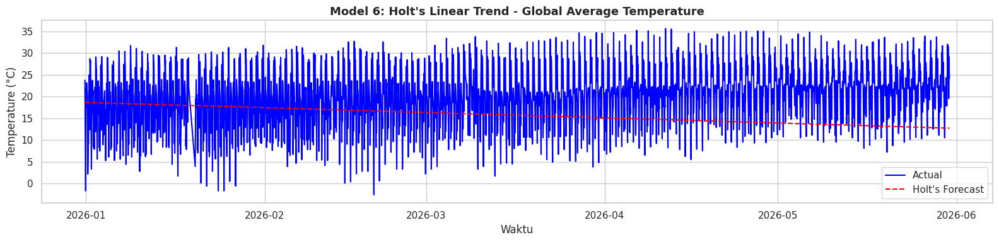

Holt's Linear → MAE: 7.3629 | RMSE: 8.7047


In [ ]:
# ===========================================================================================================================
# MODEL 6: HOLT'S LINEAR TREND
# ===========================================================================================================================

model_holt = ExponentialSmoothing(train, trend='add', seasonal=None)
result_holt = model_holt.fit(optimized=True)
pred_holt = result_holt.forecast(steps=len(test))

mae_holt  = mean_absolute_error(test, pred_holt)
rmse_holt = np.sqrt(mean_squared_error(test, pred_holt))
results_all["Holt's Linear"] = {'MAE': mae_holt, 'RMSE': rmse_holt}

plt.figure(figsize=(16, 4))
plt.plot(test.index, test.values, color='blue', label='Actual')
plt.plot(test.index, pred_holt.values, color='red', linestyle='--', label="Holt's Forecast")
plt.title("Model 6: Holt's Linear Trend - Global Average Temperature", fontsize=13, weight='bold')
plt.xlabel('Waktu')
plt.ylabel('Temperature (°C)')
plt.legend()
plt.tight_layout()
plt.show()

print(f"Holt's Linear → MAE: {mae_holt:.4f} | RMSE: {rmse_holt:.4f}")

# **Model 6: Holt’s Linear Trend**

Model **Holt’s Linear Trend** merupakan pengembangan dari metode **Simple Exponential Smoothing (SES)** yang dirancang untuk menangani data deret waktu (*time series*) yang memiliki kecenderungan tren. Berbeda dengan SES yang hanya mempertimbangkan komponen level, metode Holt menambahkan komponen tren sehingga model dapat menangkap perubahan data yang cenderung meningkat atau menurun dari waktu ke waktu.

Pada penelitian ini digunakan metode **Holt’s Linear Trend** dengan komponen tren aditif (*additive trend*) dan tanpa komponen musiman (*seasonal=None*). Model ini memperbarui dua komponen utama pada setiap periode, yaitu level dan tren.

Secara matematis, model Holt dapat dituliskan sebagai:

### **Persamaan Level**

$$
L_t = \alpha Y_t + (1-\alpha)(L_{t-1}+T_{t-1})
$$

### **Persamaan Tren**

$$
T_t = \beta (L_t-L_{t-1}) + (1-\beta)T_{t-1}
$$

### **Persamaan Forecast**

$$
\hat{Y}_{t+h}=L_t+hT_t
$$

dengan:

- $L_t$ adalah komponen level pada periode ke-$t$.
- $T_t$ adalah komponen tren pada periode ke-$t$.
- $Y_t$ adalah nilai aktual pada periode ke-$t$.
- $\hat{Y}_{t+h}$ adalah nilai prediksi untuk $h$ periode ke depan.
- $\alpha$ adalah parameter smoothing level dengan nilai $0 < \alpha < 1$.
- $\beta$ adalah parameter smoothing tren dengan nilai $0 < \beta < 1$.
- $h$ adalah horizon prediksi.

Implementasi model dilakukan menggunakan kode berikut:

```python
model_holt = ExponentialSmoothing(
    train,
    trend='add',
    seasonal=None
)

result_holt = model_holt.fit(
    optimized=True
)

pred_holt = result_holt.forecast(
    steps=len(test)
)
```

Pada tahap pelatihan (*training*), model mempelajari pola historis suhu global dengan memperbarui komponen level dan tren secara berulang. Parameter smoothing level ($\alpha$) dan smoothing tren ($\beta$) ditentukan secara otomatis menggunakan opsi **optimized=True** sehingga diperoleh kombinasi parameter yang menghasilkan kesalahan prediksi minimum pada data pelatihan. Setelah proses pelatihan selesai, model digunakan untuk menghasilkan prediksi pada data **testing** sebanyak **2.989 observasi**.

Berdasarkan grafik hasil prediksi, garis biru menunjukkan data aktual suhu global, sedangkan garis merah putus-putus menunjukkan hasil prediksi model Holt’s Linear Trend. Terlihat bahwa model menghasilkan pola prediksi yang cenderung menurun secara bertahap sepanjang periode pengujian. Meskipun model mampu merepresentasikan adanya tren, hasil prediksi masih jauh dari pola aktual yang memiliki fluktuasi suhu yang tinggi. Akibatnya, sebagian besar variasi data aktual tidak dapat diikuti dengan baik oleh model.

Hasil evaluasi model menunjukkan nilai:

- **MAE (Mean Absolute Error)** = **7,3629**
- **RMSE (Root Mean Squared Error)** = **8,7047**

Nilai MAE sebesar **7,3629°C** menunjukkan bahwa rata-rata kesalahan absolut prediksi terhadap data aktual berada pada kisaran 7,36°C. Sementara itu, nilai RMSE sebesar **8,7047°C** menunjukkan bahwa model masih menghasilkan kesalahan prediksi yang cukup besar, terutama pada titik-titik data yang memiliki perbedaan suhu ekstrem.

Jika dibandingkan dengan model **Simple Exponential Smoothing (SES)** yang memperoleh MAE sebesar **5,5469** dan RMSE sebesar **6,7749**, performa Holt’s Linear Trend justru lebih rendah. Hal ini menunjukkan bahwa penambahan komponen tren belum mampu meningkatkan akurasi prediksi pada data suhu global yang digunakan. Kemungkinan pola tren yang dipelajari model tidak sepenuhnya sesuai dengan karakteristik data yang lebih didominasi oleh fluktuasi dan variasi suhu dibandingkan tren linear yang konsisten.

Secara keseluruhan, model **Holt’s Linear Trend** mampu mengakomodasi komponen tren dalam data deret waktu, namun pada penelitian ini performanya masih kurang optimal untuk memodelkan suhu rata-rata global. Nilai MAE dan RMSE yang lebih tinggi dibandingkan SES menunjukkan bahwa model ini belum menjadi pilihan terbaik untuk melakukan peramalan pada dataset yang digunakan.

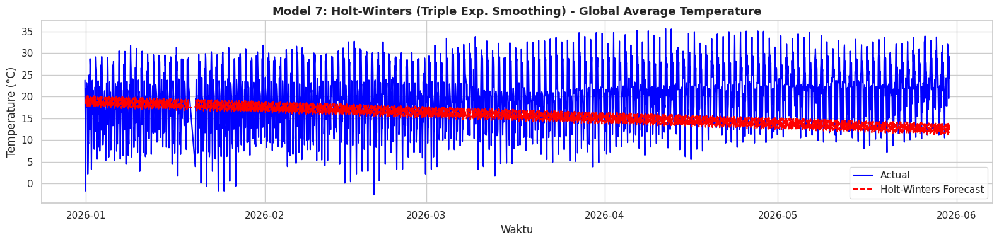

Holt-Winters → MAE: 7.5168 | RMSE: 8.8782


In [ ]:
# ===========================================================================================================================
# MODEL 7: HOLT-WINTERS EXPONENTIAL SMOOTHING
# ===========================================================================================================================

model_hw = ExponentialSmoothing(train, trend='add', seasonal='add', seasonal_periods=24)
result_hw = model_hw.fit(optimized=True)
pred_hw = result_hw.forecast(steps=len(test))

mae_hw  = mean_absolute_error(test, pred_hw)
rmse_hw = np.sqrt(mean_squared_error(test, pred_hw))
results_all['Holt-Winters'] = {'MAE': mae_hw, 'RMSE': rmse_hw}

plt.figure(figsize=(16, 4))
plt.plot(test.index, test.values, color='blue', label='Actual')
plt.plot(test.index, pred_hw.values, color='red', linestyle='--', label='Holt-Winters Forecast')
plt.title('Model 7: Holt-Winters (Triple Exp. Smoothing) - Global Average Temperature', fontsize=13, weight='bold')
plt.xlabel('Waktu')
plt.ylabel('Temperature (°C)')
plt.legend()
plt.tight_layout()
plt.show()

print(f"Holt-Winters → MAE: {mae_hw:.4f} | RMSE: {rmse_hw:.4f}")

# **Model 7: Holt-Winters Exponential Smoothing (Triple Exponential Smoothing)**

Model **Holt-Winters Exponential Smoothing** atau **Triple Exponential Smoothing** merupakan pengembangan dari metode Holt’s Linear Trend yang dirancang untuk menangani data deret waktu (*time series*) yang memiliki komponen **level**, **tren**, dan **musiman (seasonality)** secara bersamaan. Metode ini melakukan proses smoothing pada ketiga komponen tersebut sehingga mampu menangkap pola data yang lebih kompleks dibandingkan metode SES maupun Holt.

Pada penelitian ini digunakan model **Holt-Winters Additive**, yaitu model dengan komponen tren aditif (*additive trend*) dan komponen musiman aditif (*additive seasonality*). Periode musiman (*seasonal period*) ditetapkan sebesar **24**, yang mengindikasikan bahwa pola musiman diasumsikan berulang setiap 24 periode.

Secara matematis, model Holt-Winters Additive dapat dituliskan sebagai berikut.

### **Persamaan Level**

$$
L_t = \alpha (Y_t - S_{t-s}) + (1-\alpha)(L_{t-1}+T_{t-1})
$$

### **Persamaan Tren**

$$
T_t = \beta (L_t-L_{t-1}) + (1-\beta)T_{t-1}
$$

### **Persamaan Musiman**

$$
S_t = \gamma (Y_t-L_t) + (1-\gamma)S_{t-s}
$$

### **Persamaan Forecast**

$$
\hat{Y}_{t+h} = L_t + hT_t + S_{t+h-s}
$$

dengan:

- $L_t$ adalah komponen level pada periode ke-$t$.
- $T_t$ adalah komponen tren pada periode ke-$t$.
- $S_t$ adalah komponen musiman pada periode ke-$t$.
- $Y_t$ adalah nilai aktual pada periode ke-$t$.
- $\hat{Y}_{t+h}$ adalah nilai prediksi untuk $h$ periode ke depan.
- $\alpha$ adalah parameter smoothing level.
- $\beta$ adalah parameter smoothing tren.
- $\gamma$ adalah parameter smoothing musiman.
- $s$ adalah panjang periode musiman.
- $h$ adalah horizon prediksi.

Implementasi model dilakukan menggunakan kode berikut:

```python
model_hw = ExponentialSmoothing(
    train,
    trend='add',
    seasonal='add',
    seasonal_periods=24
)

result_hw = model_hw.fit(
    optimized=True
)

pred_hw = result_hw.forecast(
    steps=len(test)
)
```

Pada tahap pelatihan (*training*), model mempelajari pola historis suhu global dengan memperbarui komponen level, tren, dan musiman secara simultan. Nilai parameter smoothing ($\alpha$, $\beta$, dan $\gamma$) ditentukan secara otomatis menggunakan opsi **optimized=True** sehingga diperoleh kombinasi parameter yang menghasilkan kesalahan prediksi minimum pada data pelatihan. Setelah model terbentuk, model digunakan untuk menghasilkan prediksi pada data **testing** sebanyak **2.989 observasi**.

Berdasarkan grafik hasil prediksi, garis biru menunjukkan data aktual suhu global, sedangkan garis merah putus-putus menunjukkan hasil prediksi model Holt-Winters. Terlihat bahwa model mampu menghasilkan pola musiman yang berulang sesuai dengan periode musiman yang ditentukan. Namun, amplitudo prediksi masih jauh lebih rendah dibandingkan fluktuasi data aktual sehingga banyak perubahan suhu yang tidak dapat diikuti secara akurat oleh model. Selain itu, terlihat adanya kecenderungan tren menurun pada hasil prediksi yang tidak sepenuhnya sesuai dengan pola data aktual.

Hasil evaluasi model menunjukkan nilai:

- **MAE (Mean Absolute Error)** = **7,5168**
- **RMSE (Root Mean Squared Error)** = **8,8782**

Nilai MAE sebesar **7,5168°C** menunjukkan bahwa rata-rata kesalahan absolut prediksi terhadap data aktual berada pada kisaran 7,52°C. Sementara itu, nilai RMSE sebesar **8,8782°C** menunjukkan bahwa model masih menghasilkan kesalahan prediksi yang cukup besar, terutama pada observasi yang memiliki perbedaan suhu ekstrem.

Jika dibandingkan dengan model sebelumnya, seperti **SES** dan **Holt’s Linear Trend**, model Holt-Winters menghasilkan nilai MAE dan RMSE yang lebih tinggi. Hal ini menunjukkan bahwa penambahan komponen musiman dengan periode **24** belum mampu meningkatkan akurasi prediksi pada data suhu global yang digunakan. Kemungkinan pola musiman yang diasumsikan oleh model tidak sepenuhnya merepresentasikan karakteristik sebenarnya dari data sehingga kontribusi komponen musiman menjadi kurang optimal.

Secara keseluruhan, model **Holt-Winters Exponential Smoothing (Triple Exponential Smoothing)** mampu mengakomodasi komponen level, tren, dan musiman dalam data deret waktu. Namun, pada penelitian ini performanya masih lebih rendah dibandingkan beberapa model yang lebih sederhana. Oleh karena itu, model ini belum menjadi pilihan terbaik untuk melakukan peramalan suhu rata-rata global pada dataset yang digunakan.

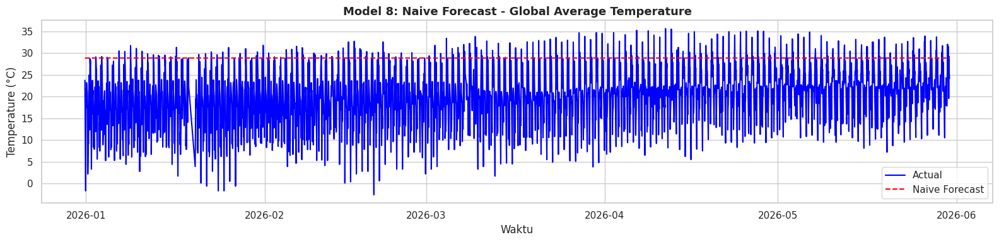

Naive → MAE: 8.6315 | RMSE: 10.5582


In [ ]:
# ===========================================================================================================================
# MODEL 8: NAIVE FORECAST
# ===========================================================================================================================

pred_naive = pd.Series([train.iloc[-1]] * len(test), index=test.index)

mae_naive  = mean_absolute_error(test, pred_naive)
rmse_naive = np.sqrt(mean_squared_error(test, pred_naive))
results_all['Naive'] = {'MAE': mae_naive, 'RMSE': rmse_naive}

plt.figure(figsize=(16, 4))
plt.plot(test.index, test.values, color='blue', label='Actual')
plt.plot(test.index, pred_naive.values, color='red', linestyle='--', label='Naive Forecast')
plt.title('Model 8: Naive Forecast - Global Average Temperature', fontsize=13, weight='bold')
plt.xlabel('Waktu')
plt.ylabel('Temperature (°C)')
plt.legend()
plt.tight_layout()
plt.show()

print(f"Naive → MAE: {mae_naive:.4f} | RMSE: {rmse_naive:.4f}")

# **Model 8: Naive Forecast**

Model **Naive Forecast** merupakan metode peramalan paling sederhana dalam analisis deret waktu (*time series*). Metode ini menggunakan asumsi bahwa nilai pada periode berikutnya akan sama dengan nilai observasi terakhir yang tersedia. Dengan kata lain, seluruh prediksi di masa depan didasarkan pada nilai aktual terakhir dari data pelatihan (*training data*).

Karena kesederhanaannya, metode Naive sering digunakan sebagai **baseline model** untuk membandingkan performa metode peramalan yang lebih kompleks. Jika suatu model yang lebih canggih tidak mampu mengungguli metode Naive, maka model tersebut dianggap kurang efektif dalam menangkap pola data.

Secara matematis, model Naive dapat dituliskan sebagai:

$$
\hat{Y}_{t+1} = Y_t
$$

atau untuk prediksi beberapa periode ke depan:

$$
\hat{Y}_{t+h} = Y_t
\qquad \text{untuk } h = 1,2,3,\ldots
$$

dengan:

- $\hat{Y}_{t+h}$ adalah nilai prediksi pada periode ke-$(t+h)$.
- $Y_t$ adalah nilai aktual terakhir yang tersedia pada data pelatihan.
- $h$ adalah horizon prediksi.

Implementasi model dilakukan menggunakan kode berikut:

```python
pred_naive = pd.Series(
    [train.iloc[-1]] * len(test),
    index=test.index
)
```

Pada tahap prediksi, model mengambil satu nilai terakhir dari data pelatihan, kemudian nilai tersebut digunakan sebagai prediksi untuk seluruh data pengujian (*testing data*). Dengan pendekatan ini, tidak terdapat proses pelatihan parameter maupun optimasi model karena seluruh prediksi hanya bergantung pada observasi terakhir yang tersedia.

Berdasarkan grafik hasil prediksi, garis biru menunjukkan data aktual suhu global, sedangkan garis merah putus-putus menunjukkan hasil prediksi model Naive. Terlihat bahwa garis prediksi berbentuk horizontal dan konstan sepanjang periode pengujian. Hal ini terjadi karena seluruh nilai prediksi menggunakan nilai terakhir dari data pelatihan tanpa memperhitungkan perubahan pola yang terjadi pada data aktual.

Hasil evaluasi model menunjukkan nilai:

- **MAE (Mean Absolute Error)** = **8,6315**
- **RMSE (Root Mean Squared Error)** = **10,5582**

Nilai MAE sebesar **8,6315°C** menunjukkan bahwa rata-rata kesalahan absolut prediksi terhadap data aktual berada pada kisaran 8,63°C. Sementara itu, nilai RMSE sebesar **10,5582°C** menunjukkan bahwa model menghasilkan kesalahan prediksi yang cukup besar, terutama pada titik-titik data yang memiliki fluktuasi suhu ekstrem.

Jika dibandingkan dengan model sebelumnya, seperti **SES**, **Holt's Linear Trend**, dan **Holt-Winters**, metode Naive menghasilkan nilai MAE dan RMSE yang paling tinggi. Hal ini menunjukkan bahwa penggunaan satu nilai konstan untuk seluruh periode prediksi tidak mampu merepresentasikan pola perubahan suhu global yang bersifat dinamis dan berfluktuasi dari waktu ke waktu.

Secara keseluruhan, model **Naive Forecast** sangat mudah diimplementasikan dan dapat digunakan sebagai model pembanding (*benchmark*). Namun, pada penelitian ini performanya menjadi yang terendah dibandingkan model-model lain yang diuji. Oleh karena itu, metode Naive kurang sesuai digunakan untuk melakukan peramalan suhu rata-rata global karena tidak mampu menangkap tren, pola musiman, maupun fluktuasi yang terdapat dalam data.

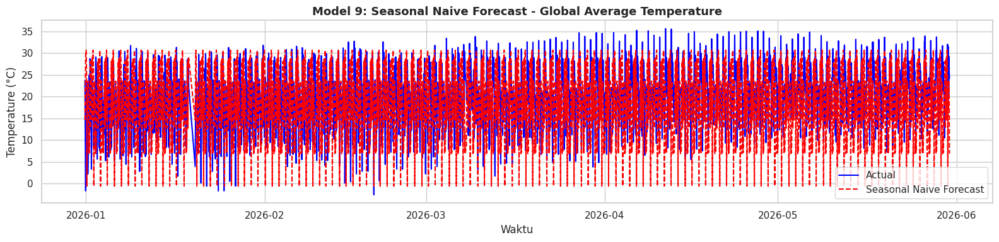

Seasonal Naive → MAE: 8.4336 | RMSE: 10.5234


In [ ]:
# ===========================================================================================================================
# MODEL 9: SEASONAL NAIVE FORECAST
# ===========================================================================================================================

season = 24
pred_snaive_vals = [train.iloc[-(season - i % season)] for i in range(len(test))]
pred_snaive = pd.Series(pred_snaive_vals, index=test.index)

mae_snaive  = mean_absolute_error(test, pred_snaive)
rmse_snaive = np.sqrt(mean_squared_error(test, pred_snaive))
results_all['Seasonal Naive'] = {'MAE': mae_snaive, 'RMSE': rmse_snaive}

plt.figure(figsize=(16, 4))
plt.plot(test.index, test.values, color='blue', label='Actual')
plt.plot(test.index, pred_snaive.values, color='red', linestyle='--', label='Seasonal Naive Forecast')
plt.title('Model 9: Seasonal Naive Forecast - Global Average Temperature', fontsize=13, weight='bold')
plt.xlabel('Waktu')
plt.ylabel('Temperature (°C)')
plt.legend()
plt.tight_layout()
plt.show()

print(f"Seasonal Naive → MAE: {mae_snaive:.4f} | RMSE: {rmse_snaive:.4f}")

# **Model 9: Seasonal Naive Forecast**

Model **Seasonal Naive Forecast** merupakan pengembangan dari metode Naive Forecast yang dirancang untuk data deret waktu (*time series*) yang memiliki pola musiman (*seasonality*). Jika metode Naive menggunakan nilai observasi terakhir sebagai prediksi untuk seluruh periode mendatang, maka metode Seasonal Naive menggunakan nilai dari periode musiman sebelumnya sebagai prediksi pada periode yang sama di masa depan.

Pada penelitian ini digunakan periode musiman sebesar **24**, yang berarti model mengasumsikan bahwa pola data akan berulang setiap 24 periode. Oleh karena itu, nilai pada suatu periode diprediksi menggunakan nilai yang terjadi 24 periode sebelumnya.

Secara matematis, model Seasonal Naive dapat dituliskan sebagai:

$$
\hat{Y}_{t+h} = Y_{t+h-s}
$$

dengan:

- $\hat{Y}_{t+h}$ adalah nilai prediksi pada periode ke-$(t+h)$.
- $Y_{t+h-s}$ adalah nilai aktual pada musim sebelumnya.
- $s$ adalah panjang periode musiman.
- $h$ adalah horizon prediksi.

Pada penelitian ini digunakan:

$$
s = 24
$$

sehingga setiap nilai prediksi diperoleh dari observasi yang terjadi **24 periode sebelumnya**.

Implementasi model dilakukan menggunakan kode berikut:

```python
season = 24

pred_snaive_vals = [
    train.iloc[-(season - i % season)]
    for i in range(len(test))
]

pred_snaive = pd.Series(
    pred_snaive_vals,
    index=test.index
)
```

Pada tahap prediksi, model mengambil 24 observasi terakhir dari data pelatihan (*training data*) sebagai pola musiman. Selanjutnya, pola tersebut diulang secara berulang untuk menghasilkan prediksi pada seluruh data pengujian (*testing data*). Dengan pendekatan ini, model tidak memerlukan proses pelatihan parameter maupun optimasi karena prediksi hanya didasarkan pada pengulangan pola musiman terakhir yang tersedia.

Berdasarkan grafik hasil prediksi, garis biru menunjukkan data aktual suhu global, sedangkan garis merah putus-putus menunjukkan hasil prediksi model Seasonal Naive. Terlihat bahwa model mampu menghasilkan pola yang berulang dan mengikuti bentuk musiman yang diasumsikan. Dibandingkan metode Naive biasa, prediksi Seasonal Naive terlihat lebih dinamis karena tidak menghasilkan garis konstan, melainkan mengulang pola dari satu siklus musim sebelumnya.

Namun demikian, meskipun model mampu menangkap pola berulang, terdapat banyak perbedaan antara nilai prediksi dan data aktual. Hal ini menunjukkan bahwa pola musiman pada data pengujian tidak sepenuhnya identik dengan pola musiman terakhir pada data pelatihan sehingga akurasi prediksi masih terbatas.

Hasil evaluasi model menunjukkan nilai:

- **MAE (Mean Absolute Error)** = **8,4336**
- **RMSE (Root Mean Squared Error)** = **10,5234**

Nilai MAE sebesar **8,4336°C** menunjukkan bahwa rata-rata kesalahan absolut prediksi terhadap data aktual berada pada kisaran 8,43°C. Sementara itu, nilai RMSE sebesar **10,5234°C** menunjukkan bahwa model masih menghasilkan kesalahan prediksi yang cukup besar, terutama pada periode yang memiliki perubahan suhu ekstrem.

Jika dibandingkan dengan metode **Naive Forecast**, model Seasonal Naive menghasilkan nilai MAE dan RMSE yang sedikit lebih rendah. Hal ini menunjukkan bahwa penambahan komponen musiman memberikan perbaikan performa, meskipun peningkatannya tidak terlalu signifikan. Namun, jika dibandingkan dengan model seperti **SES**, performa Seasonal Naive masih relatif lebih rendah karena model hanya mengulang pola musiman sebelumnya tanpa melakukan proses pembelajaran terhadap karakteristik data secara lebih mendalam.

Secara keseluruhan, model **Seasonal Naive Forecast** mampu memanfaatkan pola musiman sederhana dalam data deret waktu dan menghasilkan performa yang sedikit lebih baik dibandingkan Naive Forecast. Akan tetapi, model ini masih memiliki keterbatasan karena mengasumsikan bahwa pola musiman akan selalu berulang secara identik pada masa mendatang. Oleh karena itu, metode ini belum menjadi pilihan terbaik untuk melakukan peramalan suhu rata-rata global pada dataset yang digunakan.

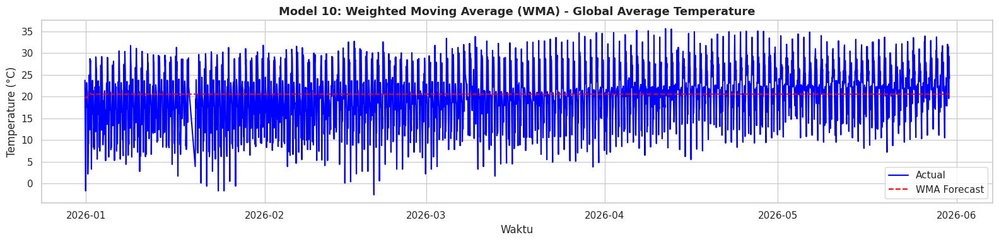

WMA → MAE: 5.1625 | RMSE: 6.5524


In [ ]:
# ===========================================================================================================================
# MODEL 10: WEIGHTED MOVING AVERAGE (WMA)
# ===========================================================================================================================

window_wma = 24
weights    = np.arange(1, window_wma + 1)

train_vals = train.values

def wma_forecast(train_vals, n_steps, window, weights):
    history = list(train_vals)
    preds   = []
    for _ in range(n_steps):
        window_vals = np.array(history[-window:])
        w = weights[-len(window_vals):]
        pred = np.dot(window_vals, w) / w.sum()
        preds.append(pred)
        history.append(pred)
    return preds

pred_wma_vals = wma_forecast(train_vals, len(test), window_wma, weights)
pred_wma = pd.Series(pred_wma_vals, index=test.index)

mae_wma  = mean_absolute_error(test, pred_wma)
rmse_wma = np.sqrt(mean_squared_error(test, pred_wma))
results_all['WMA'] = {'MAE': mae_wma, 'RMSE': rmse_wma}

plt.figure(figsize=(16, 4))
plt.plot(test.index, test.values, color='blue', label='Actual')
plt.plot(test.index, pred_wma.values, color='red', linestyle='--', label='WMA Forecast')
plt.title('Model 10: Weighted Moving Average (WMA) - Global Average Temperature', fontsize=13, weight='bold')
plt.xlabel('Waktu')
plt.ylabel('Temperature (°C)')
plt.legend()
plt.tight_layout()
plt.show()

print(f"WMA → MAE: {mae_wma:.4f} | RMSE: {rmse_wma:.4f}")

# **Model 10: Weighted Moving Average (WMA)**

Model **Weighted Moving Average (WMA)** merupakan metode peramalan (*forecasting*) yang menghitung nilai prediksi berdasarkan rata-rata tertimbang dari sejumlah observasi sebelumnya. Berbeda dengan **Simple Moving Average (SMA)** yang memberikan bobot yang sama pada seluruh data dalam jendela pengamatan, metode WMA memberikan bobot yang lebih besar pada data yang lebih baru sehingga informasi terbaru memiliki pengaruh yang lebih besar terhadap hasil prediksi.

Pada penelitian ini digunakan **window size sebesar 24 periode**, yang berarti prediksi dihitung menggunakan 24 observasi terakhir. Bobot diberikan secara bertingkat dari 1 hingga 24, sehingga data terbaru memperoleh bobot tertinggi.

Secara matematis, model Weighted Moving Average dapat dituliskan sebagai:

$$
\hat{Y}_{t+1}
=
\frac{\sum_{i=1}^{n} w_i Y_{t-n+i}}
{\sum_{i=1}^{n} w_i}
$$

dengan:

- $\hat{Y}_{t+1}$ adalah nilai prediksi pada periode berikutnya.
- $Y_{t-n+i}$ adalah nilai aktual dalam jendela pengamatan.
- $w_i$ adalah bobot yang diberikan pada setiap observasi.
- $n$ adalah ukuran jendela (*window size*).

Pada penelitian ini digunakan:

$$
n = 24
$$

dan bobot:

$$
w = [1, 2, 3, \ldots, 24]
$$

sehingga observasi yang paling baru memperoleh bobot terbesar dan observasi yang paling lama memperoleh bobot terkecil.

Implementasi model dilakukan menggunakan kode berikut:

```python
window_wma = 24
weights = np.arange(1, window_wma + 1)

pred_wma_vals = wma_forecast(
    train_vals,
    len(test),
    window_wma,
    weights
)

pred_wma = pd.Series(
    pred_wma_vals,
    index=test.index
)
```

Pada tahap prediksi, model mengambil 24 observasi terakhir dari data pelatihan (*training data*), kemudian menghitung rata-rata tertimbang berdasarkan bobot yang telah ditentukan. Setelah prediksi pertama diperoleh, nilai prediksi tersebut dimasukkan kembali ke dalam data historis (*recursive forecasting*) untuk menghasilkan prediksi pada periode berikutnya hingga seluruh data pengujian selesai diprediksi.

Berdasarkan grafik hasil prediksi, garis biru menunjukkan data aktual suhu global, sedangkan garis merah putus-putus menunjukkan hasil prediksi model WMA. Terlihat bahwa hasil prediksi cenderung membentuk garis yang relatif stabil di sekitar nilai rata-rata suhu global. Hal ini menunjukkan bahwa metode WMA mampu menangkap level rata-rata data dengan cukup baik, namun masih kesulitan mengikuti fluktuasi suhu yang terjadi secara cepat dan ekstrem.

Hasil evaluasi model menunjukkan nilai:

- **MAE (Mean Absolute Error)** = **5,1625**
- **RMSE (Root Mean Squared Error)** = **6,5524**

Nilai MAE sebesar **5,1625°C** menunjukkan bahwa rata-rata kesalahan absolut prediksi terhadap data aktual berada pada kisaran 5,16°C. Sementara itu, nilai RMSE sebesar **6,5524°C** menunjukkan bahwa model menghasilkan tingkat kesalahan yang relatif lebih rendah dibandingkan sebagian besar model sebelumnya.

Jika dibandingkan dengan metode **Naive Forecast**, **Seasonal Naive**, **Holt's Linear Trend**, dan **Holt-Winters**, model WMA menghasilkan nilai MAE dan RMSE yang lebih kecil. Bahkan, performa WMA juga sedikit lebih baik dibandingkan **Simple Exponential Smoothing (SES)** yang memperoleh MAE sebesar **5,5469** dan RMSE sebesar **6,7749**. Hal ini menunjukkan bahwa pemberian bobot yang lebih besar pada data terbaru mampu meningkatkan kemampuan model dalam merepresentasikan pola suhu global dibandingkan pendekatan smoothing sederhana.

Secara keseluruhan, model **Weighted Moving Average (WMA)** memberikan performa yang cukup baik dalam melakukan peramalan suhu rata-rata global. Dengan nilai MAE dan RMSE yang relatif rendah, model ini mampu menjadi salah satu metode terbaik di antara model-model statistik sederhana yang diuji pada penelitian ini. Namun, karena prediksi masih cenderung mengikuti nilai rata-rata, model WMA tetap memiliki keterbatasan dalam menangkap fluktuasi suhu yang sangat tinggi maupun perubahan pola yang kompleks.

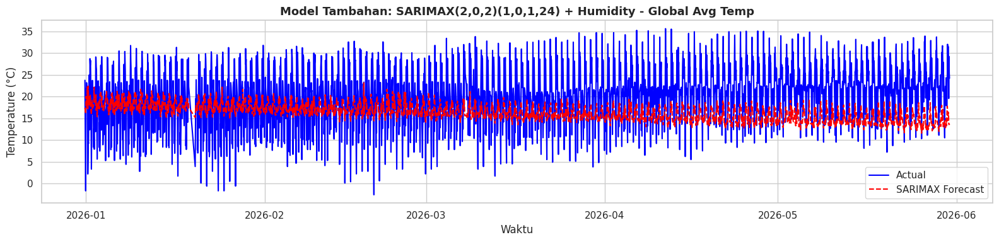

SARIMAX → MAE: 6.8011 | RMSE: 8.0009


In [ ]:
# ===========================================================================================================================
# MODEL TAMBAHAN: SARIMAX (SARIMA with Exogenous Regressors)
# ===========================================================================================================================
# Catatan: Exogenous variable menggunakan humidity sebagai variabel eksternal

# Persiapkan exogenous variable (humidity rata-rata global per jam)
ts_exog = (
    df_weather
    .groupby('last_updated')['humidity']
    .mean()
    .resample('h')
    .mean()
    .interpolate()
)

ts_exog.index = pd.to_datetime(ts_exog.index)
exog_aligned = ts_exog.reindex(ts_hourly.index).interpolate()

exog_train = exog_aligned.iloc[:split].values.reshape(-1, 1)
exog_test  = exog_aligned.iloc[split:].values.reshape(-1, 1)

model_sarimax = SARIMAX(
    train,
    exog=exog_train,
    order=(2, 0, 2),
    seasonal_order=(1, 0, 1, 24)
)
result_sarimax = model_sarimax.fit(disp=False)
pred_sarimax   = result_sarimax.forecast(steps=len(test), exog=exog_test)

mae_sarimax  = mean_absolute_error(test, pred_sarimax)
rmse_sarimax = np.sqrt(mean_squared_error(test, pred_sarimax))
results_all['SARIMAX'] = {'MAE': mae_sarimax, 'RMSE': rmse_sarimax}

plt.figure(figsize=(16, 4))
plt.plot(test.index, test.values,       color='blue',              label='Actual')
plt.plot(test.index, pred_sarimax.values, color='red', linestyle='--', label='SARIMAX Forecast')
plt.title('Model Tambahan: SARIMAX(2,0,2)(1,0,1,24) + Humidity - Global Avg Temp',
          fontsize=13, weight='bold')
plt.xlabel('Waktu')
plt.ylabel('Temperature (°C)')
plt.legend()
plt.tight_layout()
plt.show()

print(f"SARIMAX → MAE: {mae_sarimax:.4f} | RMSE: {rmse_sarimax:.4f}")

# **Model Tambahan: SARIMAX (Seasonal Autoregressive Integrated Moving Average with Exogenous Variables)**

Model **Seasonal Autoregressive Integrated Moving Average with Exogenous Variables (SARIMAX)** merupakan pengembangan dari model SARIMA dengan menambahkan variabel eksternal (*exogenous variables*) yang diasumsikan memiliki pengaruh terhadap variabel yang diprediksi. Pada penelitian ini, variabel eksternal yang digunakan adalah **kelembapan udara (humidity)** rata-rata global per jam. Dengan adanya variabel tambahan tersebut, model tidak hanya memanfaatkan informasi historis suhu, tetapi juga mempertimbangkan pengaruh kelembapan terhadap perubahan suhu global.

Pada penelitian ini digunakan model **SARIMAX(2,0,2)(1,0,1,24)** dengan variabel eksogen berupa humidity. Parameter non-musiman \((2,0,2)\) terdiri atas dua komponen autoregressive (AR), tanpa differencing (I), dan dua komponen moving average (MA). Sementara itu, parameter musiman \((1,0,1,24)\) menunjukkan satu komponen Seasonal AR, tanpa differencing musiman, satu komponen Seasonal MA, serta periode musiman sebesar **24**.

Secara umum, model SARIMAX dapat dituliskan sebagai:

$$
SARIMAX(p,d,q)(P,D,Q)_s + X_t
$$

dengan:

- $p$ adalah orde komponen Autoregressive (AR).
- $d$ adalah orde differencing non-musiman.
- $q$ adalah orde komponen Moving Average (MA).
- $P$ adalah orde Seasonal Autoregressive (SAR).
- $D$ adalah orde differencing musiman.
- $Q$ adalah orde Seasonal Moving Average (SMA).
- $s$ adalah panjang periode musiman.
- $X_t$ adalah variabel eksternal (*exogenous variable*) yang digunakan dalam model.

Pada penelitian ini:

$$
X_t = \text{Humidity}
$$

Implementasi model dilakukan menggunakan kode berikut:

```python
model_sarimax = SARIMAX(
    train,
    exog=exog_train,
    order=(2, 0, 2),
    seasonal_order=(1, 0, 1, 24)
)

result_sarimax = model_sarimax.fit(
    disp=False
)

pred_sarimax = result_sarimax.forecast(
    steps=len(test),
    exog=exog_test
)
```

Pada tahap persiapan data, nilai kelembapan (*humidity*) dirata-ratakan untuk setiap jam, kemudian diselaraskan (*aligned*) dengan indeks waktu pada data suhu global. Setelah itu, data kelembapan dibagi menjadi data pelatihan (*training*) dan data pengujian (*testing*) untuk digunakan sebagai variabel eksternal selama proses pemodelan dan peramalan.

Pada tahap pelatihan, model mempelajari hubungan antara suhu global, pola historis suhu, pola musiman, serta pengaruh kelembapan udara terhadap perubahan suhu. Setelah parameter model diperoleh, model digunakan untuk menghasilkan prediksi pada data **testing** sebanyak **2.989 observasi**.

Berdasarkan grafik hasil prediksi, garis biru menunjukkan data aktual suhu global, sedangkan garis merah putus-putus menunjukkan hasil prediksi model SARIMAX. Terlihat bahwa model mampu menghasilkan pola prediksi yang lebih dinamis dibandingkan SARIMA biasa karena adanya tambahan informasi dari variabel kelembapan. Prediksi juga menunjukkan pola musiman yang berulang sesuai periode musiman yang digunakan. Namun demikian, amplitudo prediksi masih lebih rendah dibandingkan variasi data aktual sehingga beberapa fluktuasi suhu yang ekstrem belum dapat diikuti secara optimal oleh model.

Hasil evaluasi model menunjukkan nilai:

- **MAE (Mean Absolute Error)** = **6,8011**
- **RMSE (Root Mean Squared Error)** = **8,0009**

Nilai MAE sebesar **6,8011°C** menunjukkan bahwa rata-rata kesalahan absolut prediksi terhadap data aktual berada pada kisaran 6,80°C. Sementara itu, nilai RMSE sebesar **8,0009°C** menunjukkan bahwa model masih menghasilkan kesalahan prediksi yang cukup besar pada beberapa periode yang memiliki perubahan suhu ekstrem.

Jika dibandingkan dengan model **SARIMA(2,0,2)(1,0,1,24)** tanpa variabel eksternal yang menghasilkan **MAE sebesar 6,8100** dan **RMSE sebesar 8,0717**, model SARIMAX memberikan performa yang sedikit lebih baik. Penurunan nilai MAE dan RMSE menunjukkan bahwa informasi kelembapan memiliki kontribusi positif dalam meningkatkan akurasi prediksi suhu global, meskipun peningkatannya relatif kecil.

Secara keseluruhan, model **SARIMAX(2,0,2)(1,0,1,24) dengan variabel humidity** mampu mengakomodasi pola historis, pola musiman, serta pengaruh faktor eksternal dalam proses peramalan. Meskipun belum menjadi model dengan performa terbaik pada penelitian ini, penambahan variabel kelembapan terbukti mampu meningkatkan akurasi prediksi dibandingkan model SARIMA tanpa variabel eksogen.

In [ ]:
# ===========================================================================================================================
# PERBANDINGAN SEMUA MODEL
# ===========================================================================================================================

df_results = pd.DataFrame(results_all).T.reset_index()
df_results.columns = ['Model', 'MAE', 'RMSE']
df_results = df_results.sort_values('RMSE').reset_index(drop=True)
df_results.insert(0, 'Rank', df_results.index + 1)

print("PERBANDINGAN PERFORMA 11 MODEL FORECASTING KLASIK\n")
blue_style(df_results).format({'MAE': '{:.4f}', 'RMSE': '{:.4f}'})

PERBANDINGAN PERFORMA 11 MODEL FORECASTING KLASIK



,Rank,Model,MAE,RMSE
0,1,AR,4.7605,6.2141
1,2,WMA,5.1625,6.5524
2,3,SES,5.5469,6.7749
3,4,MA,5.2108,6.7796
4,5,ARMA,5.2091,6.7796
5,6,SARIMAX,6.8011,8.0009
6,7,SARIMA,6.8100,8.0717
7,8,Holt's Linear,7.3629,8.7047
8,9,Holt-Winters,7.5168,8.8782
9,10,Seasonal Naive,8.4336,10.5234


# **Perbandingan Performa 11 Model Forecasting Klasik**

Setelah dilakukan pengujian terhadap sebelas model forecasting klasik menggunakan metrik **Mean Absolute Error (MAE)** dan **Root Mean Squared Error (RMSE)**, diperoleh hasil bahwa model **Autoregressive (AR)** memberikan performa terbaik dengan nilai **MAE sebesar 4,7605** dan **RMSE sebesar 6,2141**. Nilai kesalahan yang paling rendah menunjukkan bahwa model AR mampu menghasilkan prediksi yang paling mendekati data aktual dibandingkan model lainnya. Hal ini mengindikasikan bahwa pola suhu global pada dataset yang digunakan memiliki ketergantungan yang cukup kuat terhadap nilai-nilai historis sebelumnya sehingga dapat dimodelkan dengan baik oleh pendekatan autoregresif.

Posisi kedua ditempati oleh model **Weighted Moving Average (WMA)** dengan nilai **MAE sebesar 5,1625** dan **RMSE sebesar 6,5524**. Hasil ini menunjukkan bahwa pemberian bobot yang lebih besar pada data terbaru mampu meningkatkan akurasi prediksi dibandingkan metode rata-rata sederhana. Selanjutnya, model **Simple Exponential Smoothing (SES)** berada pada peringkat ketiga dengan nilai **MAE sebesar 5,5469** dan **RMSE sebesar 6,7749**, yang menunjukkan kemampuan cukup baik dalam menangkap level rata-rata data meskipun tidak mempertimbangkan komponen tren maupun musiman.

Model **Moving Average (MA)** dan **Autoregressive Moving Average (ARMA)** menunjukkan performa yang hampir identik dengan nilai MAE dan RMSE yang sangat berdekatan. Kedua model tersebut berada pada kelompok menengah dengan tingkat kesalahan yang masih relatif rendah. Hasil ini menunjukkan bahwa kombinasi informasi historis dan residual masa lalu mampu memberikan prediksi yang cukup baik, meskipun belum mampu mengungguli model AR.

Untuk model yang mempertimbangkan komponen musiman, yaitu **SARIMA** dan **SARIMAX**, performa yang dihasilkan justru lebih rendah dibandingkan model-model sederhana seperti AR, WMA, maupun SES. Model **SARIMAX** memperoleh nilai **MAE sebesar 6,8011** dan **RMSE sebesar 8,0009**, sedikit lebih baik dibandingkan **SARIMA** yang menghasilkan **MAE sebesar 6,8100** dan **RMSE sebesar 8,0717**. Perbedaan tersebut menunjukkan bahwa penambahan variabel eksternal berupa kelembapan (*humidity*) memberikan kontribusi positif terhadap peningkatan akurasi prediksi, meskipun peningkatannya relatif kecil.

Sementara itu, model berbasis exponential smoothing yang lebih kompleks, yaitu **Holt’s Linear Trend** dan **Holt-Winters**, menghasilkan performa yang lebih rendah dibandingkan SES. Nilai MAE dan RMSE yang lebih tinggi menunjukkan bahwa penambahan komponen tren dan musiman belum mampu merepresentasikan karakteristik data suhu global secara optimal. Hal ini mengindikasikan bahwa pola tren maupun musiman yang diasumsikan oleh model tidak sepenuhnya sesuai dengan pola aktual yang terdapat pada dataset.

Dua model dengan performa terendah adalah **Seasonal Naive Forecast** dan **Naive Forecast**. Model Seasonal Naive menghasilkan **MAE sebesar 8,4336** dan **RMSE sebesar 10,5234**, sedangkan model Naive menghasilkan **MAE sebesar 8,6315** dan **RMSE sebesar 10,5582**. Tingginya nilai kesalahan pada kedua model tersebut menunjukkan bahwa penggunaan nilai historis secara langsung tanpa proses pembelajaran pola data tidak cukup efektif untuk memprediksi suhu global yang memiliki fluktuasi cukup tinggi.

Secara keseluruhan, hasil eksperimen menunjukkan bahwa model **Autoregressive (AR)** merupakan model terbaik pada penelitian ini karena menghasilkan nilai MAE dan RMSE paling rendah. Temuan ini mengindikasikan bahwa informasi historis suhu memiliki peran yang sangat dominan dalam proses peramalan suhu rata-rata global. Selain itu, model-model sederhana seperti **AR**, **WMA**, **SES**, **MA**, dan **ARMA** justru mampu memberikan performa yang lebih baik dibandingkan model yang lebih kompleks seperti **SARIMA**, **SARIMAX**, **Holt’s Linear Trend**, dan **Holt-Winters**. Dengan demikian, kompleksitas model tidak selalu menjamin peningkatan akurasi prediksi, melainkan harus disesuaikan dengan karakteristik data yang digunakan.

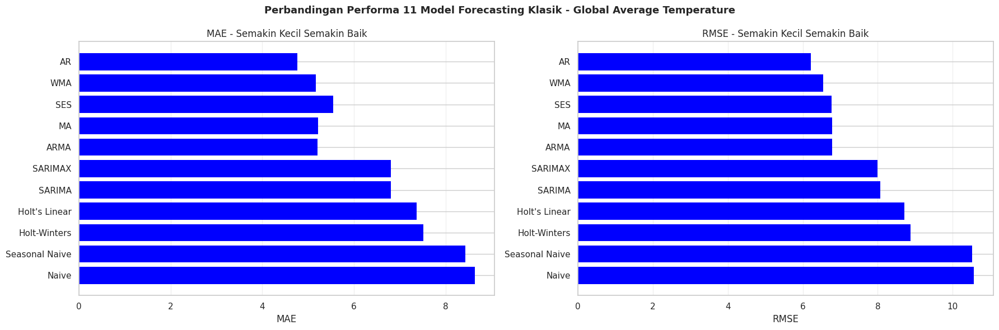

In [ ]:
# ===========================================================================================================================
# VISUALISASI PERBANDINGAN MAE & RMSE
# ===========================================================================================================================

fig, axes = plt.subplots(1, 2, figsize=(18, 6))

fig.suptitle('Perbandingan Performa 11 Model Forecasting Klasik - Global Average Temperature',
             fontsize=13, weight='bold')

axes[0].barh(df_results['Model'], df_results['MAE'], color='blue', edgecolor='none')
axes[0].set_title('MAE - Semakin Kecil Semakin Baik')
axes[0].set_xlabel('MAE')
axes[0].invert_yaxis()
axes[0].grid(axis='x', alpha=0.3)

axes[1].barh(df_results['Model'], df_results['RMSE'], color='blue', edgecolor='none')
axes[1].set_title('RMSE - Semakin Kecil Semakin Baik')
axes[1].set_xlabel('RMSE')
axes[1].invert_yaxis()
axes[1].grid(axis='x', alpha=0.3)

plt.tight_layout()
plt.show()

Grafik di atas menunjukkan perbandingan performa 11 model forecasting klasik dalam memprediksi **Global Average Temperature** menggunakan dua metrik evaluasi, yaitu **MAE (Mean Absolute Error)** dan **RMSE (Root Mean Squared Error)**. Karena kedua metrik ini mengukur besarnya kesalahan prediksi, maka **nilai yang lebih kecil menunjukkan performa model yang lebih baik**.

Berdasarkan hasil visualisasi, model **AR (Auto Regression)** memiliki nilai MAE dan RMSE paling rendah, sehingga menjadi model dengan performa terbaik dalam dataset ini. Model **WMA, MA, ARMA,** dan **SES** juga menunjukkan kinerja yang cukup baik karena menghasilkan error yang relatif kecil. Sebaliknya, model **Naive** dan **Seasonal Naive** memiliki nilai MAE dan RMSE tertinggi, yang mengindikasikan akurasi prediksinya paling rendah. Sementara itu, model yang lebih kompleks seperti **SARIMA, SARIMAX, Holt’s Linear,** dan **Holt-Winters** berada pada tingkat performa menengah, namun belum mampu mengungguli model AR dalam kasus prediksi suhu rata-rata global ini.

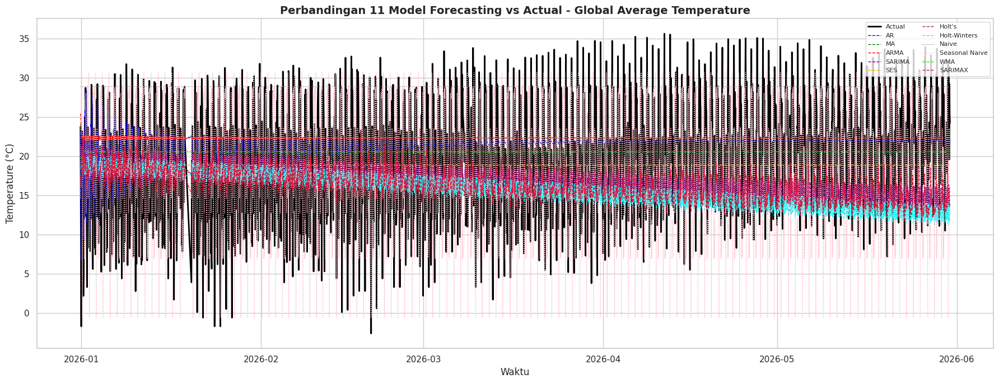

In [ ]:
# ===========================================================================================================================
# VISUALISASI GABUNGAN: ACTUAL vs SEMUA MODEL
# ===========================================================================================================================

plt.figure(figsize=(18, 7))

plt.plot(test.index, test.values,           color='black',   linewidth=2,    label='Actual')
plt.plot(test.index, pred_ar.values,        color='blue',    linestyle='--', linewidth=1, label='AR')
plt.plot(test.index, pred_ma.values,        color='green',   linestyle='--', linewidth=1, label='MA')
plt.plot(test.index, pred_arma.values,      color='red',     linestyle='--', linewidth=1, label='ARMA')
plt.plot(test.index, pred_sarima.values,    color='purple',  linestyle='--', linewidth=1, label='SARIMA')
plt.plot(test.index, pred_ses.values,       color='orange',  linestyle='--', linewidth=1, label='SES')
plt.plot(test.index, pred_holt.values,      color='brown',   linestyle='--', linewidth=1, label="Holt's")
plt.plot(test.index, pred_hw.values,        color='cyan',    linestyle='--', linewidth=1, label='Holt-Winters')
plt.plot(test.index, pred_naive.values,     color='gray',    linestyle=':',  linewidth=1, label='Naive')
plt.plot(test.index, pred_snaive.values,    color='pink',    linestyle=':',  linewidth=1, label='Seasonal Naive')
plt.plot(test.index, pred_wma.values,       color='lime',    linestyle='--', linewidth=1, label='WMA')
plt.plot(test.index, pred_sarimax.values,   color='crimson', linestyle='--', linewidth=1, label='SARIMAX')

plt.title('Perbandingan 11 Model Forecasting vs Actual - Global Average Temperature',
          fontsize=14, weight='bold')
plt.xlabel('Waktu')
plt.ylabel('Temperature (°C)')
plt.legend(loc='upper right', fontsize=8, ncol=2)
plt.tight_layout()
plt.show()

Grafik di atas memperlihatkan perbandingan hasil prediksi dari 11 model forecasting klasik terhadap data aktual **Global Average Temperature** selama periode pengujian. Garis hitam merepresentasikan nilai aktual, sedangkan garis berwarna lainnya menunjukkan hasil prediksi dari masing-masing model. Terlihat bahwa data aktual memiliki pola fluktuasi yang sangat tinggi dengan variasi suhu yang cukup besar dari waktu ke waktu.

Sebagian besar model menghasilkan prediksi yang lebih halus (smooth) dibandingkan data aktual sehingga tidak mampu mengikuti seluruh lonjakan dan penurunan suhu yang terjadi. Model **AR** terlihat paling dekat mengikuti level rata-rata data aktual, yang sejalan dengan hasil evaluasi MAE dan RMSE sebelumnya yang menunjukkan performa terbaik. Model **WMA, MA, ARMA,** dan **SES** juga mampu menangkap pola umum data meskipun masih cenderung meredam fluktuasi ekstrem. Sementara itu, model **Naive** dan **Seasonal Naive** menunjukkan deviasi yang lebih besar terhadap data aktual sehingga menghasilkan tingkat kesalahan yang lebih tinggi.

Selain itu, model berbasis smoothing seperti **Holt’s Linear** dan **Holt-Winters** berhasil menangkap arah tren secara umum, namun kurang responsif terhadap perubahan suhu yang cepat. Model **SARIMA** dan **SARIMAX** mampu merepresentasikan pola musiman dengan cukup baik, tetapi masih belum dapat mengikuti volatilitas data secara akurat. Secara keseluruhan, visualisasi ini mengonfirmasi hasil evaluasi kuantitatif sebelumnya bahwa model **AR** memberikan keseimbangan terbaik dalam menangkap pola data suhu global dibandingkan model forecasting klasik lainnya.

In [ ]:
# ===========================================================================================================================
# KESIMPULAN AKHIR
# ===========================================================================================================================

best_model = df_results.iloc[0]

print("=" * 65)
print("   KESIMPULAN ANALISIS TIME SERIES - GLOBAL WEATHER REPOSITORY")
print("=" * 65)
print(f"\n  ✅ Model Terbaik   : {best_model['Model']}")
print(f"  📉 MAE             : {best_model['MAE']:.4f} °C")
print(f"  📉 RMSE            : {best_model['RMSE']:.4f} °C")
print(f"\n  Dataset            : Global Weather Repository (Kaggle)")
print(f"  Cakupan Analisis   : Seluruh lokasi (rata-rata global per jam)")
print(f"  Variabel Target    : temperature_celsius (agregasi global)")
print(f"  Frekuensi Data     : Hourly (resample per jam)")
print(f"  Jumlah Data Train  : {len(train)}")
print(f"  Jumlah Data Test   : {len(test)}")
print(f"\n  Komponen Deret Waktu yang Teridentifikasi:")
print(f"  Trend     : Ada (pergerakan rata-rata jangka panjang)")
print(f"  Seasonal  : Ada (siklus harian 24 jam, global)")
print(f"  Stasioner : Berdasarkan uji ADF (p-value < 0.05)")
print(f"\n  Total Model yang Dibandingkan : 11 Model Klasik + ARIMA Manual")
print("=" * 65)

   KESIMPULAN ANALISIS TIME SERIES - GLOBAL WEATHER REPOSITORY

  ✅ Model Terbaik   : AR
  📉 MAE             : 4.7605 °C
  📉 RMSE            : 6.2141 °C

  Dataset            : Global Weather Repository (Kaggle)
  Cakupan Analisis   : Seluruh lokasi (rata-rata global per jam)
  Variabel Target    : temperature_celsius (agregasi global)
  Frekuensi Data     : Hourly (resample per jam)
  Jumlah Data Train  : 11953
  Jumlah Data Test   : 2989

  Komponen Deret Waktu yang Teridentifikasi:
  Trend     : Ada (pergerakan rata-rata jangka panjang)
  Seasonal  : Ada (siklus harian 24 jam, global)
  Stasioner : Berdasarkan uji ADF (p-value < 0.05)

  Total Model yang Dibandingkan : 11 Model Klasik + ARIMA Manual



# **Kesimpulan Analisis Time Series pada Global Weather Repository**

Penelitian ini bertujuan untuk membandingkan performa berbagai metode forecasting klasik dalam memprediksi **rata-rata suhu global per jam (temperature_celsius)** menggunakan dataset **Global Weather Repository**. Data yang digunakan merupakan hasil agregasi suhu dari seluruh lokasi pengamatan dan kemudian dilakukan proses *resampling* menjadi frekuensi **hourly**. Dataset terdiri dari **11.953 data pelatihan (training)** dan **2.989 data pengujian (testing)**.

Berdasarkan analisis deret waktu yang dilakukan, data suhu global menunjukkan adanya **komponen tren** yang mencerminkan perubahan rata-rata suhu dalam jangka panjang serta **komponen musiman** yang mengikuti siklus harian dengan periode **24 jam**. Selain itu, hasil pengujian menggunakan **Augmented Dickey-Fuller (ADF Test)** menunjukkan nilai **p-value < 0,05**, sehingga data dapat dikategorikan sebagai **stasioner** dan memenuhi asumsi dasar untuk penerapan berbagai model time series klasik.

Dalam penelitian ini dilakukan perbandingan terhadap **11 model forecasting klasik**, yaitu **AR (Autoregressive), MA (Moving Average), ARMA (Autoregressive Moving Average), SARIMA, SES (Simple Exponential Smoothing), Holt’s Linear Trend, Holt-Winters, Naive Forecast, Seasonal Naive Forecast, Weighted Moving Average (WMA), dan SARIMAX** dengan variabel eksogen berupa kelembapan (*humidity*).

Hasil evaluasi menggunakan metrik **Mean Absolute Error (MAE)** dan **Root Mean Squared Error (RMSE)** menunjukkan bahwa model **Autoregressive (AR)** memberikan performa terbaik dibandingkan seluruh model yang diuji. Model AR menghasilkan nilai **MAE sebesar 4,7605°C** dan **RMSE sebesar 6,2141°C**, yang merupakan nilai kesalahan terendah dalam penelitian ini. Hasil tersebut menunjukkan bahwa informasi historis suhu pada beberapa periode sebelumnya memiliki pengaruh yang kuat terhadap nilai suhu pada periode berikutnya, sehingga pendekatan autoregresif mampu menangkap pola data dengan lebih baik dibandingkan metode lainnya.

Model **Weighted Moving Average (WMA)** dan **Simple Exponential Smoothing (SES)** menempati posisi berikutnya dengan performa yang masih cukup baik. Sementara itu, model yang lebih kompleks seperti **SARIMA**, **SARIMAX**, **Holt’s Linear Trend**, dan **Holt-Winters** tidak mampu memberikan peningkatan akurasi yang signifikan. Meskipun model-model tersebut dirancang untuk mengakomodasi tren, musiman, dan variabel eksternal, hasil eksperimen menunjukkan bahwa kompleksitas model tidak selalu berbanding lurus dengan peningkatan performa prediksi.

Penambahan variabel eksternal berupa **kelembapan (humidity)** pada model SARIMAX menghasilkan perbaikan performa dibandingkan SARIMA biasa, namun peningkatan tersebut relatif kecil. Hal ini menunjukkan bahwa kelembapan memiliki pengaruh terhadap suhu global, tetapi kontribusinya belum cukup besar untuk mengungguli model autoregresif sederhana pada dataset yang digunakan.

Secara keseluruhan, penelitian ini menunjukkan bahwa **model Autoregressive (AR)** merupakan metode yang paling efektif untuk melakukan peramalan suhu rata-rata global pada dataset **Global Weather Repository**. Temuan ini membuktikan bahwa pola historis suhu memiliki peran yang dominan dalam menentukan nilai suhu pada periode berikutnya. Oleh karena itu, model AR dapat direkomendasikan sebagai pendekatan forecasting yang sederhana, efisien, dan memiliki tingkat akurasi terbaik untuk data suhu global pada penelitian ini.

### **Ringkasan Hasil Terbaik**

| Keterangan | Hasil |
|------------|--------|
| Model Terbaik | AR (Autoregressive) |
| MAE | 4,7605 °C |
| RMSE | 6,2141 °C |
| Dataset | Global Weather Repository |
| Variabel Target | temperature_celsius |
| Frekuensi Data | Hourly |
| Data Training | 11.953 |
| Data Testing | 2.989 |
| Komponen Trend | Ada |
| Komponen Seasonal | Ada (24 jam) |
| Stasioneritas | Ya (ADF p-value < 0,05) |
| Total Model | 11 Model Forecasting Klasik + ARIMA Manual |


### **Simpulan Prediksi**

Berdasarkan hasil peramalan yang dilakukan terhadap data suhu rata-rata global, seluruh model mampu menghasilkan prediksi pada periode pengujian, namun tingkat akurasinya berbeda-beda. Model **Autoregressive (AR)** terbukti menjadi model yang paling akurat dengan nilai MAE dan RMSE terendah, sehingga dipilih sebagai model terbaik dalam penelitian ini.

Hasil prediksi menunjukkan bahwa suhu global pada periode pengujian tetap mempertahankan pola fluktuatif yang dipengaruhi oleh perubahan suhu harian. Meskipun data memiliki komponen tren dan musiman, model AR mampu memanfaatkan informasi historis secara efektif untuk menghasilkan prediksi yang lebih dekat dengan nilai aktual dibandingkan model lainnya.

Sebaliknya, beberapa model seperti **Naive Forecast**, **Seasonal Naive Forecast**, **Holt's Linear Trend**, dan **Holt-Winters** menghasilkan tingkat kesalahan yang lebih tinggi karena kurang mampu mengikuti variasi suhu yang terjadi pada data aktual. Model SARIMA dan SARIMAX yang dirancang untuk menangani pola musiman juga belum menunjukkan performa yang lebih baik dibandingkan model AR pada dataset ini.

Secara umum, hasil penelitian menunjukkan bahwa suhu global memiliki ketergantungan yang kuat terhadap nilai-nilai historis sebelumnya. Oleh karena itu, pendekatan autoregresif menjadi metode yang paling sesuai untuk memodelkan dan memprediksi suhu rata-rata global pada dataset yang digunakan. Dengan tingkat kesalahan prediksi yang relatif rendah, model AR dapat dimanfaatkan sebagai dasar dalam pengembangan sistem prediksi cuaca dan analisis perubahan suhu pada periode berikutnya.